# Experiment Neural Networks on Dataset with five classes

In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf
import os
import random as rn
from os.path import join, getsize
from tensorflow.keras import layers
from tensorflow.keras import models
from keras.preprocessing import image
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, Callback
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.preprocessing import LabelBinarizer
from sklearn import metrics
import matplotlib.pyplot as plt
import matplotlib.style as style


from PIL import Image
from tqdm import tqdm

setting dynamic memory

In [2]:
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

#InteractiveSession().close

config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config = config)

## Load Dataset

In [3]:
BATCH_SIZE = 64
CHANNELS = 3
IMG_HEIGHT = 250
IMG_WIDTH = 250
IMG_SIZE=(IMG_HEIGHT, IMG_WIDTH)
INPUT_SHAPE=IMG_SIZE + (3,)  # --> (224,224,3)
NUM_CLASSES=5
AUTOTUNE = tf.data.AUTOTUNE
SHUFFLE_BUFFER_SIZE = 1024

Utilities

In [4]:
def reset_random_seed():
  """ Set the random seed.
   
  """
  # The below is necessary for reproducible results of certain Python hash-based operations.
  os.environ["PYTHONHASHSEED"]=str(2)

  # The below is necessary for starting Numpy generated random numbers in a well-defined initial state.
  np.random.seed(2)

  # The below is necessary for starting core Python generated random numbers in a well-defined state.
  rn.seed(2)

  # The below tf.random.set_seed will make random number generation in TensorFlow have a well-defined initial state.
  tf.random.set_seed(2)
  

def get_dataset(path, img_size = IMG_SIZE, batch_size = BATCH_SIZE, shuffle = True):
    """ Get the dataset given the directory name.
    Args:
    - apth (str): a string representing the name of the directory from which the dataset is retrieved.
    
    Returns:
    - ds (PrefetchDataset): a Dataset containing the elements in the directory.
  """
    return tf.keras.preprocessing.image_dataset_from_directory(
        path,
        seed = 2,
        image_size = img_size,
        batch_size = batch_size,
        shuffle = shuffle
    )


def show_history_fit(history):
  """Show the loss and accuracy on validation and training set.
    Args:
    - history : result of the fit function.
  
  """
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']

  loss = history.history['loss']
  val_loss = history.history['val_loss']

  plt.figure(figsize=(9, 9))
  plt.subplot(2, 2, 1)
  plt.plot(acc, label='Training Accuracy')
  plt.plot(val_acc, label='Validation Accuracy')
  plt.legend(loc='lower right')
  plt.ylabel('Accuracy')
  #plt.ylim([min(plt.ylim()),1])
  plt.title('Training and Validation Accuracy')

  plt.subplot(2, 2, 2)
  plt.plot(loss, label='Training Loss')
  plt.plot(val_loss, label='Validation Loss')
  plt.legend(loc='upper right')
  plt.ylabel('Cross Entropy')
  plt.ylim([0,3.0])
  plt.title('Training and Validation Loss')
  plt.xlabel('epoch')
  plt.show()


def compile_model(model, optimizer = 'adam', learning_rate = 0.0001):
  """ compile the model passed.
    Args:
    - model: model of a Neural Network
    - optimizer (str): specify the type of the optimizer.
    - learning_rate (float): specify the learning rate
    
  """

  if optimizer == 'rmsprop':
    model.compile(
      optimizer = tf.keras.optimizers.RMSprop(learning_rate),
      loss = tf.keras.losses.SparseCategoricalCrossentropy(),
      metrics = ['accuracy']
    )
  elif optimizer == 'adam':
    model.compile(
      optimizer = tf.keras.optimizers.Adam(learning_rate),
      loss = tf.keras.losses.SparseCategoricalCrossentropy(),
      metrics = ['accuracy']
    )
  elif optimizer == 'sgd':
    model.compile(
      optimizer = tf.keras.optimizers.SGD(learning_rate),
      loss = tf.keras.losses.SparseCategoricalCrossentropy(),
      metrics = ['accuracy']
    )
  
  model.summary()


def fit_model(model, train, validation, path_model, epochs_par = 30, patience_par = 6):
  """ fit the model.
    Args:
    - model: neural network model.
    - train: training set.
    - validation: validation set.
    - path_model: path in which the best model will be saved.
    - epoch_par: number of epochs.
    - patience_par: max number of epochs in which not have improvements.    
    Returns:
    - history: history of the training.
    - model: the last model trained during the fit.
  """

  earlystopping = EarlyStopping(monitor='val_loss', mode='min', patience= patience_par, verbose=1)

  checkpoint = ModelCheckpoint(path_model,   
        monitor='val_loss', mode='min', verbose=1, 
        save_best_only=True, save_freq='epoch'
  )

  history = model.fit(train, epochs= epochs_par,
                        validation_data=validation,
                        verbose=1,
                        shuffle=True, 
                        callbacks=[earlystopping, checkpoint])

  return history, model


def load_best_model_and_evaluate(path, test, optimizer = 'adam', learning_rate = 0.0001, compile = False):
  """ load the best model saved and evaluate it.
    Args:
    - path: path of the best model.
    - test: test set.
    - optimizer: type of optimizer.
    - learning_rate: specify the learning rate.
    - compile: boolean if compile or not the model.
     
  
  """

  model = tf.keras.models.load_model(path)

  if compile:
    compile_model(model, optimizer, learning_rate)

  model.evaluate(test)


  y_pred = []  # store predicted labels
  y_true = []  # store true labels

  # iterate over the dataset
  for image_batch, label_batch in test:   # use dataset.unbatch() with repeat
    # append true labels
    y_true.append(label_batch)
    # compute predictions
    preds = model.predict(image_batch)
    # append predicted labels
    y_pred.append(np.argmax(preds, axis = 1))

  # convert the true and predicted labels into tensors
  correct_labels = tf.concat([item for item in y_true], axis = 0)
  predicted_labels = tf.concat([item for item in y_pred], axis = 0)

  print(predicted_labels)
  print(correct_labels)

  print("Classification report: ")
  print(metrics.classification_report(correct_labels,predicted_labels,digits = 4))
  metrics.ConfusionMatrixDisplay.from_predictions(correct_labels, predicted_labels)


def plot_class_distribution(path, name):
  """ Plot in a bar char the class distribution of data contained in the directory passed as parameter."""
  
  classes = [name for name in os.listdir(path)] 
  class_distribution = {}
  for dir in classes:
    CURR_DIR = path + "/" + dir
    class_distribution[dir] = len([name for name in os.listdir(CURR_DIR) if os.path.isfile(os.path.join(CURR_DIR, name))])

  total = 0
  for class_ in class_distribution:
    print(f'{class_}: {class_distribution[class_]}')
    total += class_distribution[class_]

  print()
  print(f'Total:{total}')

  fig, axes = plt.subplots(figsize=(10,len(class_distribution)))
  plt.bar(class_distribution.keys(), height=class_distribution.values())
  plt.title(f'Barplot of class distribution of {name} dataset');


  

In [5]:
path_dataset = './multi_class_dataset_splitted_balanced/'
path_train = path_dataset + 'train/'
path_validation = path_dataset + 'validation/'
path_test = path_dataset + 'test/'
general_path_models = './models/'


In [6]:
reset_random_seed()
train_ds = get_dataset(path_train)
val_ds = get_dataset(path_validation)
test_ds = get_dataset(path_test)

Found 20000 files belonging to 5 classes.
Found 2505 files belonging to 5 classes.
Found 2498 files belonging to 5 classes.


amusement: 4000
awe: 4000
contentment: 4000
fear: 4000
sadness: 4000

Total:20000
amusement: 225
awe: 353
contentment: 1324
fear: 260
sadness: 343

Total:2505
amusement: 203
awe: 382
contentment: 1323
fear: 278
sadness: 312

Total:2498


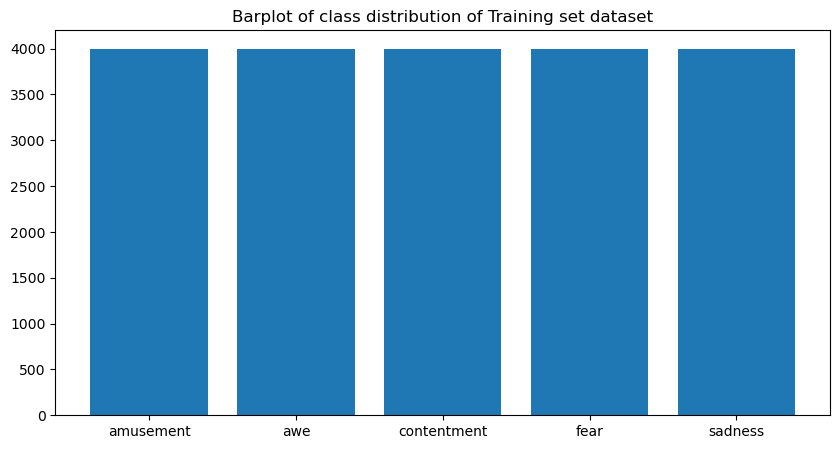

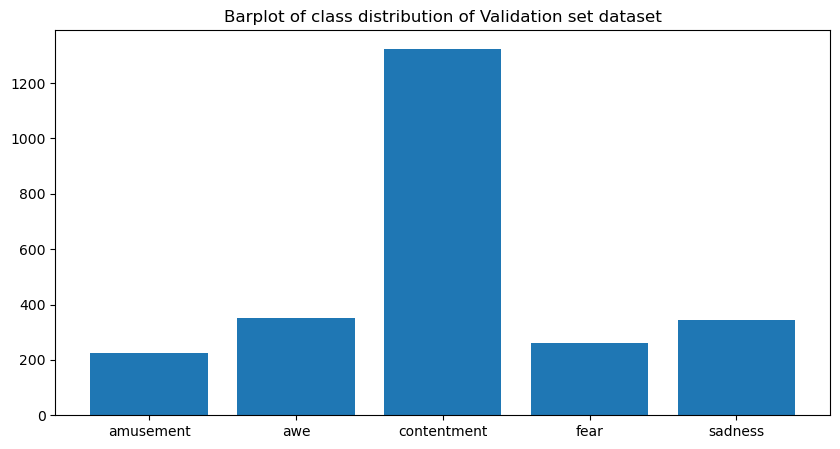

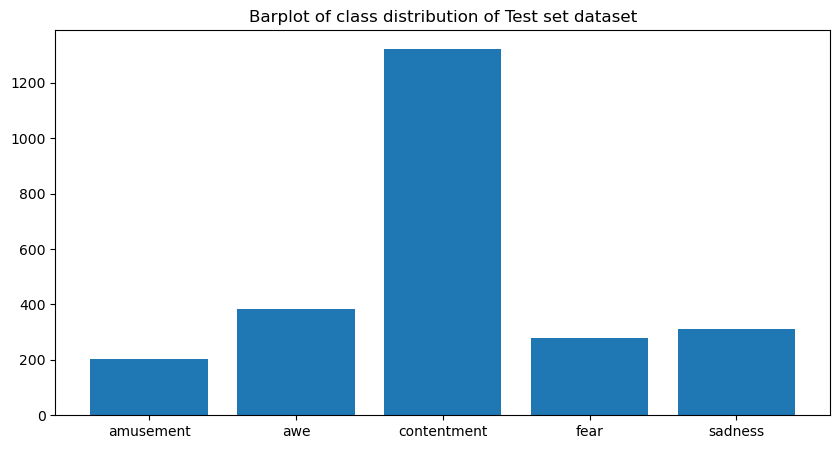

In [7]:
plot_class_distribution(path_train, 'Training set')

plot_class_distribution(path_validation, 'Validation set')

plot_class_distribution(path_test, 'Test set')

In [8]:
print(train_ds.class_names)


['amusement', 'awe', 'contentment', 'fear', 'sadness']


tf.Tensor(
[0 3 0 2 1 3 3 2 1 1 1 1 0 3 1 3 1 0 0 3 4 3 2 4 3 4 4 3 2 4 2 0 4 1 0 0 1
 3 4 2 4 2 0 0 0 0 1 4 4 4 4 0 3 3 2 4 0 0 2 1 4 0 4 0], shape=(64,), dtype=int32)


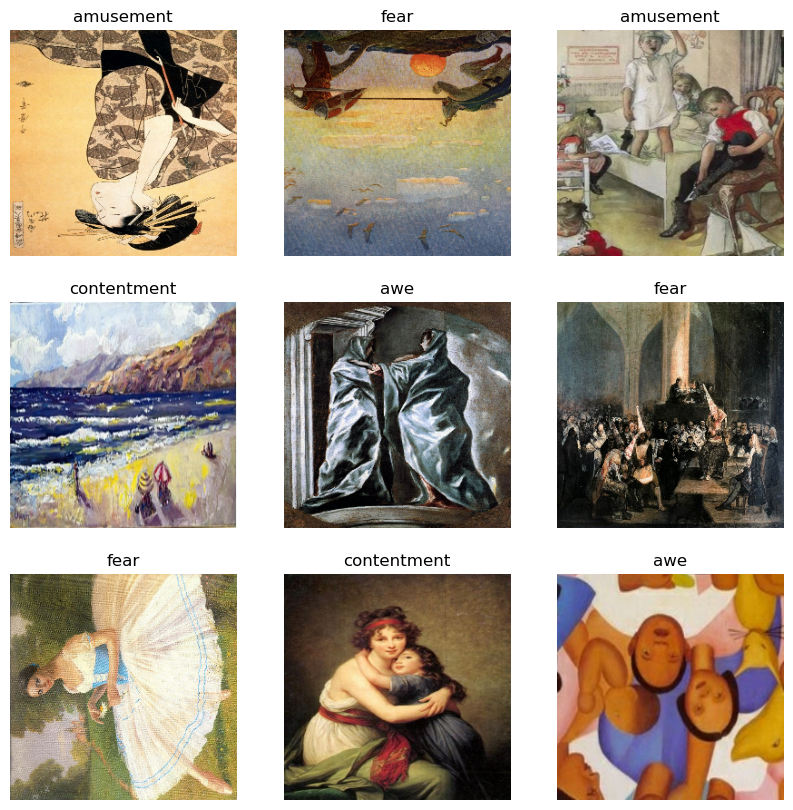

In [9]:
#visualize train samples
tf.random.set_seed(123)
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  print(labels)
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(train_ds.class_names[labels[i]])
    plt.axis("off")

In [10]:
train_ds = train_ds.prefetch(buffer_size = AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size = AUTOTUNE)
test_ds = test_ds.prefetch(buffer_size = AUTOTUNE)

## SCRATCH CNN

### Experiment 0 

Tiny example

In [16]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((5, 5))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((5, 5))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.Flatten()(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.3)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)
model = tf.keras.Model(inputs=input, outputs = output)

In [17]:
compile_model(model, 'adam', 0.0001)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_1 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 49, 49, 32)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 47, 47, 64)        18496     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 9, 9, 64)         0         
 2D)                                                       

In [18]:
path_model = general_path_models+'/majority_multiclass_models_sc/ex0_scratch_32_128_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, 40, 20)

Epoch 1/40
312/313 [============================>.] - ETA: 0s - loss: 1.5723 - accuracy: 0.2711
Epoch 00001: val_loss improved from inf to 1.57382, saving model to ./majority_multiclass_models_sc\ex0_scratch_32_128_epoch_30_adam_1e-4.h5
313/313 [==============================] - 41s 125ms/step - loss: 1.5722 - accuracy: 0.2712 - val_loss: 1.5738 - val_accuracy: 0.3265
Epoch 2/40
312/313 [============================>.] - ETA: 0s - loss: 1.5090 - accuracy: 0.3358
Epoch 00002: val_loss improved from 1.57382 to 1.40774, saving model to ./majority_multiclass_models_sc\ex0_scratch_32_128_epoch_30_adam_1e-4.h5
313/313 [==============================] - 40s 126ms/step - loss: 1.5090 - accuracy: 0.3358 - val_loss: 1.4077 - val_accuracy: 0.4168
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 1.4634 - accuracy: 0.3684
Epoch 00003: val_loss did not improve from 1.40774
313/313 [==============================] - 41s 127ms/step - loss: 1.4634 - accuracy: 0.3684 - val_loss: 1.5

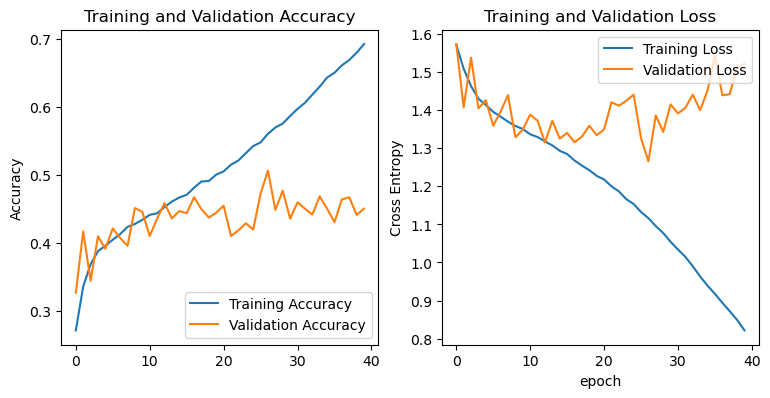

In [19]:
show_history_fit(history)

40/40 [==============================] - 5s 92ms/step - loss: 1.2629 - accuracy: 0.4996
tf.Tensor([2 2 2 ... 2 2 2], shape=(2498,), dtype=int64)
tf.Tensor([4 4 2 ... 2 2 4], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3187    0.2857    0.3013       203
           1     0.3121    0.2696    0.2893       382
           2     0.7047    0.6727    0.6883      1323
           3     0.3206    0.3309    0.3257       278
           4     0.2408    0.3365    0.2807       312

    accuracy                         0.4996      2498
   macro avg     0.3794    0.3791    0.3771      2498
weighted avg     0.5126    0.4996    0.5046      2498



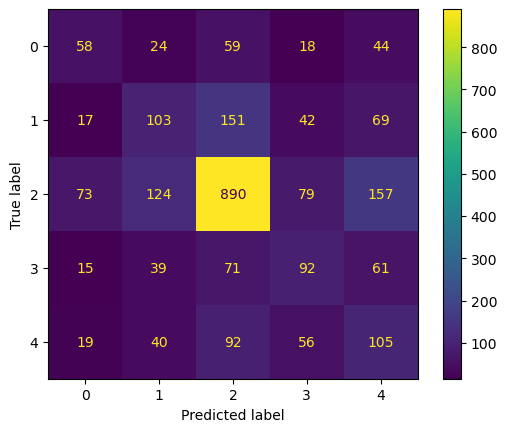

In [21]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 1 -- Add 2 layers of 256 filters

In [11]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)


x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)

x = layers.Flatten()(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [12]:
compile_model(model, 'adam', 0.0001)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 250, 250, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 124, 124, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 122, 122, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 61, 61, 64)       0         
 2D)                                                         

In [13]:
path_model = general_path_models+'/majority_multiclass_models_sc/ex1_scratch_32_2x256_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, epochs_par=40, patience_par=10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 1.5336 - accuracy: 0.3130
Epoch 00001: val_loss improved from inf to 1.52909, saving model to ./majority_multiclass_models_sc\ex1_scratch_32_2x256_epoch_30_adam_1e-4.h5
313/313 [==============================] - 77s 198ms/step - loss: 1.5336 - accuracy: 0.3130 - val_loss: 1.5291 - val_accuracy: 0.3537
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 1.4516 - accuracy: 0.3762
Epoch 00002: val_loss improved from 1.52909 to 1.46008, saving model to ./majority_multiclass_models_sc\ex1_scratch_32_2x256_epoch_30_adam_1e-4.h5
313/313 [==============================] - 62s 194ms/step - loss: 1.4516 - accuracy: 0.3762 - val_loss: 1.4601 - val_accuracy: 0.3701
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 1.4136 - accuracy: 0.3995
Epoch 00003: val_loss improved from 1.46008 to 1.36652, saving model to ./majority_multiclass_models_sc\ex1_scratch_32_2x256_epoch_30_adam_1e-4.h5
313/313

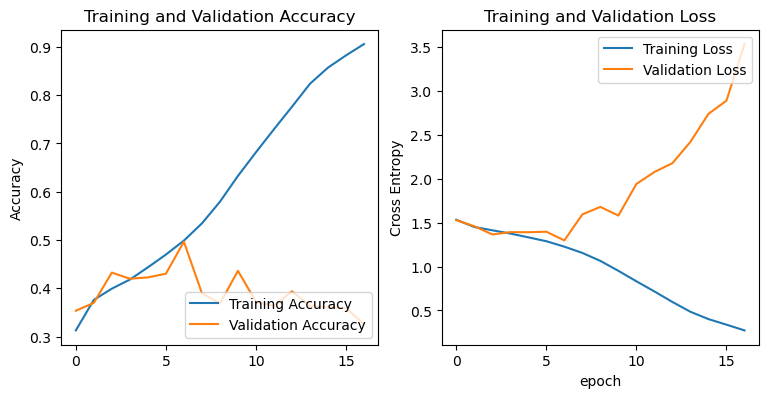

In [14]:
show_history_fit(history)

40/40 [==============================] - 5s 106ms/step - loss: 1.2904 - accuracy: 0.4920
tf.Tensor([4 2 3 ... 1 0 2], shape=(2498,), dtype=int64)
tf.Tensor([4 2 3 ... 3 2 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.2760    0.3399    0.3046       203
           1     0.2835    0.2382    0.2589       382
           2     0.6975    0.6727    0.6849      1323
           3     0.3580    0.3309    0.3439       278
           4     0.2208    0.2788    0.2465       312

    accuracy                         0.4920      2498
   macro avg     0.3672    0.3721    0.3678      2498
weighted avg     0.5026    0.4920    0.4961      2498



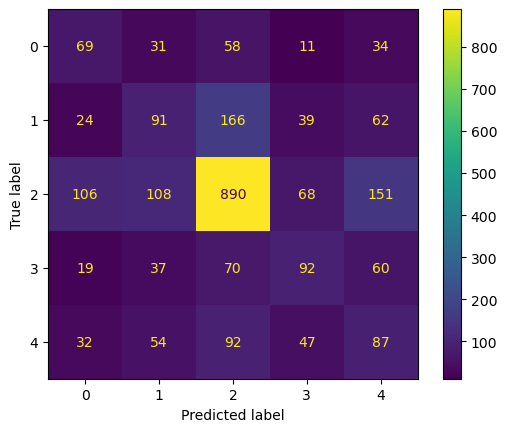

In [15]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 2 -- Add 1 layer of 512 filters

Add Dense Layer and Dropout

In [16]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)
x = layers.Flatten()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [17]:
compile_model(model, 'adam', 0.0001)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_1 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_5 (Conv2D)           (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 124, 124, 32)     0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 122, 122, 64)      18496     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 61, 61, 64)       0         
 2D)                                                       

In [18]:
path_model = general_path_models+'/majority_multiclass_models_sc/ex2_scratch_32_2x256_512_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, epochs_par=40, patience_par=10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 1.5621 - accuracy: 0.2878
Epoch 00001: val_loss improved from inf to 1.55341, saving model to ./majority_multiclass_models_sc\ex2_scratch_32_2x256_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 44s 137ms/step - loss: 1.5621 - accuracy: 0.2878 - val_loss: 1.5534 - val_accuracy: 0.3425
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 1.4756 - accuracy: 0.3573
Epoch 00002: val_loss improved from 1.55341 to 1.38033, saving model to ./majority_multiclass_models_sc\ex2_scratch_32_2x256_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 44s 138ms/step - loss: 1.4756 - accuracy: 0.3573 - val_loss: 1.3803 - val_accuracy: 0.4128
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 1.4358 - accuracy: 0.3812
Epoch 00003: val_loss did not improve from 1.38033
313/313 [==============================] - 43s 135ms/step - loss: 1.4358 - accuracy: 0.38

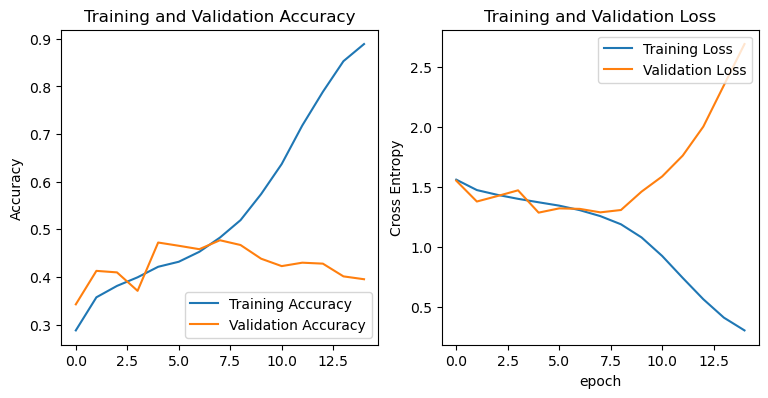

In [19]:
show_history_fit(history)

40/40 [==============================] - 5s 103ms/step - loss: 1.3040 - accuracy: 0.4476
tf.Tensor([4 2 3 ... 0 1 3], shape=(2498,), dtype=int64)
tf.Tensor([2 2 2 ... 2 4 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.2481    0.4877    0.3289       203
           1     0.2584    0.2618    0.2601       382
           2     0.7385    0.5465    0.6281      1323
           3     0.3750    0.3345    0.3536       278
           4     0.2124    0.3301    0.2585       312

    accuracy                         0.4476      2498
   macro avg     0.3665    0.3921    0.3658      2498
weighted avg     0.5191    0.4476    0.4708      2498



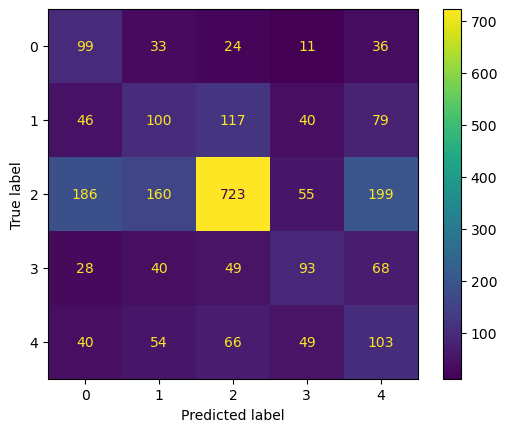

In [20]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 3 

More deep Network

In [21]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)

x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(1024, (3, 3), activation='relu')(x)

x = layers.Flatten()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [22]:
compile_model(model, 'adam', 0.0001)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_2 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_11 (Conv2D)          (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 124, 124, 32)     0         
 2D)                                                             
                                                                 
 conv2d_12 (Conv2D)          (None, 122, 122, 64)      18496     
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 61, 61, 64)       0         
 2D)                                                       

In [23]:
path_model = general_path_models+'/majority_multiclass_models_sc/ex3_scratch_32_2x256_1024_dp_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, epochs_par=40, patience_par=10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 1.5779 - accuracy: 0.2654
Epoch 00001: val_loss improved from inf to 1.60422, saving model to ./majority_multiclass_models_sc\ex3_scratch_32_2x256_1024_dp_epoch_30_adam_1e-4.h5
313/313 [==============================] - 44s 135ms/step - loss: 1.5779 - accuracy: 0.2654 - val_loss: 1.6042 - val_accuracy: 0.2136
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 1.4928 - accuracy: 0.3408
Epoch 00002: val_loss improved from 1.60422 to 1.47196, saving model to ./majority_multiclass_models_sc\ex3_scratch_32_2x256_1024_dp_epoch_30_adam_1e-4.h5
313/313 [==============================] - 43s 136ms/step - loss: 1.4928 - accuracy: 0.3408 - val_loss: 1.4720 - val_accuracy: 0.3613
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 1.4377 - accuracy: 0.3824
Epoch 00003: val_loss improved from 1.47196 to 1.44146, saving model to ./majority_multiclass_models_sc\ex3_scratch_32_2x256_1024_dp_epoch

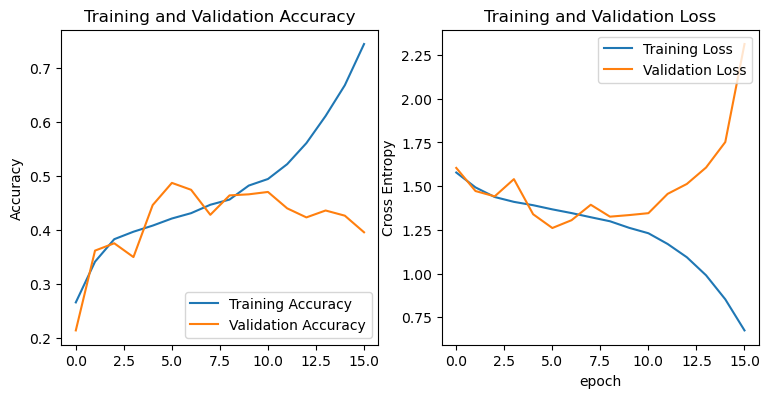

In [24]:
show_history_fit(history)

40/40 [==============================] - 5s 102ms/step - loss: 1.2753 - accuracy: 0.4716
tf.Tensor([2 0 2 ... 4 2 2], shape=(2498,), dtype=int64)
tf.Tensor([4 4 2 ... 2 2 4], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3542    0.3350    0.3443       203
           1     0.2577    0.1309    0.1736       382
           2     0.7283    0.6138    0.6661      1323
           3     0.3453    0.4137    0.3764       278
           4     0.2003    0.4263    0.2725       312

    accuracy                         0.4716      2498
   macro avg     0.3772    0.3839    0.3666      2498
weighted avg     0.5173    0.4716    0.4833      2498



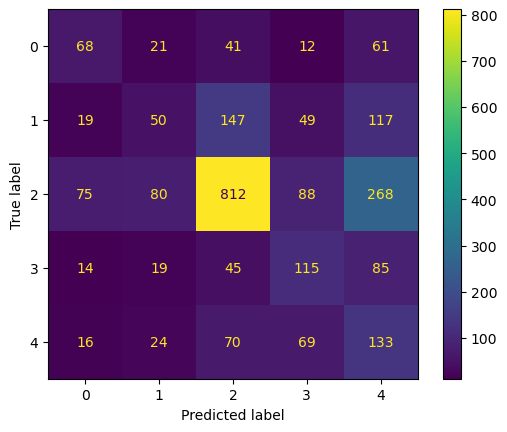

In [25]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 4  

Insert GlobalAveragingPooling and Another dropout (to mitigate the overfit)

In [26]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)
x = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(x)

x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(1024, (3, 3), activation='relu')(x)

x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [27]:
compile_model(model, 'adam', 0.0001)

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_3 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_18 (Conv2D)          (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 124, 124, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_19 (Conv2D)          (None, 122, 122, 64)      18496     
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 61, 61, 64)       0         
 g2D)                                                      

In [28]:
path_model = general_path_models+'/majority_multiclass_models_sc/ex4_scratch_32_2x256_1024_dpx2_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, epochs_par=40, patience_par=10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 1.5835 - accuracy: 0.2544
Epoch 00001: val_loss improved from inf to 1.47548, saving model to ./majority_multiclass_models_sc\ex4_scratch_32_2x256_1024_dpx2_epoch_40_adam_1e-4.h5
313/313 [==============================] - 46s 140ms/step - loss: 1.5835 - accuracy: 0.2544 - val_loss: 1.4755 - val_accuracy: 0.4156
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 1.4955 - accuracy: 0.3365
Epoch 00002: val_loss improved from 1.47548 to 1.46613, saving model to ./majority_multiclass_models_sc\ex4_scratch_32_2x256_1024_dpx2_epoch_40_adam_1e-4.h5
313/313 [==============================] - 45s 139ms/step - loss: 1.4955 - accuracy: 0.3365 - val_loss: 1.4661 - val_accuracy: 0.3780
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 1.4611 - accuracy: 0.3591
Epoch 00003: val_loss did not improve from 1.46613
313/313 [==============================] - 44s 138ms/step - loss: 1.4611 - accuracy

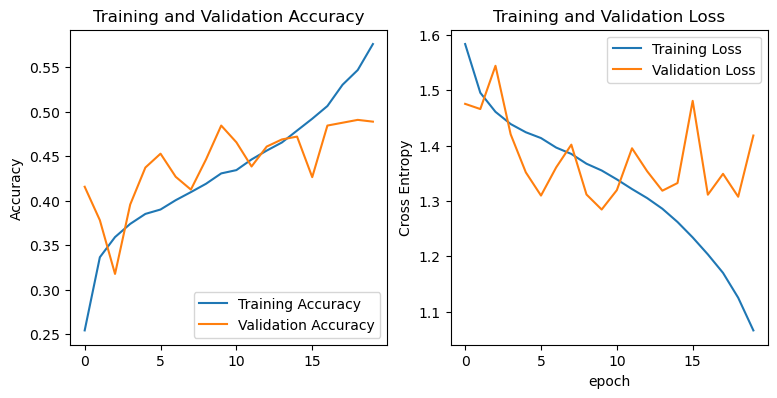

In [29]:
show_history_fit(history)

40/40 [==============================] - 5s 105ms/step - loss: 1.2925 - accuracy: 0.4768
tf.Tensor([2 2 2 ... 3 3 2], shape=(2498,), dtype=int64)
tf.Tensor([2 2 4 ... 1 1 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3269    0.4187    0.3672       203
           1     0.2746    0.1021    0.1489       382
           2     0.7219    0.6221    0.6683      1323
           3     0.3088    0.4676    0.3720       278
           4     0.2131    0.3654    0.2692       312

    accuracy                         0.4768      2498
   macro avg     0.3691    0.3952    0.3651      2498
weighted avg     0.5119    0.4768    0.4816      2498



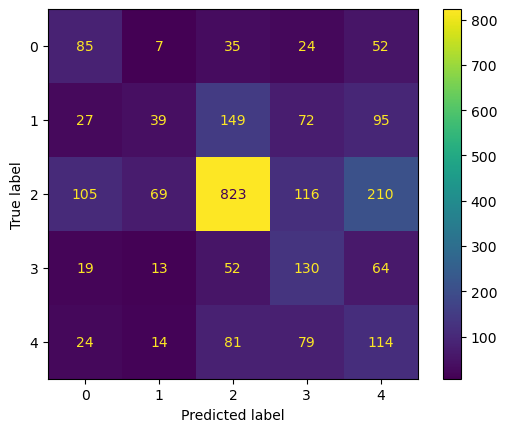

In [30]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 5 

Dropout + Regularization L2 (on Conv Layers)

In [41]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)
x = layers.Conv2D(512, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(1024, (3, 3), activation='relu')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [42]:
compile_model(model, 'adam', 0.0001)

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_7 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_50 (Conv2D)          (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d_31 (MaxPoolin  (None, 124, 124, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_51 (Conv2D)          (None, 122, 122, 64)      18496     
                                                                 
 max_pooling2d_32 (MaxPoolin  (None, 61, 61, 64)       0         
 g2D)                                                      

In [43]:
path_model = general_path_models+'/majority_multiclass_models_sc/ex5_scratch_32_2x256_1024_dpx2_regulariz_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, epochs_par=80, patience_par=20)

Epoch 1/80
313/313 [==============================] - ETA: 0s - loss: 1.9772 - accuracy: 0.2275
Epoch 00001: val_loss improved from inf to 1.69840, saving model to ./majority_multiclass_models_sc\ex5_scratch_32_2x256_1024_dpx2_regulariz_epoch_30_adam_1e-4.h5
313/313 [==============================] - 45s 139ms/step - loss: 1.9772 - accuracy: 0.2275 - val_loss: 1.6984 - val_accuracy: 0.3832
Epoch 2/80
313/313 [==============================] - ETA: 0s - loss: 1.6188 - accuracy: 0.3117
Epoch 00002: val_loss improved from 1.69840 to 1.49451, saving model to ./majority_multiclass_models_sc\ex5_scratch_32_2x256_1024_dpx2_regulariz_epoch_30_adam_1e-4.h5
313/313 [==============================] - 44s 139ms/step - loss: 1.6188 - accuracy: 0.3117 - val_loss: 1.4945 - val_accuracy: 0.4140
Epoch 3/80
313/313 [==============================] - ETA: 0s - loss: 1.5491 - accuracy: 0.3336
Epoch 00003: val_loss did not improve from 1.49451
313/313 [==============================] - 44s 138ms/step - los

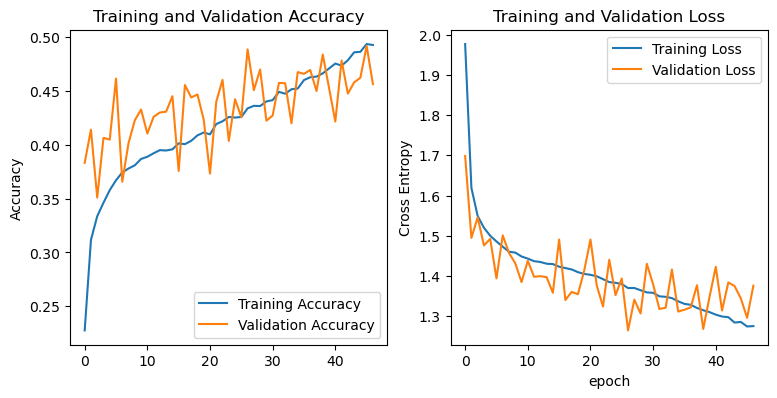

In [44]:
show_history_fit(history)

40/40 [==============================] - 6s 110ms/step - loss: 1.2660 - accuracy: 0.4900
tf.Tensor([3 4 4 ... 2 2 4], shape=(2498,), dtype=int64)
tf.Tensor([3 4 4 ... 2 2 4], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3154    0.3744    0.3423       203
           1     0.2610    0.2801    0.2702       382
           2     0.7156    0.6259    0.6677      1323
           3     0.4417    0.3813    0.4093       278
           4     0.2378    0.3429    0.2808       312

    accuracy                         0.4900      2498
   macro avg     0.3943    0.4009    0.3941      2498
weighted avg     0.5234    0.4900    0.5034      2498



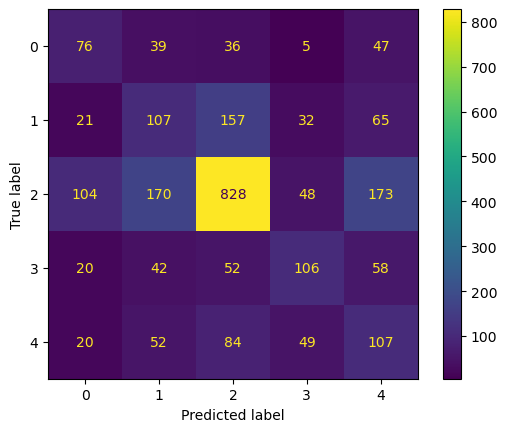

In [45]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 6

Remove some conv layers

In [21]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)
x = layers.Conv2D(512, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(1024, (3, 3), activation='relu')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001))(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [22]:
compile_model(model, 'adam', 0.001)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_2 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_16 (Conv2D)          (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 124, 124, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_17 (Conv2D)          (None, 122, 122, 64)      18496     
                                                                 
 conv2d_18 (Conv2D)          (None, 120, 120, 128)     73856     
                                                           

In [23]:
path_model = general_path_models+'/majority_multiclass_models_sc/ex6_scratch_32_2x256_1024_dpx2_regulariz_batchNorm_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, epochs_par=40, patience_par=10)

Epoch 1/40
438/438 [==============================] - ETA: 0s - loss: 2.0627 - accuracy: 0.1434
Epoch 00001: val_loss improved from inf to 1.95724, saving model to ./multiclass_models_sc\ex6_scratch_32_2x256_1024_dpx2_regulariz_batchNorm_epoch_30_adam_1e-4.h5
438/438 [==============================] - 151s 335ms/step - loss: 2.0627 - accuracy: 0.1434 - val_loss: 1.9572 - val_accuracy: 0.0992
Epoch 2/40
438/438 [==============================] - ETA: 0s - loss: 1.9480 - accuracy: 0.1397
Epoch 00002: val_loss improved from 1.95724 to 1.94944, saving model to ./multiclass_models_sc\ex6_scratch_32_2x256_1024_dpx2_regulariz_batchNorm_epoch_30_adam_1e-4.h5
438/438 [==============================] - 142s 321ms/step - loss: 1.9480 - accuracy: 0.1397 - val_loss: 1.9494 - val_accuracy: 0.0992
Epoch 3/40
438/438 [==============================] - ETA: 0s - loss: 1.9463 - accuracy: 0.1394
Epoch 00003: val_loss improved from 1.94944 to 1.94590, saving model to ./multiclass_models_sc\ex6_scratch_32_

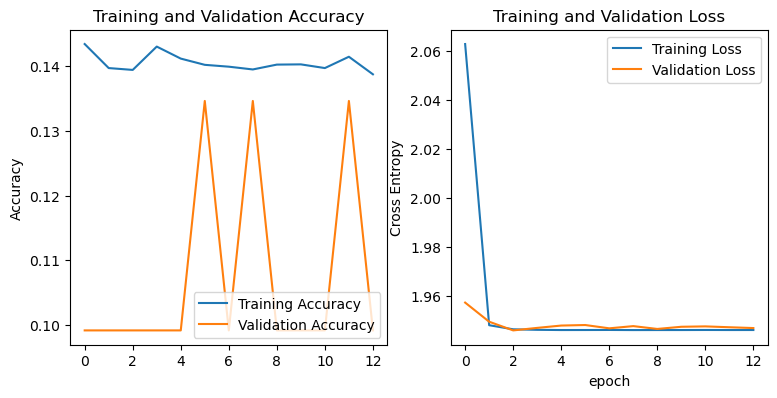

In [24]:
show_history_fit(history)

41/41 [==============================] - 11s 205ms/step - loss: 1.9455 - accuracy: 0.1060
tf.Tensor([5 5 5 ... 5 5 5], shape=(2622,), dtype=int64)
tf.Tensor([0 5 2 ... 1 6 0], shape=(2622,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000       203
           1     0.0000    0.0000    0.0000       382
           2     0.0000    0.0000    0.0000      1323
           3     0.0000    0.0000    0.0000        51
           4     0.0000    0.0000    0.0000        73
           5     0.1060    1.0000    0.1917       278
           6     0.0000    0.0000    0.0000       312

    accuracy                         0.1060      2622
   macro avg     0.0151    0.1429    0.0274      2622
weighted avg     0.0112    0.1060    0.0203      2622



c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


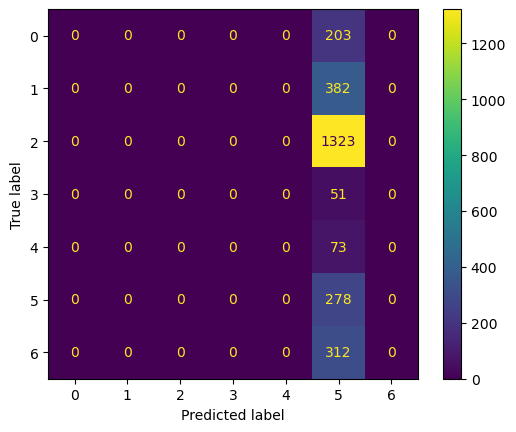

In [25]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 7 

As in experiment 6 but with some modification

In [11]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)

x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)
x = layers.Conv2D(512, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)

x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(1024, (3, 3), activation='relu')(x)

x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001))(x)
x = layers.Dropout(0.3)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [12]:
compile_model(model, 'adam', 0.0001)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 250, 250, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 124, 124, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 122, 122, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 61, 61, 64)       0         
 2D)                                                         

In [13]:
path_model = general_path_models+'/majority_multiclass_models_sc/ex7_scratch_32_2x256_1024_dpx2_regulariz_batchNorm_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, epochs_par=40, patience_par=10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 3.1906 - accuracy: 0.3160
Epoch 00001: val_loss improved from inf to 3.10318, saving model to ./majority_multiclass_models_sc\ex7_scratch_32_2x256_1024_dpx2_regulariz_batchNorm_epoch_40_adam_1e-4.h5
313/313 [==============================] - 86s 237ms/step - loss: 3.1906 - accuracy: 0.3160 - val_loss: 3.1032 - val_accuracy: 0.1792
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 2.9561 - accuracy: 0.3544
Epoch 00002: val_loss improved from 3.10318 to 2.88244, saving model to ./majority_multiclass_models_sc\ex7_scratch_32_2x256_1024_dpx2_regulariz_batchNorm_epoch_40_adam_1e-4.h5
313/313 [==============================] - 74s 231ms/step - loss: 2.9561 - accuracy: 0.3544 - val_loss: 2.8824 - val_accuracy: 0.3541
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 2.7848 - accuracy: 0.3769
Epoch 00003: val_loss improved from 2.88244 to 2.66757, saving model to ./majority_multiclass_

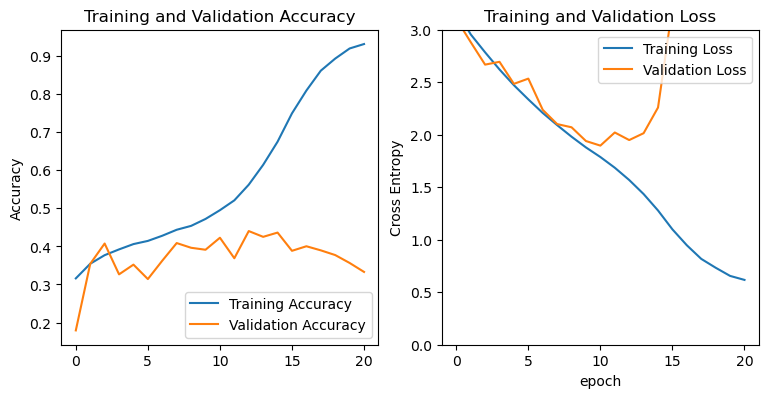

In [14]:
show_history_fit(history)

40/40 [==============================] - 7s 146ms/step - loss: 1.8847 - accuracy: 0.4420
tf.Tensor([1 2 3 ... 1 1 2], shape=(2498,), dtype=int64)
tf.Tensor([4 2 3 ... 3 2 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.2521    0.4384    0.3201       203
           1     0.2437    0.6047    0.3474       382
           2     0.7610    0.5079    0.6092      1323
           3     0.3542    0.3058    0.3282       278
           4     0.3649    0.0865    0.1399       312

    accuracy                         0.4420      2498
   macro avg     0.3952    0.3887    0.3490      2498
weighted avg     0.5458    0.4420    0.4558      2498



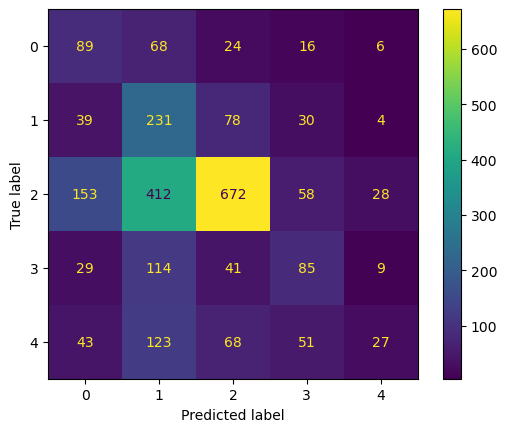

In [15]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 8 

Network with less layers and Regularization L2

In [16]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)

x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [17]:
compile_model(model, 'adam', 0.0001)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 rescaling_1 (Rescaling)     (None, 240, 240, 3)       0         
                                                                 
 conv2d_8 (Conv2D)           (None, 238, 238, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 119, 119, 32)     0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 117, 117, 64)      18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 58, 58, 64)       0         
 2D)                                                       

In [18]:
path_model = general_path_models+'/majority_multiclass_models_sc/ex8_scratch_32_2x256_512_dp_regular_batchnorm_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, epochs_par=60, patience_par=20)

Epoch 1/60
313/313 [==============================] - ETA: 0s - loss: 8.2404 - accuracy: 0.3408
Epoch 00001: val_loss improved from inf to 6.13475, saving model to ./majority_multiclass_models_sc\ex8_scratch_32_2x256_512_dp_regular_batchnorm_epoch_30_adam_1e-4.h5
313/313 [==============================] - 59s 180ms/step - loss: 8.2404 - accuracy: 0.3408 - val_loss: 6.1348 - val_accuracy: 0.4926
Epoch 2/60
313/313 [==============================] - ETA: 0s - loss: 4.9262 - accuracy: 0.3737
Epoch 00002: val_loss improved from 6.13475 to 3.81847, saving model to ./majority_multiclass_models_sc\ex8_scratch_32_2x256_512_dp_regular_batchnorm_epoch_30_adam_1e-4.h5
313/313 [==============================] - 60s 184ms/step - loss: 4.9262 - accuracy: 0.3737 - val_loss: 3.8185 - val_accuracy: 0.4814
Epoch 3/60
313/313 [==============================] - ETA: 0s - loss: 3.3545 - accuracy: 0.3891
Epoch 00003: val_loss improved from 3.81847 to 2.84261, saving model to ./majority_multiclass_models_sc\

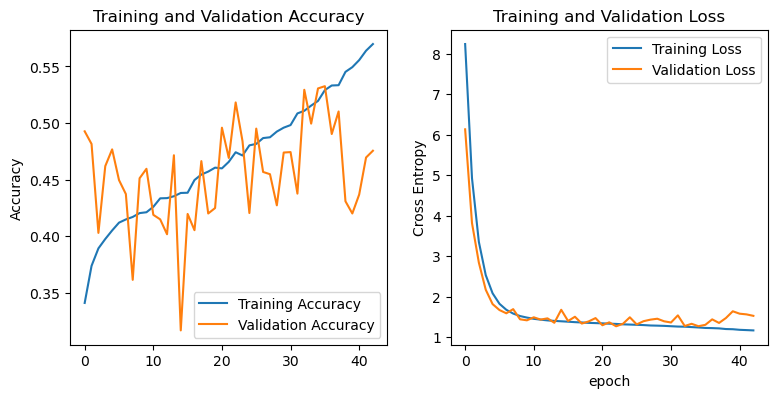

In [19]:
show_history_fit(history)

40/40 [==============================] - 6s 108ms/step - loss: 1.2591 - accuracy: 0.5156
tf.Tensor([1 2 3 ... 2 1 1], shape=(2498,), dtype=int64)
tf.Tensor([2 2 2 ... 2 4 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.2884    0.4532    0.3525       203
           1     0.3301    0.3534    0.3413       382
           2     0.7355    0.6788    0.7060      1323
           3     0.3114    0.4424    0.3655       278
           4     0.2597    0.1282    0.1717       312

    accuracy                         0.5156      2498
   macro avg     0.3850    0.4112    0.3874      2498
weighted avg     0.5305    0.5156    0.5169      2498



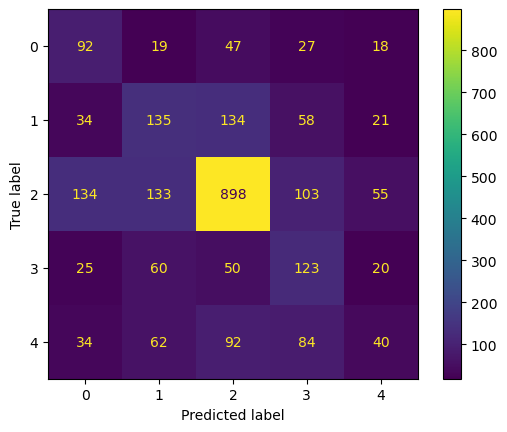

In [20]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 9

Add BatchNormalization and use Regularization L1

In [21]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.L1(0.001))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.L1(0.001))(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)
x = layers.Conv2D(512, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.L1(0.001))(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(1024, (3, 3), activation='relu')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.L1(0.001))(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [22]:
compile_model(model, 'adam', 0.0001)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 rescaling_2 (Rescaling)     (None, 240, 240, 3)       0         
                                                                 
 conv2d_14 (Conv2D)          (None, 238, 238, 32)      896       
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 119, 119, 32)     0         
 2D)                                                             
                                                                 
 conv2d_15 (Conv2D)          (None, 117, 117, 64)      18496     
                                                                 
 conv2d_16 (Conv2D)          (None, 115, 115, 128)     73856     
                                                           

In [23]:
path_model = general_path_models+'/majority_multiclass_models_sc/ex9_scratch_32_2x256_512_1024_dp_regularL1_batchnorm_epoch_35_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, 80, 30) #240x240

Epoch 1/80
313/313 [==============================] - ETA: 0s - loss: 42.0023 - accuracy: 0.2986
Epoch 00001: val_loss improved from inf to 23.61296, saving model to ./majority_multiclass_models_sc\ex9_scratch_32_2x256_512_1024_dp_regularL1_batchnorm_epoch_35_adam_1e-4.h5
313/313 [==============================] - 122s 383ms/step - loss: 42.0023 - accuracy: 0.2986 - val_loss: 23.6130 - val_accuracy: 0.4152
Epoch 2/80
313/313 [==============================] - ETA: 0s - loss: 15.4141 - accuracy: 0.3458
Epoch 00002: val_loss improved from 23.61296 to 10.90467, saving model to ./majority_multiclass_models_sc\ex9_scratch_32_2x256_512_1024_dp_regularL1_batchnorm_epoch_35_adam_1e-4.h5
313/313 [==============================] - 122s 385ms/step - loss: 15.4141 - accuracy: 0.3458 - val_loss: 10.9047 - val_accuracy: 0.1473
Epoch 3/80
313/313 [==============================] - ETA: 0s - loss: 7.6751 - accuracy: 0.3630
Epoch 00003: val_loss improved from 10.90467 to 5.64736, saving model to ./majo

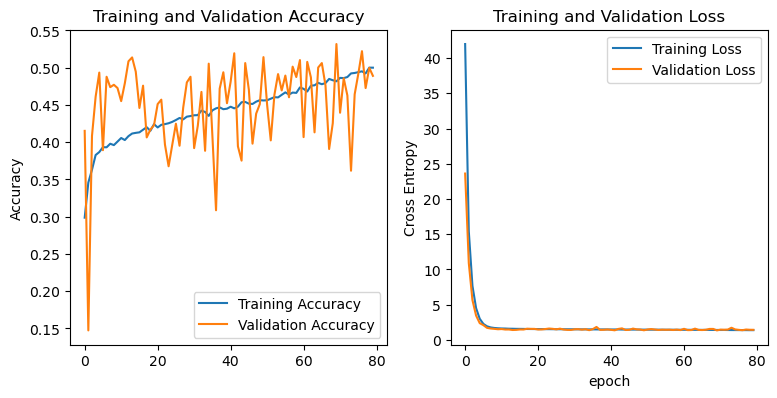

In [24]:
show_history_fit(history)

40/40 [==============================] - 11s 211ms/step - loss: 1.3450 - accuracy: 0.5252
tf.Tensor([2 0 2 ... 2 2 2], shape=(2498,), dtype=int64)
tf.Tensor([4 4 2 ... 2 2 4], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.2569    0.5074    0.3411       203
           1     0.3731    0.2618    0.3077       382
           2     0.6990    0.7181    0.7084      1323
           3     0.4010    0.2842    0.3326       278
           4     0.2930    0.2564    0.2735       312

    accuracy                         0.5252      2498
   macro avg     0.4046    0.4056    0.3927      2498
weighted avg     0.5294    0.5252    0.5211      2498



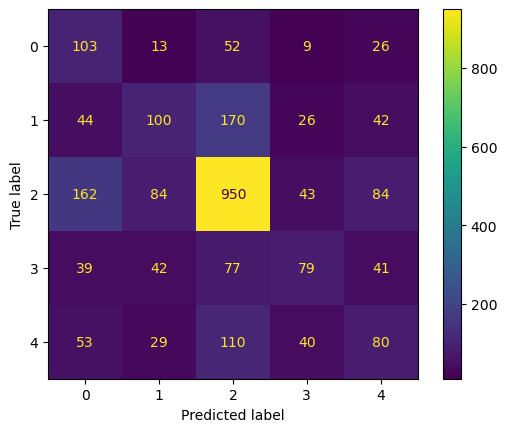

In [25]:
load_best_model_and_evaluate(path_model, test_ds)

Provare ad allenare la rete dell'esperimento 8 però con una patience manggiore per vedere se la rete riesce a migliorare o a trovare una mappatura maggiore

### Experiment 10

As the network in the experiment 9 but with less Conv Layers

In [11]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)

x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [12]:
compile_model(model, 'adam', 0.0001)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 250, 250, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 124, 124, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 122, 122, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 61, 61, 64)       0         
 2D)                                                         

In [13]:
path_model = general_path_models+'/majority_multiclass_models_sc/ex10_scratch_32_2x256_512_dp_regular_batchnorm_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, 35, 10) #250

Epoch 1/35
313/313 [==============================] - ETA: 0s - loss: 8.3951 - accuracy: 0.3442
Epoch 00001: val_loss improved from inf to 6.47199, saving model to ./majority_multiclass_models_sc\ex10_scratch_32_2x256_512_dp_regular_batchnorm_epoch_30_adam_1e-4.h5
313/313 [==============================] - 70s 195ms/step - loss: 8.3951 - accuracy: 0.3442 - val_loss: 6.4720 - val_accuracy: 0.1457
Epoch 2/35
313/313 [==============================] - ETA: 0s - loss: 5.0795 - accuracy: 0.3765
Epoch 00002: val_loss improved from 6.47199 to 4.15530, saving model to ./majority_multiclass_models_sc\ex10_scratch_32_2x256_512_dp_regular_batchnorm_epoch_30_adam_1e-4.h5
313/313 [==============================] - 78s 242ms/step - loss: 5.0795 - accuracy: 0.3765 - val_loss: 4.1553 - val_accuracy: 0.3365
Epoch 3/35
313/313 [==============================] - ETA: 0s - loss: 3.4426 - accuracy: 0.3911
Epoch 00003: val_loss improved from 4.15530 to 2.75703, saving model to ./majority_multiclass_models_s

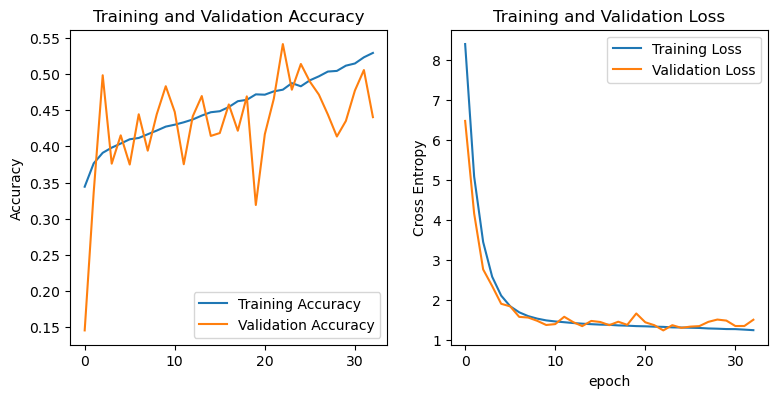

In [14]:
show_history_fit(history)

40/40 [==============================] - 10s 181ms/step - loss: 1.2253 - accuracy: 0.5344
tf.Tensor([2 2 3 ... 2 2 2], shape=(2498,), dtype=int64)
tf.Tensor([4 2 3 ... 3 2 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.2945    0.4483    0.3555       203
           1     0.4330    0.2539    0.3201       382
           2     0.7040    0.7226    0.7132      1323
           3     0.5111    0.2482    0.3341       278
           4     0.2585    0.3910    0.3112       312

    accuracy                         0.5344      2498
   macro avg     0.4402    0.4128    0.4068      2498
weighted avg     0.5522    0.5344    0.5316      2498



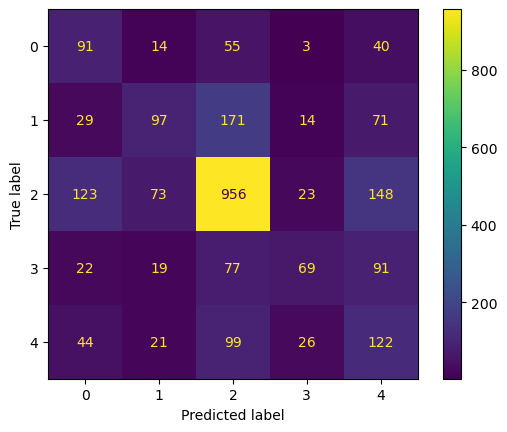

In [15]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 11

Extra experiment

In [16]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.l2(0.01))(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)
x = layers.Conv2D(512, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.l2(0.01))(x)

x = layers.Conv2D(1024, (3, 3), activation='relu')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [17]:
compile_model(model, 'adam', 0.0001)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_1 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_6 (Conv2D)           (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 124, 124, 32)     0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 122, 122, 64)      18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 61, 61, 64)       0         
 2D)                                                       

In [18]:
path_model = general_path_models+'/majority_multiclass_models_sc/ex11_scratch_32_2x256_1024_dpx2_regulariz_epoch_30_adam_1e-5.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 8.1502 - accuracy: 0.2235
Epoch 00001: val_loss improved from inf to 7.08735, saving model to ./majority_multiclass_models_sc\ex11_scratch_32_2x256_1024_dpx2_regulariz_epoch_30_adam_1e-5.h5
313/313 [==============================] - 57s 173ms/step - loss: 8.1502 - accuracy: 0.2235 - val_loss: 7.0874 - val_accuracy: 0.4140
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 6.3320 - accuracy: 0.2661
Epoch 00002: val_loss improved from 7.08735 to 5.58855, saving model to ./majority_multiclass_models_sc\ex11_scratch_32_2x256_1024_dpx2_regulariz_epoch_30_adam_1e-5.h5
313/313 [==============================] - 58s 181ms/step - loss: 6.3320 - accuracy: 0.2661 - val_loss: 5.5885 - val_accuracy: 0.4180
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 5.0703 - accuracy: 0.2834
Epoch 00003: val_loss improved from 5.58855 to 4.55834, saving model to ./majority_multiclass_models_sc\ex11_scr

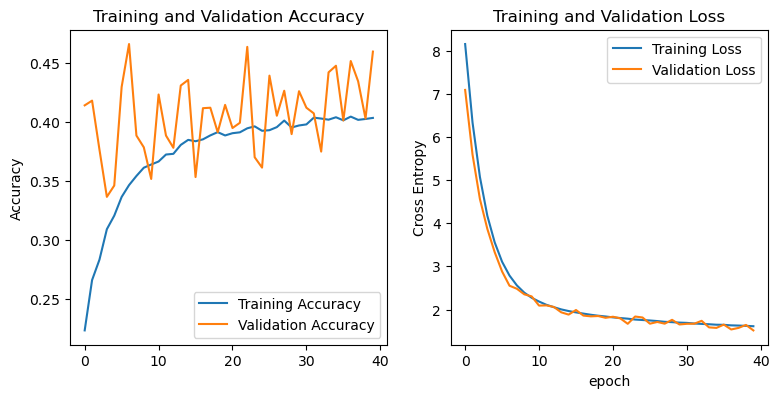

In [19]:
show_history_fit(history)

40/40 [==============================] - 10s 194ms/step - loss: 1.5302 - accuracy: 0.4616
tf.Tensor([2 2 3 ... 1 1 3], shape=(2498,), dtype=int64)
tf.Tensor([2 2 2 ... 2 4 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3099    0.3251    0.3173       203
           1     0.2231    0.2173    0.2202       382
           2     0.7015    0.6092    0.6521      1323
           3     0.2987    0.4856    0.3699       278
           4     0.2019    0.2019    0.2019       312

    accuracy                         0.4616      2498
   macro avg     0.3470    0.3678    0.3523      2498
weighted avg     0.4893    0.4616    0.4712      2498



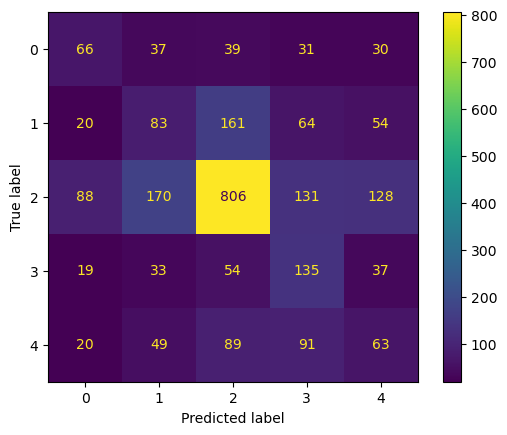

In [20]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 12 

Use the network of the experiment 4 with BatchNormalization and regularization and add a dense layer

In [21]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (5, 5), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (4, 4), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.L1L2(0.01))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)
x = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(1024, (3, 3), activation='relu')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [22]:
compile_model(model, 'adam', 0.0001)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_2 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_16 (Conv2D)          (None, 246, 246, 32)      2432      
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 123, 123, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_17 (Conv2D)          (None, 120, 120, 64)      32832     
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 60, 60, 64)       0         
 g2D)                                                      

In [23]:
path_model = general_path_models+'/majority_multiclass_models_sc/ex12_scratch_32_2x256_1024_dpx2_regulariz_batch_moreDense_epoch_30_adam_1e-5.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 28.7533 - accuracy: 0.3122
Epoch 00001: val_loss improved from inf to 5.92880, saving model to ./majority_multiclass_models_sc\ex12_scratch_32_2x256_1024_dpx2_regulariz_batch_moreDense_epoch_30_adam_1e-5.h5
313/313 [==============================] - 57s 177ms/step - loss: 28.7533 - accuracy: 0.3122 - val_loss: 5.9288 - val_accuracy: 0.3820
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 2.2004 - accuracy: 0.3507
Epoch 00002: val_loss improved from 5.92880 to 1.57074, saving model to ./majority_multiclass_models_sc\ex12_scratch_32_2x256_1024_dpx2_regulariz_batch_moreDense_epoch_30_adam_1e-5.h5
313/313 [==============================] - 56s 177ms/step - loss: 2.2004 - accuracy: 0.3507 - val_loss: 1.5707 - val_accuracy: 0.4124
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 1.5466 - accuracy: 0.3592
Epoch 00003: val_loss improved from 1.57074 to 1.40959, saving model to ./majo

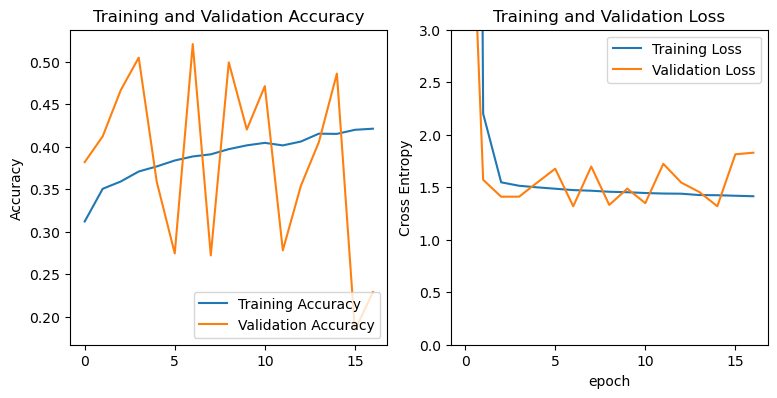

In [24]:
show_history_fit(history)

40/40 [==============================] - 6s 110ms/step - loss: 1.3236 - accuracy: 0.5244
tf.Tensor([2 2 2 ... 2 2 2], shape=(2498,), dtype=int64)
tf.Tensor([4 4 2 ... 2 2 4], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3149    0.2808    0.2969       203
           1     0.2287    0.1545    0.1844       382
           2     0.6098    0.8481    0.7095      1323
           3     0.3333    0.2122    0.2593       278
           4     0.3095    0.0417    0.0734       312

    accuracy                         0.5244      2498
   macro avg     0.3592    0.3074    0.3047      2498
weighted avg     0.4593    0.5244    0.4661      2498



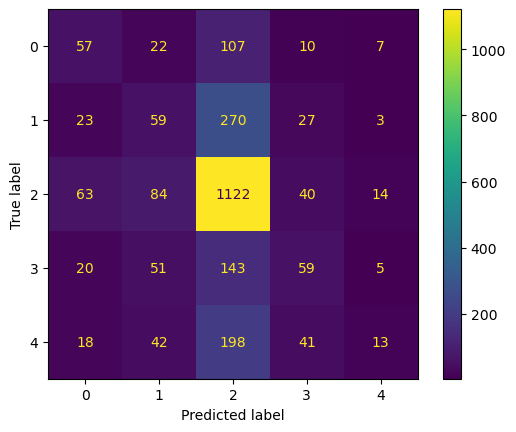

In [25]:
load_best_model_and_evaluate(path_model, test_ds)

## Other Examples: From Scratch 2 (Particular Architecture of Neural Networks)

### Experiment 1_bis: little network but different dimension of the filters

In [11]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Flatten()(x)
#x = layers.Dropout(0.3)(x)
#x = layers.Dense(512, activation='relu')(x)
#x = layers.Dropout(0.4)(x)
#x = layers.Dense(512, activation='relu')(x)
#x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [12]:
compile_model(model, 'adam', 0.0001)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 200, 200, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 200, 200, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 200, 200, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 200, 200, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 100, 100, 64)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 100, 100, 128)     73856     
                                                             

In [13]:
path_model = general_path_models+'/majority_multiclass_models_sc/ex1_bis_scratchv2_32_2x256_35_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10) #200x200

Epoch 1/40
438/438 [==============================] - ETA: 0s - loss: 1.8486 - accuracy: 0.2430
Epoch 00001: val_loss improved from inf to 1.85989, saving model to ./multiclass_models_sc\ex1_bis_scratchv2_32_2x256_35_adam_1e-4.h5
438/438 [==============================] - 160s 347ms/step - loss: 1.8486 - accuracy: 0.2430 - val_loss: 1.8599 - val_accuracy: 0.3009
Epoch 2/40
438/438 [==============================] - ETA: 0s - loss: 1.7467 - accuracy: 0.3070
Epoch 00002: val_loss improved from 1.85989 to 1.67910, saving model to ./multiclass_models_sc\ex1_bis_scratchv2_32_2x256_35_adam_1e-4.h5
438/438 [==============================] - 150s 340ms/step - loss: 1.7467 - accuracy: 0.3070 - val_loss: 1.6791 - val_accuracy: 0.3688
Epoch 3/40
438/438 [==============================] - ETA: 0s - loss: 1.6844 - accuracy: 0.3420
Epoch 00003: val_loss did not improve from 1.67910
438/438 [==============================] - 150s 340ms/step - loss: 1.6844 - accuracy: 0.3420 - val_loss: 1.7725 - val_a

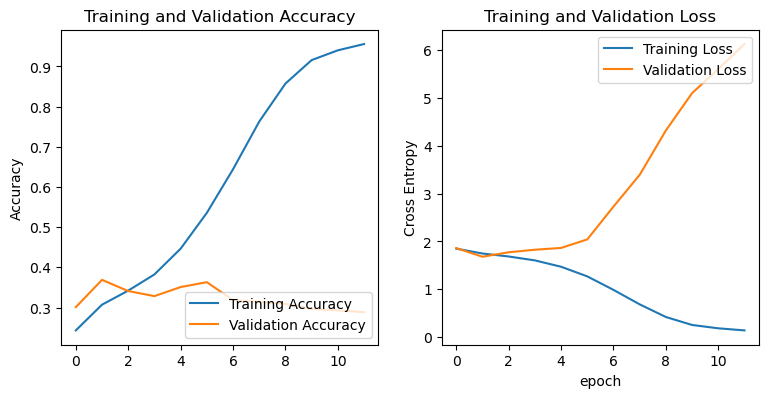

In [14]:
show_history_fit(history)

41/41 [==============================] - 6s 120ms/step - loss: 1.6961 - accuracy: 0.3654
tf.Tensor([2 5 2 ... 5 5 2], shape=(2622,), dtype=int64)
tf.Tensor([2 2 2 ... 5 1 1], shape=(2622,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.1639    0.4778    0.2440       203
           1     0.2629    0.1466    0.1882       382
           2     0.7150    0.4626    0.5617      1323
           3     0.0526    0.0980    0.0685        51
           4     0.0920    0.3151    0.1424        73
           5     0.2769    0.4353    0.3385       278
           6     0.2458    0.1410    0.1792       312

    accuracy                         0.3654      2622
   macro avg     0.2584    0.2966    0.2461      2622
weighted avg     0.4739    0.3654    0.3923      2622



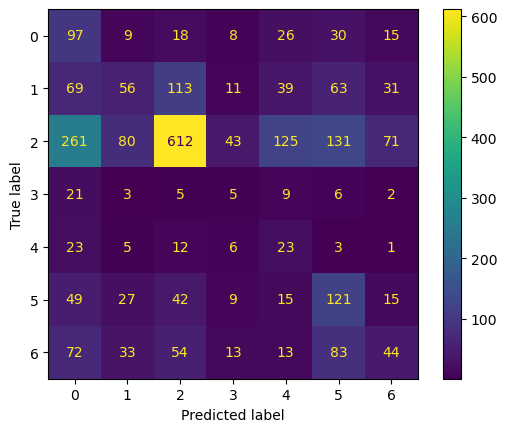

In [15]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 2_bis: A-CNN (network inspired to the AlexNet Network)

In [1]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(filters=96, kernel_size=(11,11), strides=(4,4), activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPool2D(pool_size=(3,3), strides=(2,2))(x)
x = layers.Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), activation='relu', padding="same")(x)
x = layers.MaxPool2D(pool_size=(3,3), strides=(2,2))(x)
x = layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same")(x)
x = layers.BatchNormalization()(x)
x = layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same")(x)

x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(1000, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)




NameError: name 'tf' is not defined

In [17]:
compile_model(model, 'adam', 0.0001)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 200, 200, 3)]     0         
                                                                 
 rescaling_1 (Rescaling)     (None, 200, 200, 3)       0         
                                                                 
 conv2d_6 (Conv2D)           (None, 48, 48, 96)        34944     
                                                                 
 batch_normalization (BatchN  (None, 48, 48, 96)       384       
 ormalization)                                                   
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 23, 23, 96)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 23, 23, 256)       6146

In [18]:
path_model = general_path_models+'/majority_multiclass_models_sc/ex2_bis_scratchv2_alex_4ly_35_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
438/438 [==============================] - ETA: 0s - loss: 1.8500 - accuracy: 0.2691
Epoch 00001: val_loss improved from inf to 1.93489, saving model to ./multiclass_models_sc\ex2_bis_scratchv2_alex_4ly_35_adam_1e-4.h5
438/438 [==============================] - 53s 116ms/step - loss: 1.8500 - accuracy: 0.2691 - val_loss: 1.9349 - val_accuracy: 0.2243
Epoch 2/40
438/438 [==============================] - ETA: 0s - loss: 1.7211 - accuracy: 0.3220
Epoch 00002: val_loss did not improve from 1.93489
438/438 [==============================] - 51s 114ms/step - loss: 1.7211 - accuracy: 0.3220 - val_loss: 1.9354 - val_accuracy: 0.2674
Epoch 3/40
438/438 [==============================] - ETA: 0s - loss: 1.6415 - accuracy: 0.3607
Epoch 00003: val_loss improved from 1.93489 to 1.84101, saving model to ./multiclass_models_sc\ex2_bis_scratchv2_alex_4ly_35_adam_1e-4.h5
438/438 [==============================] - 50s 113ms/step - loss: 1.6415 - accuracy: 0.3607 - val_loss: 1.8410 - val_accu

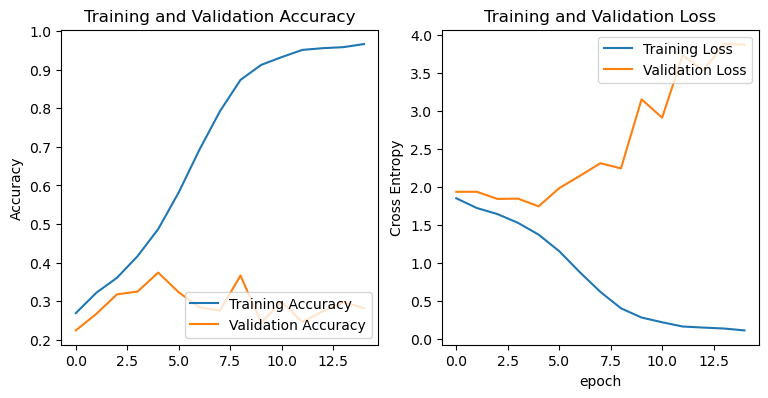

In [19]:
show_history_fit(history)

41/41 [==============================] - 5s 94ms/step - loss: 1.7393 - accuracy: 0.3684
tf.Tensor([6 1 1 ... 6 5 2], shape=(2622,), dtype=int64)
tf.Tensor([1 1 1 ... 2 5 5], shape=(2622,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.4286    0.0296    0.0553       203
           1     0.2017    0.3770    0.2628       382
           2     0.7468    0.4437    0.5567      1323
           3     0.0385    0.0196    0.0260        51
           4     0.1145    0.2603    0.1590        73
           5     0.2432    0.4532    0.3166       278
           6     0.2085    0.2660    0.2338       312

    accuracy                         0.3684      2622
   macro avg     0.2831    0.2642    0.2300      2622
weighted avg     0.4939    0.3684    0.3898      2622



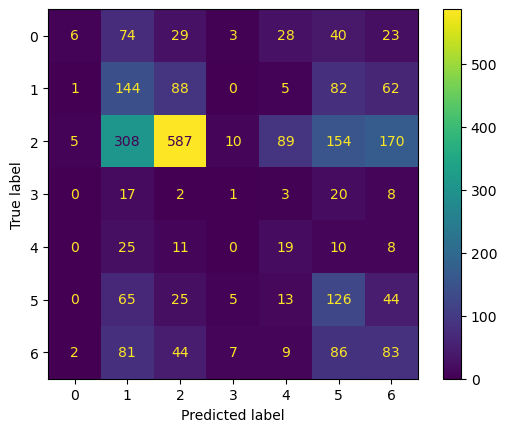

In [20]:
load_best_model_and_evaluate(path_model, test_ds)

In [26]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(filters=96, kernel_size=(11,11), strides=(4,4), activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPool2D(pool_size=(3,3), strides=(2,2))(x)
x = layers.Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), activation='relu', padding="same")(x)
x = layers.MaxPool2D(pool_size=(3,3), strides=(2,2))(x)
x = layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same")(x)
x = layers.BatchNormalization()(x)
x = layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same")(x)
#x = layers.MaxPooling2D((2, 2))(x)
#x = layers.BatchNormalization()(x)
x = layers.GlobalAveragePooling2D()(x)
#x = layers.Dropout(0.3)(x)
x = layers.Dense(1000, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [27]:
compile_model(model, 'adam', 0.0001)

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 rescaling_3 (Rescaling)     (None, 240, 240, 3)       0         
                                                                 
 conv2d_22 (Conv2D)          (None, 58, 58, 96)        34944     
                                                                 
 batch_normalization_8 (Batc  (None, 58, 58, 96)       384       
 hNormalization)                                                 
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 28, 28, 96)       0         
 g2D)                                                            
                                                                 
 conv2d_23 (Conv2D)          (None, 28, 28, 256)       6146

In [28]:
path_model = general_path_models+'/majority_multiclass_models_sc/ex2_bis_dropout_scratchv2_alex_4ly_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 1.5271 - accuracy: 0.3240
Epoch 00001: val_loss improved from inf to 1.51430, saving model to ./majority_multiclass_models_sc\ex2_bis_dropout_scratchv2_alex_4ly_40_adam_1e-4.h5
313/313 [==============================] - 69s 214ms/step - loss: 1.5271 - accuracy: 0.3240 - val_loss: 1.5143 - val_accuracy: 0.3166
Epoch 2/40
312/313 [============================>.] - ETA: 0s - loss: 1.4708 - accuracy: 0.3596
Epoch 00002: val_loss improved from 1.51430 to 1.42871, saving model to ./majority_multiclass_models_sc\ex2_bis_dropout_scratchv2_alex_4ly_40_adam_1e-4.h5
313/313 [==============================] - 81s 251ms/step - loss: 1.4706 - accuracy: 0.3596 - val_loss: 1.4287 - val_accuracy: 0.3828
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 1.4438 - accuracy: 0.3787
Epoch 00003: val_loss did not improve from 1.42871
313/313 [==============================] - 79s 246ms/step - loss: 1.4438 - accuracy: 0.

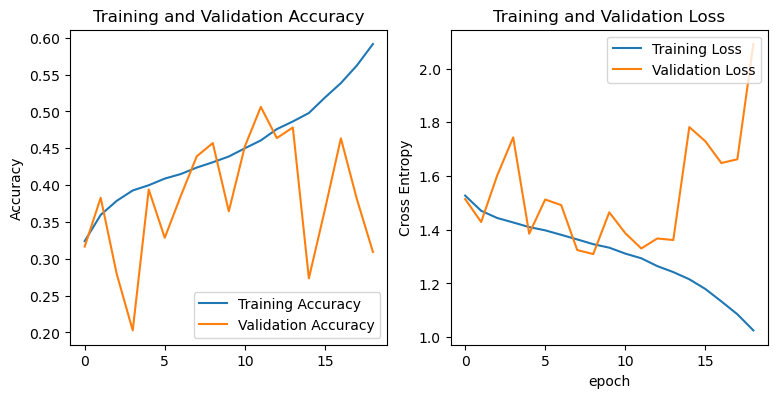

In [29]:
show_history_fit(history)

40/40 [==============================] - 10s 197ms/step - loss: 1.3242 - accuracy: 0.4400
tf.Tensor([2 2 2 ... 2 0 2], shape=(2498,), dtype=int64)
tf.Tensor([2 2 4 ... 1 1 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.1833    0.7044    0.2909       203
           1     0.3465    0.1832    0.2397       382
           2     0.6865    0.5745    0.6255      1323
           3     0.3116    0.3273    0.3193       278
           4     0.2991    0.1122    0.1632       312

    accuracy                         0.4400      2498
   macro avg     0.3654    0.3803    0.3277      2498
weighted avg     0.5035    0.4400    0.4475      2498



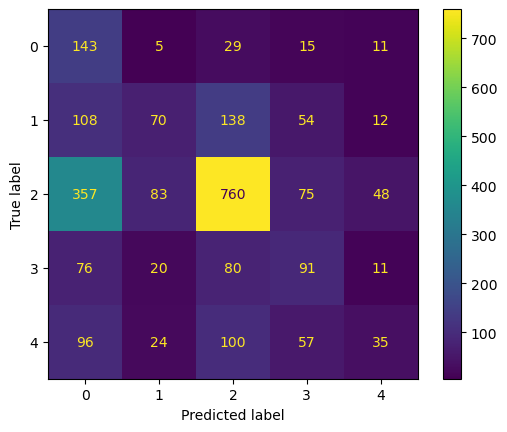

In [30]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 3_bis: Network that merge the output coming from different levels of the network 

In [11]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
l1 = layers.Rescaling(1./255)(input)
l1 = layers.Conv2D(filters=128, kernel_size=(11,11), activation='relu')(l1) #, strides=(4,4)
l1 = layers.Conv2D(filters=128, kernel_size=(1,1), activation='relu')(l1)
l1 = layers.MaxPool2D(pool_size=(3,3))(l1)

l1_out = layers.Conv2D(filters=128, kernel_size=(1,1), activation='relu')(l1)
l1_out = layers.GlobalAveragePooling2D()(l1_out)
l1_out = layers.Dense(512, activation='relu')(l1_out)
l1_out = layers.Dense(256, activation='relu')(l1_out)

l2 = layers.Conv2D(filters=256, kernel_size=(5,5), activation='relu')(l1)
l2 = layers.Conv2D(filters=256, kernel_size=(1,1), activation='relu')(l2)
l2 = layers.MaxPool2D(pool_size=(3,3))(l2)

l2_out = layers.Conv2D(filters=128, kernel_size=(1,1), activation='relu')(l2)
l2_out = layers.GlobalAveragePooling2D()(l2_out)
l2_out = layers.Dense(512, activation='relu')(l2_out)
l2_out = layers.Dense(256, activation='relu')(l2_out)

l3 = layers.Conv2D(filters=384, kernel_size=(5,5), activation='relu')(l2)
l3 = layers.Conv2D(filters=384, kernel_size=(1,1), activation='relu')(l3)
l3 = layers.MaxPool2D(pool_size=(3,3))(l3)

l3_out = layers.Conv2D(filters=128, kernel_size=(1,1), activation='relu')(l3)
l3_out = layers.GlobalAveragePooling2D()(l3_out)
l3_out = layers.Dense(512, activation='relu')(l3_out)
l3_out = layers.Dense(256, activation='relu')(l3_out)

l4 = layers.Conv2D(filters=512, kernel_size=(5,5), activation='relu')(l3)
l4 = layers.Conv2D(filters=512, kernel_size=(1,1), activation='relu')(l4)
l4 = layers.MaxPool2D(pool_size=(3,3))(l4)

l4_out = layers.Conv2D(filters=128, kernel_size=(1,1), activation='relu')(l4)
l4_out = layers.GlobalAveragePooling2D()(l4_out)
l4_out = layers.Dense(512, activation='relu')(l4_out)
l4_out = layers.Dense(256, activation='relu')(l4_out)
#print(l1_out.shape, l2_out.shape, l3_out.shape, l4_out.shape)

merge = layers.Average()([l1_out, l2_out, l3_out, l4_out])

output = layers.Dense(NUM_CLASSES, activation='softmax')(merge)

model = tf.keras.Model(inputs=input, outputs = output)

In [12]:
#tf.keras.utils.plot_model(model)

In [13]:
compile_model(model, 'adam', 0.0001)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 250, 250, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 240, 240, 12  46592       ['rescaling[0][0]']              
                                8)                                                                
                                                                                              

In [15]:
path_model = general_path_models+'/extra_majority_multiclass_models_sc/7_dropout_scratchv2_alex_middleinfo_35_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,35,10) #300x300  batch 12

Epoch 1/35
1556/1556 [==============================] - ETA: 0s - loss: 1.9206 - accuracy: 0.1809
Epoch 00001: val_loss improved from inf to 1.88904, saving model to ./extra_multiclass_models_sc\7_dropout_scratchv2_alex_middleinfo_35_adam_1e-4.h5
1556/1556 [==============================] - 231s 148ms/step - loss: 1.9206 - accuracy: 0.1809 - val_loss: 1.8890 - val_accuracy: 0.2822


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


Epoch 2/35
1556/1556 [==============================] - ETA: 0s - loss: 1.8120 - accuracy: 0.2674
Epoch 00002: val_loss improved from 1.88904 to 1.81851, saving model to ./extra_multiclass_models_sc\7_dropout_scratchv2_alex_middleinfo_35_adam_1e-4.h5
1556/1556 [==============================] - 225s 145ms/step - loss: 1.8120 - accuracy: 0.2674 - val_loss: 1.8185 - val_accuracy: 0.2941
Epoch 3/35
1556/1556 [==============================] - ETA: 0s - loss: 1.7737 - accuracy: 0.2881
Epoch 00003: val_loss improved from 1.81851 to 1.78338, saving model to ./extra_multiclass_models_sc\7_dropout_scratchv2_alex_middleinfo_35_adam_1e-4.h5
1556/1556 [==============================] - 226s 145ms/step - loss: 1.7737 - accuracy: 0.2881 - val_loss: 1.7834 - val_accuracy: 0.3131
Epoch 4/35
1556/1556 [==============================] - ETA: 0s - loss: 1.7481 - accuracy: 0.3037
Epoch 00004: val_loss improved from 1.78338 to 1.75903, saving model to ./extra_multiclass_models_sc\7_dropout_scratchv2_alex_

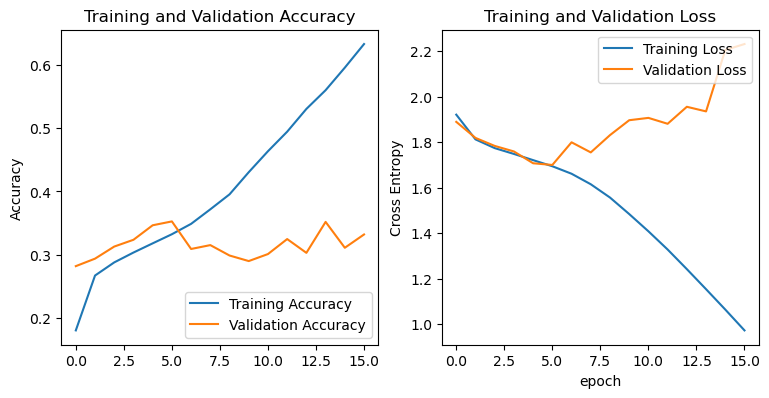

In [16]:
show_history_fit(history)

146/146 [==============================] - 8s 54ms/step - loss: 1.7146 - accuracy: 0.3455
tf.Tensor([5 5 4 ... 5 5 5], shape=(2622,), dtype=int64)
tf.Tensor([2 5 2 ... 5 1 1], shape=(2622,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.2326    0.2463    0.2392       203
           1     0.2462    0.1283    0.1687       382
           2     0.7560    0.4051    0.5276      1323
           3     0.0476    0.1569    0.0731        51
           4     0.0893    0.4110    0.1467        73
           5     0.2346    0.6007    0.3374       278
           6     0.2332    0.2115    0.2218       312

    accuracy                         0.3455      2622
   macro avg     0.2628    0.3085    0.2449      2622
weighted avg     0.4914    0.3455    0.3770      2622



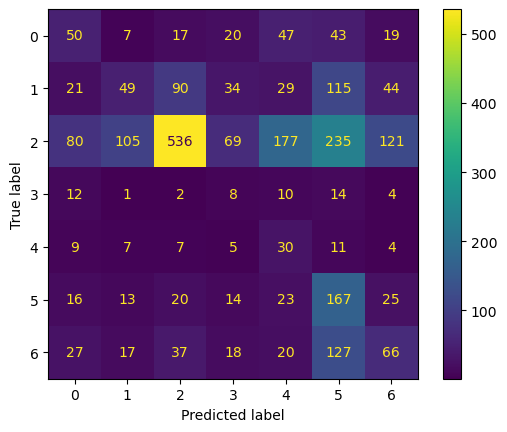

In [17]:
load_best_model_and_evaluate(path_model, test_ds)

## Pre-Trained Networks

### VGG16

#### Experiment Features Extraction 1

In [36]:
base_model = tf.keras.applications.vgg16.VGG16(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

In [37]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.vgg16.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu')(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [38]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 250, 250, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 250, 250, 3)      0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d_3   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_8 (Dense)             (None, 512)               2626

In [39]:
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_vgg16_no_tuning_experiment_1_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 1.9633 - accuracy: 0.3857
Epoch 00001: val_loss improved from inf to 1.53513, saving model to ./majority_multiclass_models_sc\pretrained_vgg16_no_tuning_experiment_1_epoch_40_adam_1e-4.h5
313/313 [==============================] - 91s 272ms/step - loss: 1.9633 - accuracy: 0.3857 - val_loss: 1.5351 - val_accuracy: 0.4802
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 1.4193 - accuracy: 0.4733
Epoch 00002: val_loss improved from 1.53513 to 1.43316, saving model to ./majority_multiclass_models_sc\pretrained_vgg16_no_tuning_experiment_1_epoch_40_adam_1e-4.h5
313/313 [==============================] - 77s 243ms/step - loss: 1.4193 - accuracy: 0.4733 - val_loss: 1.4332 - val_accuracy: 0.4890
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 1.2499 - accuracy: 0.5197
Epoch 00003: val_loss improved from 1.43316 to 1.35923, saving model to ./majority_multiclass_models_sc\pretrained_v

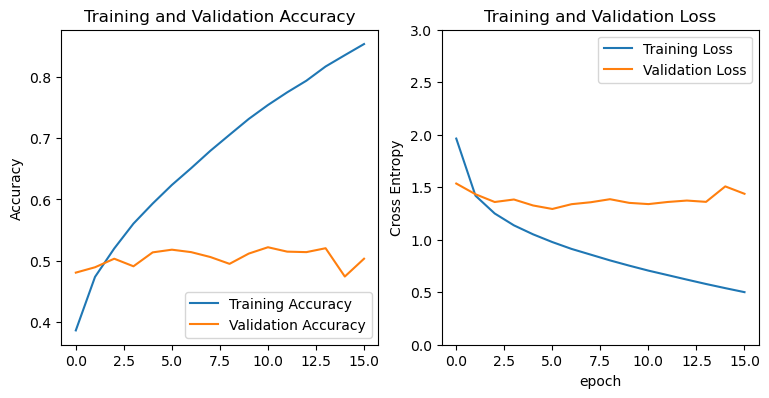

In [40]:
show_history_fit(history)

40/40 [==============================] - 10s 219ms/step - loss: 1.2696 - accuracy: 0.5344
tf.Tensor([1 1 2 ... 0 0 2], shape=(2498,), dtype=int64)
tf.Tensor([4 2 3 ... 3 2 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3067    0.4926    0.3781       203
           1     0.4000    0.3717    0.3853       382
           2     0.7798    0.6531    0.7108      1323
           3     0.3483    0.3633    0.3556       278
           4     0.3055    0.4103    0.3502       312

    accuracy                         0.5344      2498
   macro avg     0.4281    0.4582    0.4360      2498
weighted avg     0.5760    0.5344    0.5494      2498



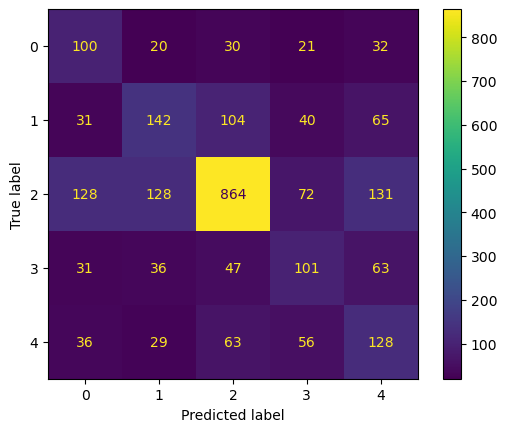

In [41]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Features Extraction 2

In [42]:
base_model = tf.keras.applications.vgg16.VGG16(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

In [43]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.vgg16.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [44]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d_4   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [45]:
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_vgg16_no_tuning_experiment_2_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 2.8396 - accuracy: 0.3348
Epoch 00001: val_loss improved from inf to 1.50475, saving model to ./majority_multiclass_models_sc\pretrained_vgg16_no_tuning_experiment_2_epoch_40_adam_1e-4.h5
313/313 [==============================] - 77s 242ms/step - loss: 2.8396 - accuracy: 0.3348 - val_loss: 1.5048 - val_accuracy: 0.4579
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 1.6669 - accuracy: 0.4120
Epoch 00002: val_loss improved from 1.50475 to 1.33003, saving model to ./majority_multiclass_models_sc\pretrained_vgg16_no_tuning_experiment_2_epoch_40_adam_1e-4.h5
313/313 [==============================] - 77s 242ms/step - loss: 1.6669 - accuracy: 0.4120 - val_loss: 1.3300 - val_accuracy: 0.4902
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 1.4074 - accuracy: 0.4500
Epoch 00003: val_loss improved from 1.33003 to 1.26691, saving model to ./majority_multiclass_models_sc\pretrained_v

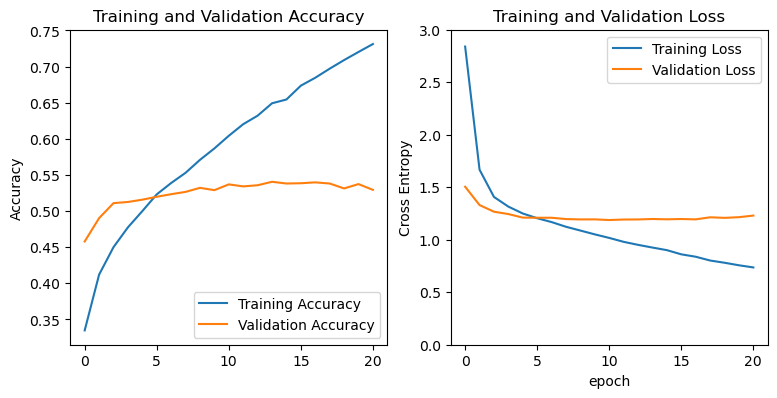

In [46]:
show_history_fit(history)

40/40 [==============================] - 10s 204ms/step - loss: 1.1745 - accuracy: 0.5416
tf.Tensor([2 2 3 ... 3 4 4], shape=(2498,), dtype=int64)
tf.Tensor([2 2 2 ... 2 4 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3505    0.5369    0.4241       203
           1     0.3609    0.4686    0.4077       382
           2     0.8258    0.6092    0.7012      1323
           3     0.3802    0.4568    0.4150       278
           4     0.3465    0.4231    0.3810       312

    accuracy                         0.5416      2498
   macro avg     0.4528    0.4989    0.4658      2498
weighted avg     0.6066    0.5416    0.5619      2498



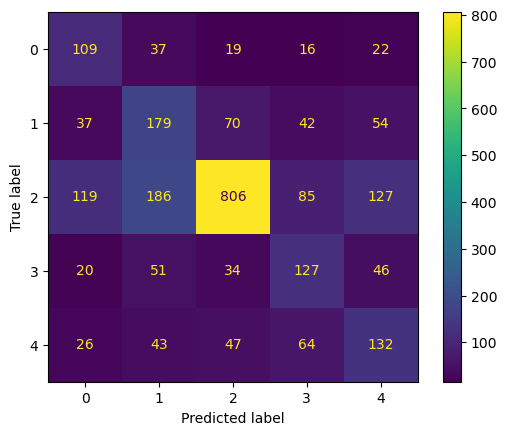

In [47]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Features Extraction 3 (Double layer with dropout and regualrization)

In [61]:
base_model = tf.keras.applications.vgg16.VGG16(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 250, 250, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 250, 250, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 125, 125, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 125, 125, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 125, 125, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 62, 62, 128)       0     

In [62]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.vgg16.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.L2(0.001))(x)
x = layers.Dropout(0.4)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [63]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d_2   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [64]:
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_vgg16_no_tuning_regularization_1024_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 2.8869 - accuracy: 0.3393
Epoch 00001: val_loss improved from inf to 2.01327, saving model to ./majority_multiclass_models_sc\pretrained_vgg16_no_tuning_regularization_1024_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 82s 257ms/step - loss: 2.8869 - accuracy: 0.3393 - val_loss: 2.0133 - val_accuracy: 0.4503
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 2.1406 - accuracy: 0.4054
Epoch 00002: val_loss improved from 2.01327 to 1.95410, saving model to ./majority_multiclass_models_sc\pretrained_vgg16_no_tuning_regularization_1024_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 83s 258ms/step - loss: 2.1406 - accuracy: 0.4054 - val_loss: 1.9541 - val_accuracy: 0.4850
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 2.0145 - accuracy: 0.4430
Epoch 00003: val_loss improved from 1.95410 to 1.90409, saving model to ./majority_multiclass_mo

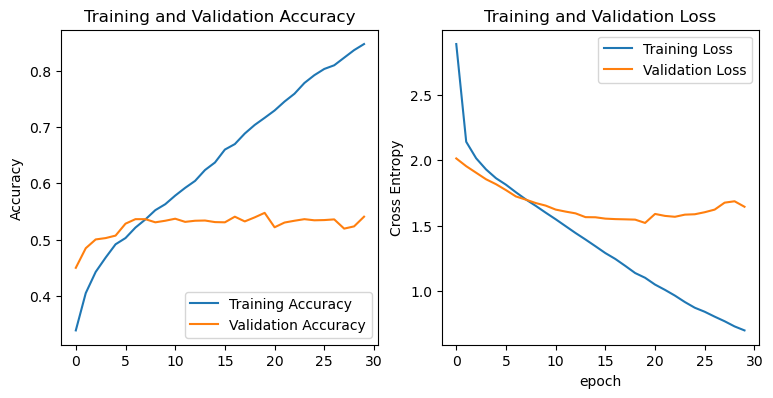

In [65]:
show_history_fit(history)

40/40 [==============================] - 10s 210ms/step - loss: 1.5118 - accuracy: 0.5556
tf.Tensor([2 3 2 ... 2 1 2], shape=(2498,), dtype=int64)
tf.Tensor([2 4 1 ... 2 1 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3333    0.5320    0.4099       203
           1     0.4205    0.4293    0.4249       382
           2     0.8172    0.6387    0.7170      1323
           3     0.4074    0.4353    0.4209       278
           4     0.3311    0.4808    0.3922       312

    accuracy                         0.5556      2498
   macro avg     0.4619    0.5032    0.4730      2498
weighted avg     0.6109    0.5556    0.5738      2498



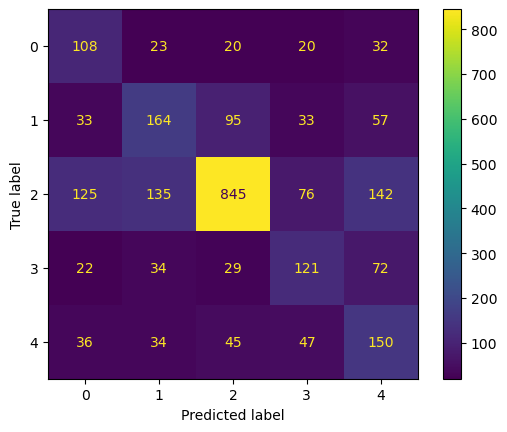

In [66]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Fetures Extraction 4 - Uso altri layer

In [23]:
base_model = tf.keras.applications.vgg16.VGG16(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 250, 250, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 250, 250, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 125, 125, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 125, 125, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 125, 125, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 62, 62, 128)       0     

In [24]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.vgg16.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dense(256, activation='relu')(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [25]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_2   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_2 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d_2   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [26]:
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_vgg16_no_tuning_experiment_4_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 1.6170 - accuracy: 0.3484
Epoch 00001: val_loss improved from inf to 1.24460, saving model to ./majority_multiclass_models_sc\pretrained_vgg16_no_tuning_experiment_4_epoch_40_adam_1e-4.h5
313/313 [==============================] - 80s 249ms/step - loss: 1.6170 - accuracy: 0.3484 - val_loss: 1.2446 - val_accuracy: 0.5146
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 1.3862 - accuracy: 0.4279
Epoch 00002: val_loss improved from 1.24460 to 1.21328, saving model to ./majority_multiclass_models_sc\pretrained_vgg16_no_tuning_experiment_4_epoch_40_adam_1e-4.h5
313/313 [==============================] - 78s 247ms/step - loss: 1.3862 - accuracy: 0.4279 - val_loss: 1.2133 - val_accuracy: 0.5182
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 1.3216 - accuracy: 0.4590
Epoch 00003: val_loss improved from 1.21328 to 1.16531, saving model to ./majority_multiclass_models_sc\pretrained_v

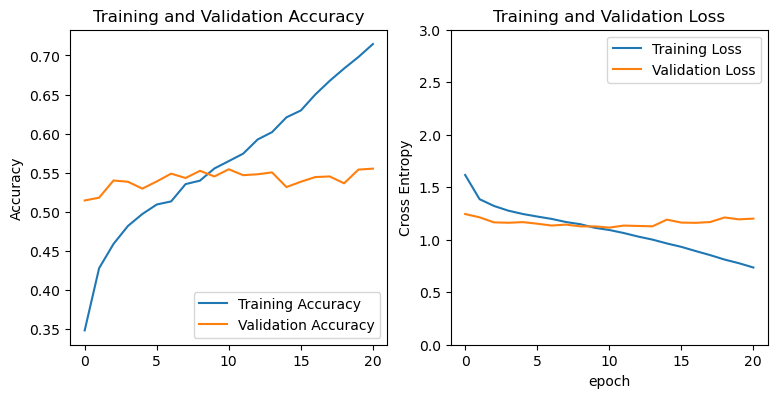

In [27]:
show_history_fit(history)

40/40 [==============================] - 10s 204ms/step - loss: 1.1161 - accuracy: 0.5737
tf.Tensor([4 3 2 ... 2 0 4], shape=(2498,), dtype=int64)
tf.Tensor([4 4 2 ... 2 2 4], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3429    0.5862    0.4327       203
           1     0.4467    0.4607    0.4536       382
           2     0.8340    0.6455    0.7277      1323
           3     0.4608    0.4856    0.4729       278
           4     0.3386    0.4776    0.3963       312

    accuracy                         0.5737      2498
   macro avg     0.4846    0.5311    0.4966      2498
weighted avg     0.6314    0.5737    0.5921      2498



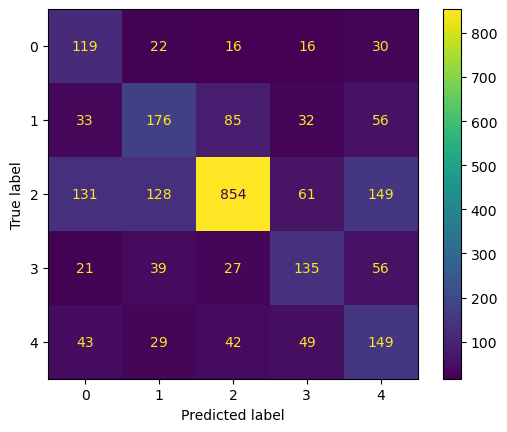

In [28]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Fine Tuning Best Model VGG16 - Block 1 

In [49]:
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_vgg16_no_tuning_experiment_4_epoch_40_adam_1e-4.h5'

In [54]:
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_2   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_2 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d_2   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [55]:
model_finetune.trainable = True

base_model_vgg16 = model_finetune.get_layer("vgg16") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_vgg16.layers))
base_model_vgg16.summary()

Number of layers in the base model:  19
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 250, 250, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 250, 250, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 125, 125, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 125, 125, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 125, 125, 128)     147584    
                                                                 
 block2_pool (MaxPool

In [57]:
set_trainable = False
for layer in base_model_vgg16.layers:
    if layer.name == 'block5_conv1': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable: # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
        layer.trainable = True
    else:
        layer.trainable = False



model_finetune.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_2   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_2 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d_2   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [53]:
compile_model(model_finetune, 'adam', LR)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_2   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_2 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d_2   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [58]:
path_model_tuned = general_path_models+'/majority_multiclass_models_sc/pretrained_vgg16_FINE_tuning_exp1_block5_conv1_512_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 1.0635 - accuracy: 0.5723
Epoch 00001: val_loss improved from inf to 1.11088, saving model to ./majority_multiclass_models_sc\pretrained_vgg16_FINE_tuning_exp1_block5_conv1_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 81s 254ms/step - loss: 1.0635 - accuracy: 0.5723 - val_loss: 1.1109 - val_accuracy: 0.5609
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 1.0298 - accuracy: 0.5951
Epoch 00002: val_loss did not improve from 1.11088
313/313 [==============================] - 80s 249ms/step - loss: 1.0298 - accuracy: 0.5951 - val_loss: 1.1274 - val_accuracy: 0.5537
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 1.0024 - accuracy: 0.6037
Epoch 00003: val_loss did not improve from 1.11088
313/313 [==============================] - 82s 254ms/step - loss: 1.0024 - accuracy: 0.6037 - val_loss: 1.1509 - val_accuracy: 0.5385
Epoch 4/40
313/313 [============

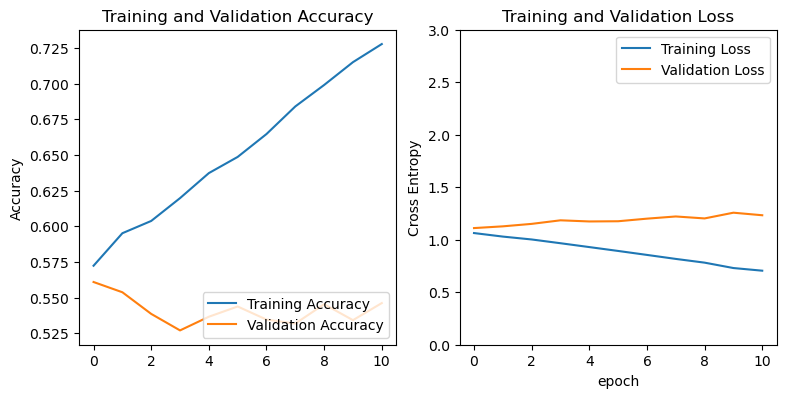

In [59]:
show_history_fit(history_tune)

40/40 [==============================] - 11s 213ms/step - loss: 1.1101 - accuracy: 0.5677
tf.Tensor([4 2 4 ... 3 0 4], shape=(2498,), dtype=int64)
tf.Tensor([2 2 4 ... 3 2 3], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3514    0.5419    0.4264       203
           1     0.4462    0.4450    0.4456       382
           2     0.8314    0.6372    0.7214      1323
           3     0.4615    0.4748    0.4681       278
           4     0.3214    0.5192    0.3971       312

    accuracy                         0.5673      2498
   macro avg     0.4824    0.5236    0.4917      2498
weighted avg     0.6286    0.5673    0.5866      2498



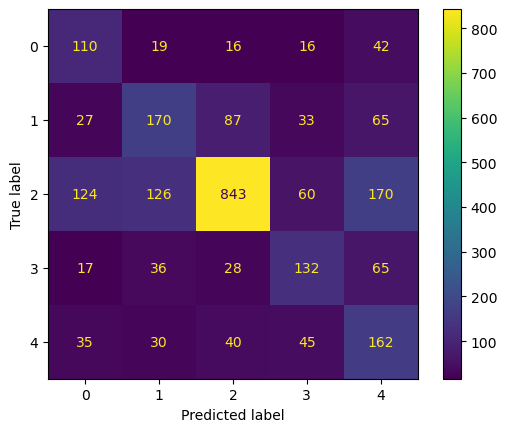

In [60]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment Fine Tuning Best Model VGG16 - Block 2

In [37]:
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_2   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_2 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d_2   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [38]:
model_finetune.trainable = True

base_model_vgg16 = model_finetune.get_layer("vgg16") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_vgg16.layers))
base_model_vgg16.summary()

Number of layers in the base model:  19
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 250, 250, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 250, 250, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 125, 125, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 125, 125, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 125, 125, 128)     147584    
                                                                 
 block2_pool (MaxPool

In [39]:
set_trainable = False
for layer in base_model_vgg16.layers:
    if layer.name == 'block4_conv1': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable: # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
        layer.trainable = True
    else:
        layer.trainable = False



model_finetune.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_2   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_2 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d_2   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [40]:
path_model_tuned = general_path_models+'/majority_multiclass_models_sc/pretrained_vgg16_FINE_tuning_block4REALE_conv1_512_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 1.0631 - accuracy: 0.5809
Epoch 00001: val_loss improved from inf to 1.12138, saving model to ./majority_multiclass_models_sc\pretrained_vgg16_FINE_tuning_block4REALE_conv1_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 78s 245ms/step - loss: 1.0631 - accuracy: 0.5809 - val_loss: 1.1214 - val_accuracy: 0.5541
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 1.0364 - accuracy: 0.5888
Epoch 00002: val_loss improved from 1.12138 to 1.10824, saving model to ./majority_multiclass_models_sc\pretrained_vgg16_FINE_tuning_block4REALE_conv1_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 78s 246ms/step - loss: 1.0364 - accuracy: 0.5888 - val_loss: 1.1082 - val_accuracy: 0.5525
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 1.0029 - accuracy: 0.5996
Epoch 00003: val_loss did not improve from 1.10824
313/313 [============================

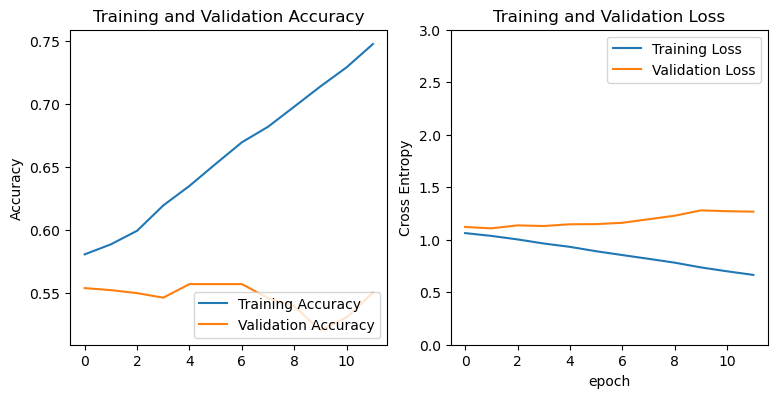

In [41]:
show_history_fit(history_tune)

40/40 [==============================] - 10s 210ms/step - loss: 1.1080 - accuracy: 0.5741
tf.Tensor([0 2 3 ... 4 1 2], shape=(2498,), dtype=int64)
tf.Tensor([2 2 2 ... 4 1 3], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3495    0.5665    0.4323       203
           1     0.4491    0.4738    0.4611       382
           2     0.8317    0.6387    0.7225      1323
           3     0.4618    0.4784    0.4700       278
           4     0.3463    0.5128    0.4134       312

    accuracy                         0.5741      2498
   macro avg     0.4877    0.5341    0.4999      2498
weighted avg     0.6322    0.5741    0.5923      2498



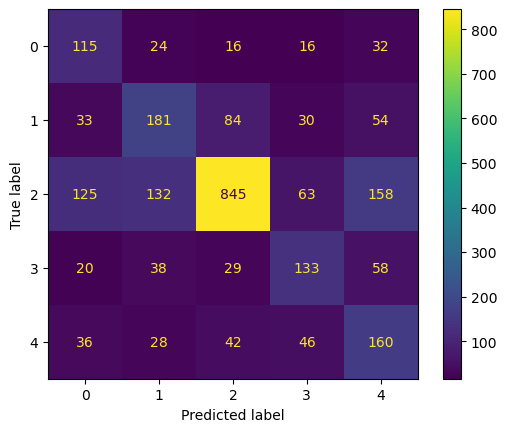

In [42]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment Fine Tunining Best Model VGG16 - Block 3

In [43]:
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_2   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_2 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d_2   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [44]:
model_finetune.trainable = True

base_model_vgg16 = model_finetune.get_layer("vgg16") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_vgg16.layers))
base_model_vgg16.summary()

Number of layers in the base model:  19
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 250, 250, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 250, 250, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 125, 125, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 125, 125, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 125, 125, 128)     147584    
                                                                 
 block2_pool (MaxPool

In [45]:
set_trainable = False
for layer in base_model_vgg16.layers:
    if layer.name == 'block3_conv1': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable: # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
        layer.trainable = True
    else:
        layer.trainable = False



model_finetune.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_2   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_2 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d_2   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [46]:
path_model_tuned = general_path_models+'/majority_multiclass_models_sc/pretrained_vgg16_FINE_tuning_block3REALE_conv1_512_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 1.0598 - accuracy: 0.5760
Epoch 00001: val_loss improved from inf to 1.11333, saving model to ./majority_multiclass_models_sc\pretrained_vgg16_FINE_tuning_block3REALE_conv1_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 79s 247ms/step - loss: 1.0598 - accuracy: 0.5760 - val_loss: 1.1133 - val_accuracy: 0.5645
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 1.0345 - accuracy: 0.5936
Epoch 00002: val_loss did not improve from 1.11333
313/313 [==============================] - 78s 245ms/step - loss: 1.0345 - accuracy: 0.5936 - val_loss: 1.1276 - val_accuracy: 0.5473
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 1.0009 - accuracy: 0.6047
Epoch 00003: val_loss did not improve from 1.11333
313/313 [==============================] - 78s 245ms/step - loss: 1.0009 - accuracy: 0.6047 - val_loss: 1.1318 - val_accuracy: 0.5597
Epoch 4/40
313/313 [============

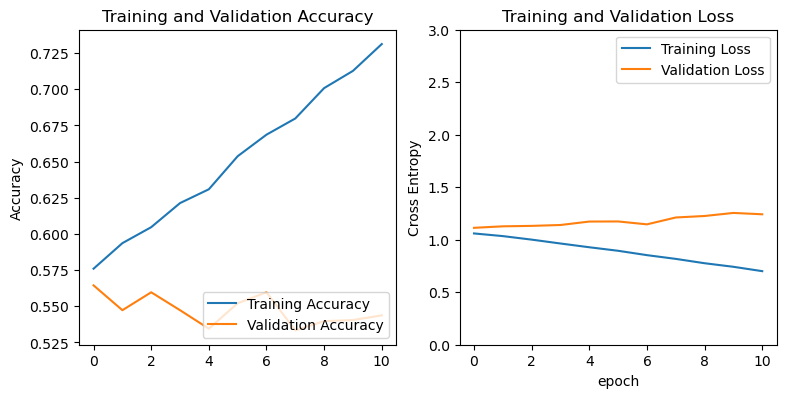

In [47]:
show_history_fit(history_tune)

40/40 [==============================] - 10s 207ms/step - loss: 1.1215 - accuracy: 0.5669
tf.Tensor([4 4 4 ... 2 3 4], shape=(2498,), dtype=int64)
tf.Tensor([3 4 4 ... 2 2 4], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3513    0.5468    0.4277       203
           1     0.4560    0.4346    0.4450       382
           2     0.8328    0.6327    0.7191      1323
           3     0.4345    0.4892    0.4602       278
           4     0.3320    0.5321    0.4089       312

    accuracy                         0.5669      2498
   macro avg     0.4813    0.5271    0.4922      2498
weighted avg     0.6292    0.5669    0.5859      2498



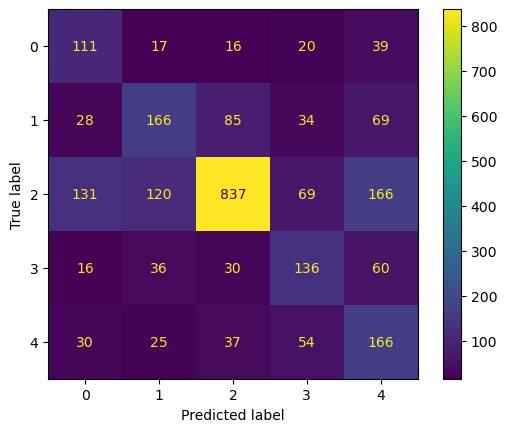

In [48]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment Remove some layers from VGG16 - Remove Block 1

In [61]:
base_model = tf.keras.applications.vgg16.VGG16(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 250, 250, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 250, 250, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 125, 125, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 125, 125, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 125, 125, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 62, 62, 128)       0     

In [62]:
base_model_cutted = tf.keras.Sequential()
for layer in base_model.layers:
    if layer.name == "block5_conv1":
        break
    base_model_cutted.add(layer)

base_model_cutted.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 250, 250, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 250, 250, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 125, 125, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 125, 125, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 125, 125, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 62, 62, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 62, 62, 256)       2

In [63]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.vgg16.preprocess_input(inputs)
x = base_model_cutted(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dense(256, activation='relu')(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [64]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_3   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_3 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 sequential (Sequential)     (None, 15, 15, 512)       7635264   
                                                                 
 global_average_pooling2d_3   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [65]:
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_REMOVE_LAYER_1_vgg16_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 6.1555 - accuracy: 0.2831
Epoch 00001: val_loss improved from inf to 1.48388, saving model to ./majority_multiclass_models_sc\pretrained_REMOVE_LAYER_1_vgg16_no_tuning_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 77s 243ms/step - loss: 6.1555 - accuracy: 0.2831 - val_loss: 1.4839 - val_accuracy: 0.4076
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 2.1649 - accuracy: 0.3142
Epoch 00002: val_loss improved from 1.48388 to 1.36909, saving model to ./majority_multiclass_models_sc\pretrained_REMOVE_LAYER_1_vgg16_no_tuning_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 76s 239ms/step - loss: 2.1649 - accuracy: 0.3142 - val_loss: 1.3691 - val_accuracy: 0.4347
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 1.7361 - accuracy: 0.3352
Epoch 00003: val_loss improved from 1.36909 to 1.32987, saving model to ./majority_multiclass_mode

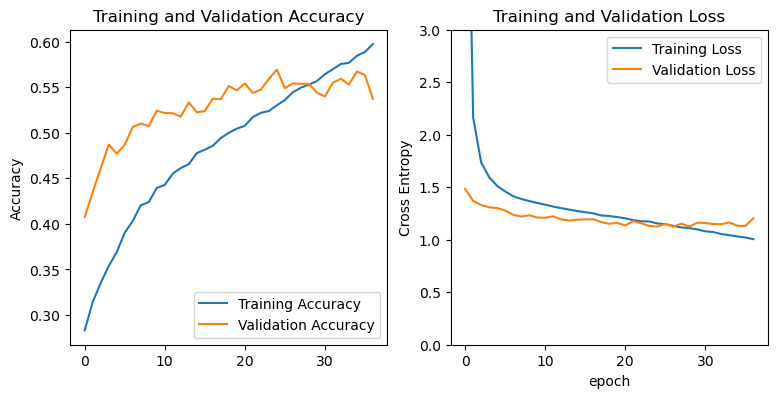

In [66]:
show_history_fit(history)

40/40 [==============================] - 12s 230ms/step - loss: 1.1279 - accuracy: 0.5552
tf.Tensor([1 3 2 ... 2 1 3], shape=(2498,), dtype=int64)
tf.Tensor([2 4 1 ... 2 1 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3121    0.5320    0.3934       203
           1     0.4908    0.3482    0.4074       382
           2     0.8024    0.6629    0.7260      1323
           3     0.3892    0.5683    0.4620       278
           4     0.2906    0.3558    0.3199       312

    accuracy                         0.5552      2498
   macro avg     0.4570    0.4934    0.4617      2498
weighted avg     0.6050    0.5552    0.5701      2498



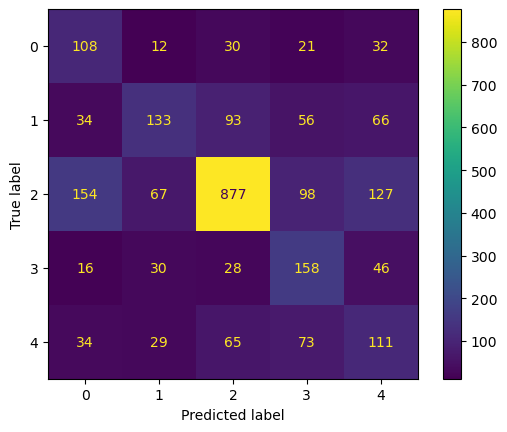

In [67]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Remove some layers from VGG16 - Remove Block 2

In [68]:
base_model = tf.keras.applications.vgg16.VGG16(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 250, 250, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 250, 250, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 125, 125, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 125, 125, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 125, 125, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 62, 62, 128)       0     

In [69]:
base_model_cutted = tf.keras.Sequential()
for layer in base_model.layers:
    if layer.name == "block4_conv1":
        break
    base_model_cutted.add(layer)

base_model_cutted.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 250, 250, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 250, 250, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 125, 125, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 125, 125, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 125, 125, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 62, 62, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 62, 62, 256)      

In [70]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.vgg16.preprocess_input(inputs)
x = base_model_cutted(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dense(256, activation='relu')(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [71]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_4   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_4 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 sequential_1 (Sequential)   (None, 31, 31, 256)       1735488   
                                                                 
 global_average_pooling2d_4   (None, 256)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [72]:
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_REMOVE_LAYER_2_vgg16_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 38.2167 - accuracy: 0.2602
Epoch 00001: val_loss improved from inf to 3.61616, saving model to ./majority_multiclass_models_sc\pretrained_REMOVE_LAYER_2_vgg16_no_tuning_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 82s 254ms/step - loss: 38.2167 - accuracy: 0.2602 - val_loss: 3.6162 - val_accuracy: 0.4251
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 8.6896 - accuracy: 0.2679
Epoch 00002: val_loss improved from 3.61616 to 2.16850, saving model to ./majority_multiclass_models_sc\pretrained_REMOVE_LAYER_2_vgg16_no_tuning_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 80s 247ms/step - loss: 8.6896 - accuracy: 0.2679 - val_loss: 2.1685 - val_accuracy: 0.3086
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 4.6010 - accuracy: 0.2672
Epoch 00003: val_loss improved from 2.16850 to 1.61536, saving model to ./majority_multiclass_mo

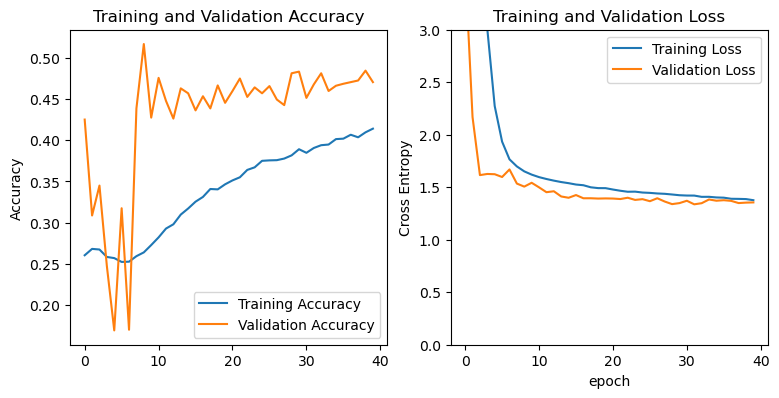

In [73]:
show_history_fit(history)

40/40 [==============================] - 11s 211ms/step - loss: 1.3480 - accuracy: 0.4656
tf.Tensor([0 2 2 ... 2 2 2], shape=(2498,), dtype=int64)
tf.Tensor([2 4 1 ... 2 2 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3127    0.5222    0.3911       203
           1     0.3143    0.2304    0.2659       382
           2     0.7729    0.5737    0.6586      1323
           3     0.2973    0.0791    0.1250       278
           4     0.2284    0.6026    0.3313       312

    accuracy                         0.4656      2498
   macro avg     0.3851    0.4016    0.3544      2498
weighted avg     0.5444    0.4656    0.4765      2498



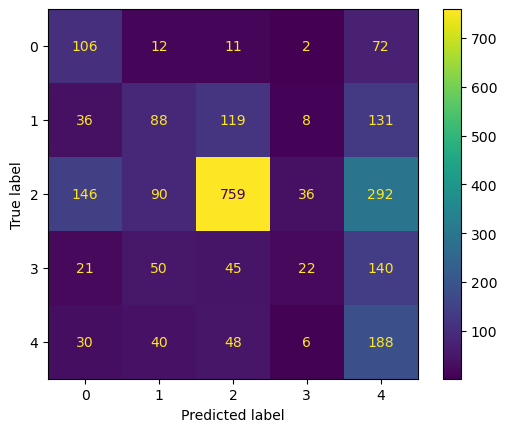

In [74]:
load_best_model_and_evaluate(path_model, test_ds)

### RESNET50

#### Experiment Features Extraction 1

In [22]:
base_model = tf.keras.applications.resnet50.ResNet50(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 256, 256, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 125, 125, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [23]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = tf.keras.applications.resnet.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [24]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 250, 250, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 250, 250, 3)      0         
                                                                 
 resnet50 (Functional)       (None, 8, 8, 2048)        23587712  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense_4 (Dense)             (None, 512)               1049

In [25]:
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_RESNET_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,20)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 1.4023 - accuracy: 0.4333
Epoch 00001: val_loss improved from inf to 1.14161, saving model to ./majority_multiclass_models_sc\pretrained_RESNET_no_tuning_512_dp_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


313/313 [==============================] - 60s 181ms/step - loss: 1.4023 - accuracy: 0.4333 - val_loss: 1.1416 - val_accuracy: 0.5477
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 1.1817 - accuracy: 0.5221
Epoch 00002: val_loss improved from 1.14161 to 1.10449, saving model to ./majority_multiclass_models_sc\pretrained_RESNET_no_tuning_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 56s 175ms/step - loss: 1.1817 - accuracy: 0.5221 - val_loss: 1.1045 - val_accuracy: 0.5573
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 1.1092 - accuracy: 0.5559
Epoch 00003: val_loss did not improve from 1.10449
313/313 [==============================] - 56s 175ms/step - loss: 1.1092 - accuracy: 0.5559 - val_loss: 1.1097 - val_accuracy: 0.5589
Epoch 4/40
313/313 [==============================] - ETA: 0s - loss: 1.0524 - accuracy: 0.5849
Epoch 00004: val_loss did not improve from 1.10449
313/313 [==============================] - 60s 

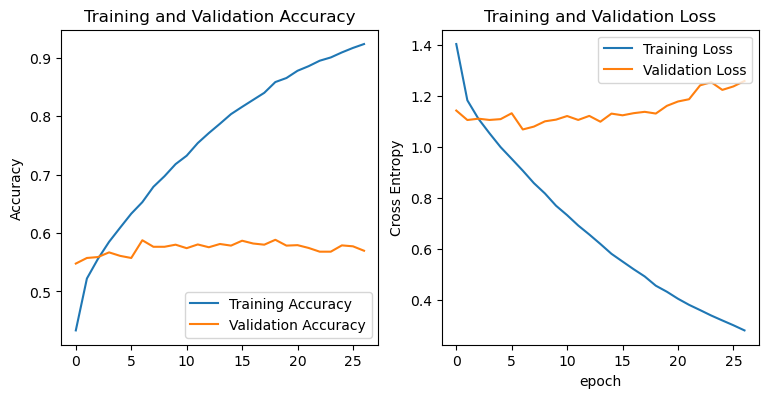

In [26]:
show_history_fit(history)

40/40 [==============================] - 12s 216ms/step - loss: 1.0849 - accuracy: 0.5753
tf.Tensor([2 2 2 ... 1 1 2], shape=(2498,), dtype=int64)
tf.Tensor([2 2 4 ... 1 1 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3596    0.5172    0.4242       203
           1     0.4382    0.4921    0.4636       382
           2     0.8424    0.6463    0.7314      1323
           3     0.4223    0.5180    0.4653       278
           4     0.3444    0.4647    0.3956       312

    accuracy                         0.5753      2498
   macro avg     0.4814    0.5277    0.4960      2498
weighted avg     0.6324    0.5753    0.5939      2498



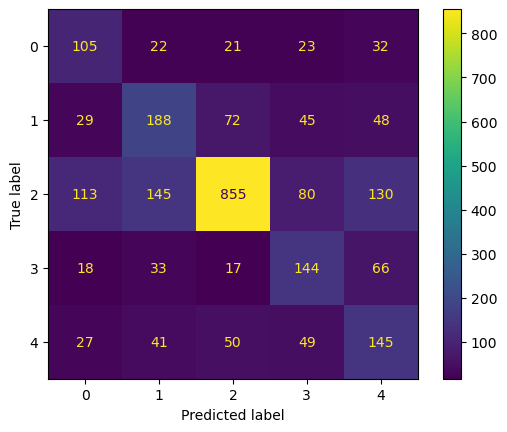

In [27]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Features Extraction 2 - add another layer with dropout-regularization

In [28]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = tf.keras.applications.resnet.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
#x = layers.Flatten()(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.L2(0.001))(x)
x = layers.Dropout(0.4)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [29]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 resnet50 (Functional)       (None, 8, 8, 2048)        23587712  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [31]:
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_RESNET_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,20)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 2.0760 - accuracy: 0.4222
Epoch 00001: val_loss improved from inf to 1.77749, saving model to ./majority_multiclass_models_sc\pretrained_RESNET_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


313/313 [==============================] - 68s 213ms/step - loss: 2.0760 - accuracy: 0.4222 - val_loss: 1.7775 - val_accuracy: 0.5509
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 1.8332 - accuracy: 0.5024
Epoch 00002: val_loss improved from 1.77749 to 1.69634, saving model to ./majority_multiclass_models_sc\pretrained_RESNET_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5
313/313 [==============================] - 82s 255ms/step - loss: 1.8332 - accuracy: 0.5024 - val_loss: 1.6963 - val_accuracy: 0.5557
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 1.7238 - accuracy: 0.5351
Epoch 00003: val_loss improved from 1.69634 to 1.64121, saving model to ./majority_multiclass_models_sc\pretrained_RESNET_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5
313/313 [==============================] - 78s 241ms/step - loss: 1.7238 - accuracy: 0.5351 - val_loss: 1.6412 - val_accuracy: 0.5645
Epoch 4/40
313/313 [==============================] - 

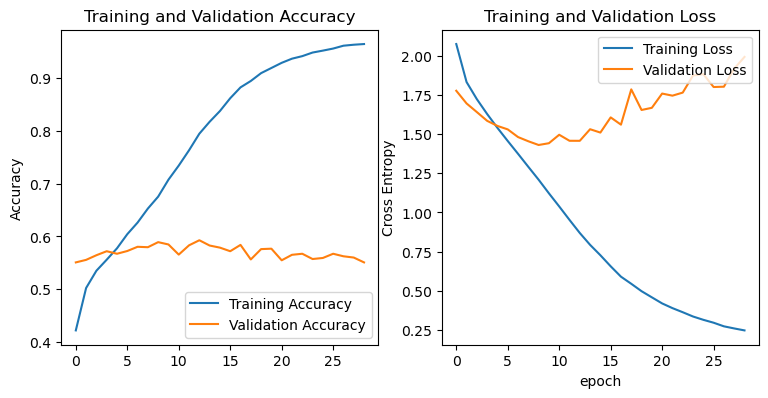

In [32]:
show_history_fit(history)

40/40 [==============================] - 8s 150ms/step - loss: 1.4600 - accuracy: 0.5769
tf.Tensor([0 2 2 ... 4 2 2], shape=(2498,), dtype=int64)
tf.Tensor([2 2 2 ... 4 1 3], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3402    0.5665    0.4251       203
           1     0.4665    0.4738    0.4701       382
           2     0.8561    0.6432    0.7346      1323
           3     0.4433    0.4496    0.4464       278
           4     0.3407    0.5417    0.4183       312

    accuracy                         0.5769      2498
   macro avg     0.4894    0.5350    0.4989      2498
weighted avg     0.6443    0.5769    0.5974      2498



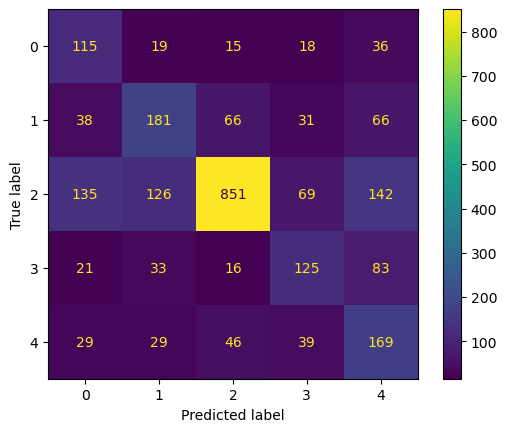

In [33]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Features Extraction 3 - Add more layers

In [75]:
base_model = tf.keras.applications.resnet50.ResNet50(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

In [76]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = tf.keras.applications.resnet.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dense(256, activation='relu')(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [77]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_12 (InputLayer)       [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_5   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_5 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 resnet50 (Functional)       (None, 8, 8, 2048)        23587712  
                                                                 
 global_average_pooling2d_5   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [78]:
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_RESNET_no_tuning_Experiment_3_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,20)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 1.3776 - accuracy: 0.4195
Epoch 00001: val_loss improved from inf to 1.12742, saving model to ./majority_multiclass_models_sc\pretrained_RESNET_no_tuning_Experiment_3_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


313/313 [==============================] - 69s 209ms/step - loss: 1.3776 - accuracy: 0.4195 - val_loss: 1.1274 - val_accuracy: 0.5545
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 1.2407 - accuracy: 0.4927
Epoch 00002: val_loss did not improve from 1.12742
313/313 [==============================] - 81s 252ms/step - loss: 1.2407 - accuracy: 0.4927 - val_loss: 1.1427 - val_accuracy: 0.5297
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 1.1748 - accuracy: 0.5245
Epoch 00003: val_loss improved from 1.12742 to 1.06859, saving model to ./majority_multiclass_models_sc\pretrained_RESNET_no_tuning_Experiment_3_epoch_40_adam_1e-4.h5
313/313 [==============================] - 83s 258ms/step - loss: 1.1748 - accuracy: 0.5245 - val_loss: 1.0686 - val_accuracy: 0.5697
Epoch 4/40
313/313 [==============================] - ETA: 0s - loss: 1.1392 - accuracy: 0.5441
Epoch 00004: val_loss improved from 1.06859 to 1.04948, saving model to ./majority_multiclas

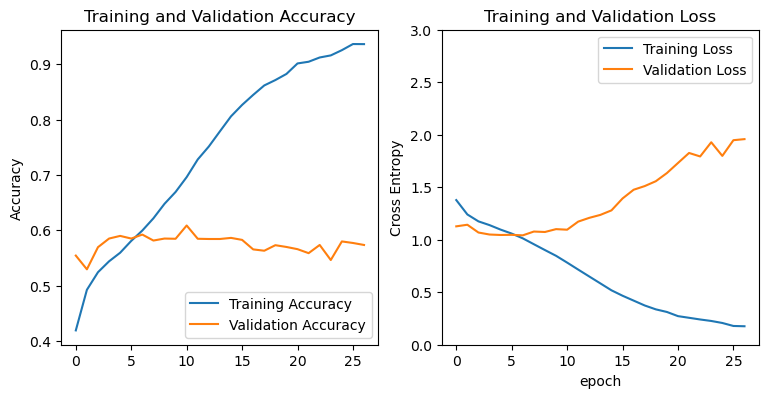

In [81]:
show_history_fit(history)

40/40 [==============================] - 8s 151ms/step - loss: 1.0666 - accuracy: 0.5793
tf.Tensor([3 4 2 ... 4 1 2], shape=(2498,), dtype=int64)
tf.Tensor([2 2 2 ... 1 1 1], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3303    0.5419    0.4104       203
           1     0.4645    0.4791    0.4716       382
           2     0.8479    0.6659    0.7460      1323
           3     0.4756    0.4209    0.4466       278
           4     0.3230    0.5032    0.3935       312

    accuracy                         0.5797      2498
   macro avg     0.4883    0.5222    0.4936      2498
weighted avg     0.6402    0.5797    0.5994      2498



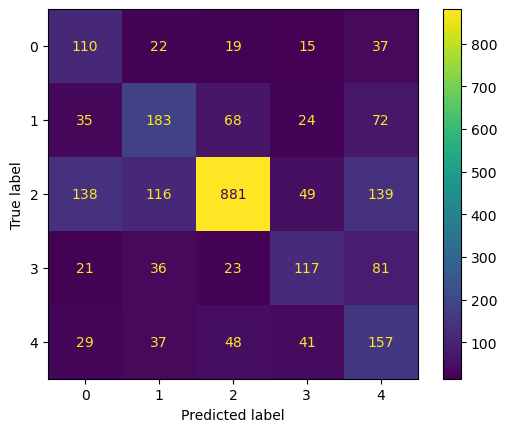

In [82]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment 2: Fine Tunining

##### Esperiemnto Con 70 layer sbloccati

In [28]:
LR = 0.0001
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_RESNET_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 resnet50 (Functional)       (None, 8, 8, 2048)        23587712  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [29]:
model_finetune.trainable = True

base_model_resnet50 = model_finetune.get_layer("resnet50") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_resnet50.layers))
base_model_resnet50.summary()

Number of layers in the base model:  175
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 256, 256, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 125, 125, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                  

In [30]:
num_layer_trainable = 70

start_layer_to_train = len(base_model_resnet50.layers) - num_layer_trainable #

for layer in base_model_resnet50.layers[:start_layer_to_train]:
    #if layer.name.endswith('bn'):
    layer.trainable = False
    #else:
    #    layer.trainable = True

for layer in base_model_resnet50.layers[start_layer_to_train:]:
    if layer.name.endswith('bn'):
        layer.trainable = False


model_finetune.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 resnet50 (Functional)       (None, 8, 8, 2048)        23587712  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [31]:
compile_model(model_finetune, 'adam', LR)

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 resnet50 (Functional)       (None, 8, 8, 2048)        23587712  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [32]:
path_model_tuned = general_path_models+'/majority_multiclass_models_sc/pretrained_RESNET_FINE_tuning_512_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 1.4290 - accuracy: 0.5699
Epoch 00001: val_loss improved from inf to 1.40154, saving model to ./majority_multiclass_models_sc\pretrained_RESNET_FINE_tuning_512_dp_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


313/313 [==============================] - 87s 270ms/step - loss: 1.4290 - accuracy: 0.5699 - val_loss: 1.4015 - val_accuracy: 0.5745
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 1.1960 - accuracy: 0.6585
Epoch 00002: val_loss improved from 1.40154 to 1.38655, saving model to ./majority_multiclass_models_sc\pretrained_RESNET_FINE_tuning_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 84s 265ms/step - loss: 1.1960 - accuracy: 0.6585 - val_loss: 1.3865 - val_accuracy: 0.5940
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 0.9557 - accuracy: 0.7493
Epoch 00003: val_loss did not improve from 1.38655
313/313 [==============================] - 84s 264ms/step - loss: 0.9557 - accuracy: 0.7493 - val_loss: 1.5056 - val_accuracy: 0.5860
Epoch 4/40
313/313 [==============================] - ETA: 0s - loss: 0.7199 - accuracy: 0.8342
Epoch 00004: val_loss did not improve from 1.38655
313/313 [==============================] - 84

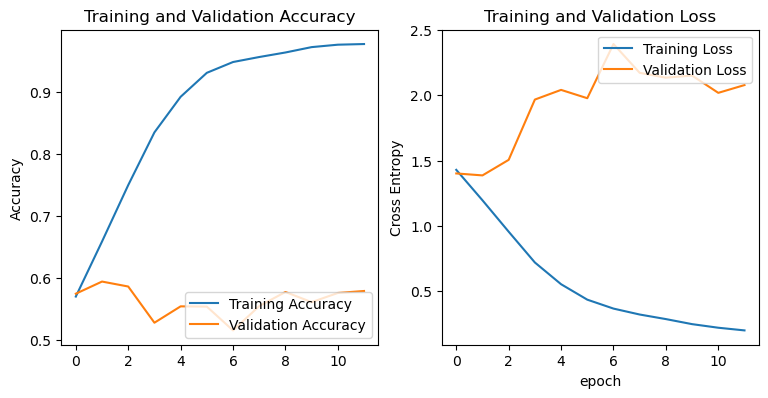

In [33]:
show_history_fit(history_tune)

40/40 [==============================] - 8s 150ms/step - loss: 1.3729 - accuracy: 0.6017
tf.Tensor([2 2 3 ... 2 4 2], shape=(2498,), dtype=int64)
tf.Tensor([2 2 2 ... 2 4 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3666    0.5616    0.4436       203
           1     0.4514    0.5105    0.4791       382
           2     0.8306    0.6969    0.7579      1323
           3     0.5388    0.4245    0.4748       278
           4     0.3592    0.4904    0.4146       312

    accuracy                         0.6013      2498
   macro avg     0.5093    0.5368    0.5140      2498
weighted avg     0.6436    0.6013    0.6154      2498



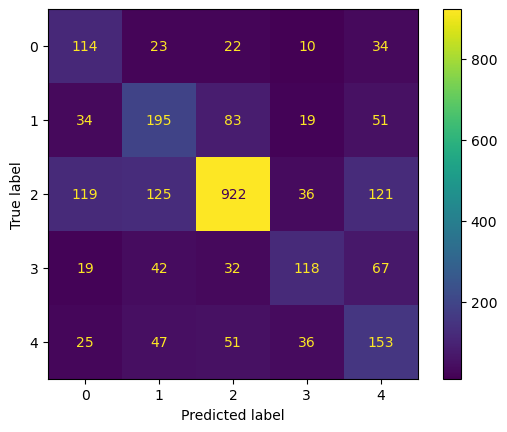

In [34]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

##### Experiment Fine Tunining --> Block 1

In [83]:
LR = 0.0001
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_RESNET_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)

In [84]:
model_finetune.trainable = True

base_model_resnet50 = model_finetune.get_layer("resnet50") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_resnet50.layers))
base_model_resnet50.summary()

Number of layers in the base model:  175
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 256, 256, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 125, 125, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                  

In [85]:
set_trainable = False
for layer in base_model_resnet50.layers:
    if layer.name == 'conv5_block1_1_conv': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable:
        if layer.name.endswith('bn'): # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
            layer.trainable = False
        else:
            layer.trainable = True
    else:
        layer.trainable = False

In [86]:
path_model_tuned = general_path_models+'/majority_multiclass_models_sc/pretrained_RESNET_FINE_tuning_block1_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 1.1235 - accuracy: 0.7062
Epoch 00001: val_loss improved from inf to 1.48483, saving model to ./majority_multiclass_models_sc\pretrained_RESNET_FINE_tuning_block1_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


313/313 [==============================] - 60s 184ms/step - loss: 1.1235 - accuracy: 0.7062 - val_loss: 1.4848 - val_accuracy: 0.5653
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 1.0410 - accuracy: 0.7336
Epoch 00002: val_loss improved from 1.48483 to 1.48147, saving model to ./majority_multiclass_models_sc\pretrained_RESNET_FINE_tuning_block1_epoch_40_adam_1e-4.h5
313/313 [==============================] - 61s 193ms/step - loss: 1.0410 - accuracy: 0.7336 - val_loss: 1.4815 - val_accuracy: 0.5713
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 0.9513 - accuracy: 0.7666
Epoch 00003: val_loss improved from 1.48147 to 1.44582, saving model to ./majority_multiclass_models_sc\pretrained_RESNET_FINE_tuning_block1_epoch_40_adam_1e-4.h5
313/313 [==============================] - 57s 179ms/step - loss: 0.9513 - accuracy: 0.7666 - val_loss: 1.4458 - val_accuracy: 0.5868
Epoch 4/40
313/313 [==============================] - ETA: 0s - loss: 0.8767 - a

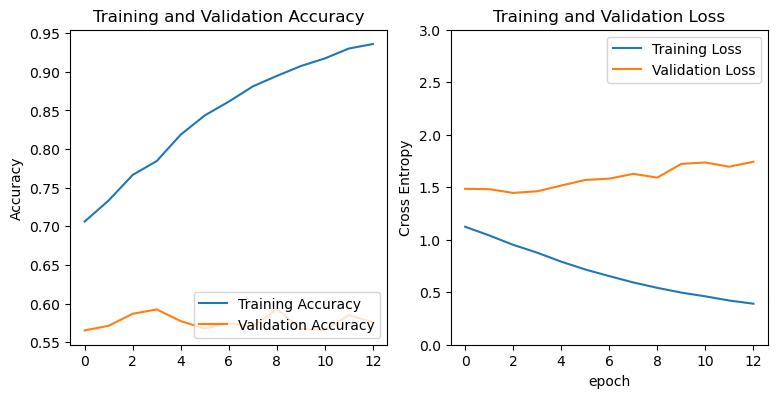

In [87]:
show_history_fit(history_tune)

40/40 [==============================] - 8s 151ms/step - loss: 1.4794 - accuracy: 0.5825
tf.Tensor([2 1 3 ... 0 2 3], shape=(2498,), dtype=int64)
tf.Tensor([3 0 3 ... 2 2 3], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3702    0.5271    0.4350       203
           1     0.4311    0.5079    0.4663       382
           2     0.8278    0.6652    0.7376      1323
           3     0.4417    0.4496    0.4456       278
           4     0.3608    0.4776    0.4110       312

    accuracy                         0.5825      2498
   macro avg     0.4863    0.5255    0.4991      2498
weighted avg     0.6287    0.5825    0.5983      2498



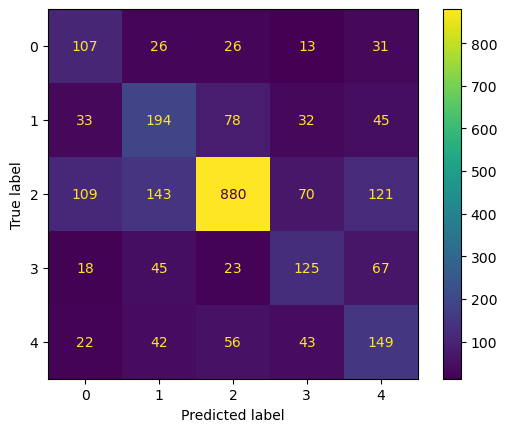

In [88]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

##### Experiment Fine Tuning --> Block 2

In [117]:
LR = 0.0001
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_RESNET_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)

In [118]:
model_finetune.trainable = True

base_model_resnet50 = model_finetune.get_layer("resnet50") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_resnet50.layers))
base_model_resnet50.summary()

Number of layers in the base model:  175
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 256, 256, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 125, 125, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                  

In [119]:
set_trainable = False
for layer in base_model_resnet50.layers:
    if layer.name == 'conv4_block1_1_conv': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable:
        if layer.name.endswith('bn'): # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
            layer.trainable = False
        else:
            layer.trainable = True
    else:
        layer.trainable = False

In [120]:
path_model_tuned = general_path_models+'/majority_multiclass_models_sc/pretrained_RESNET_FINE_tuning_block2_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 1.1207 - accuracy: 0.7072
Epoch 00001: val_loss improved from inf to 1.47234, saving model to ./majority_multiclass_models_sc\pretrained_RESNET_FINE_tuning_block2_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


313/313 [==============================] - 60s 185ms/step - loss: 1.1207 - accuracy: 0.7072 - val_loss: 1.4723 - val_accuracy: 0.5721
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 1.0365 - accuracy: 0.7355
Epoch 00002: val_loss did not improve from 1.47234
313/313 [==============================] - 57s 180ms/step - loss: 1.0365 - accuracy: 0.7355 - val_loss: 1.4957 - val_accuracy: 0.5665
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 0.9505 - accuracy: 0.7636
Epoch 00003: val_loss did not improve from 1.47234
313/313 [==============================] - 57s 178ms/step - loss: 0.9505 - accuracy: 0.7636 - val_loss: 1.4943 - val_accuracy: 0.5701
Epoch 4/40
313/313 [==============================] - ETA: 0s - loss: 0.8749 - accuracy: 0.7885
Epoch 00004: val_loss did not improve from 1.47234
313/313 [==============================] - 57s 178ms/step - loss: 0.8749 - accuracy: 0.7885 - val_loss: 1.5295 - val_accuracy: 0.5617
Epoch 5/40
313/313 [===

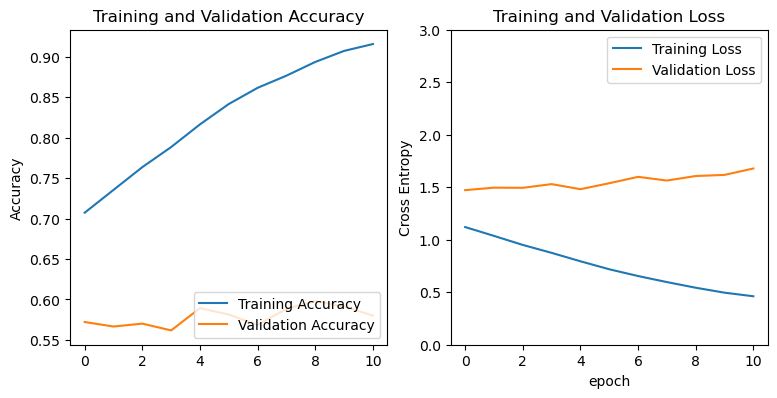

In [121]:
show_history_fit(history_tune)

40/40 [==============================] - 9s 184ms/step - loss: 1.4903 - accuracy: 0.5620
tf.Tensor([1 2 0 ... 1 2 1], shape=(2498,), dtype=int64)
tf.Tensor([1 3 2 ... 1 2 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3219    0.6010    0.4192       203
           1     0.4172    0.5209    0.4633       382
           2     0.8585    0.6100    0.7132      1323
           3     0.4299    0.4964    0.4608       278
           4     0.3622    0.4423    0.3983       312

    accuracy                         0.5620      2498
   macro avg     0.4779    0.5341    0.4910      2498
weighted avg     0.6377    0.5620    0.5837      2498



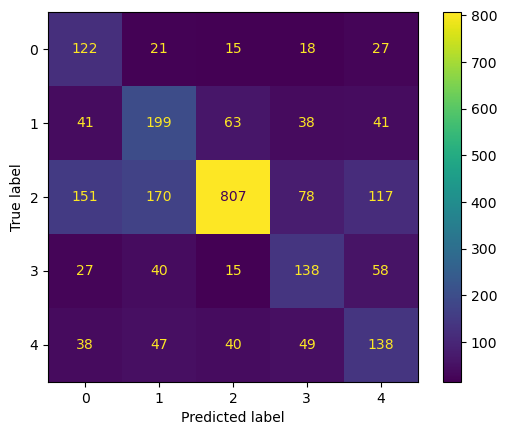

In [122]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

##### Experiment fine Tuning ---> Block 3

In [123]:
LR = 0.0001
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_RESNET_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)

In [124]:
model_finetune.trainable = True

base_model_resnet50 = model_finetune.get_layer("resnet50") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_resnet50.layers))
base_model_resnet50.summary()

Number of layers in the base model:  175
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 256, 256, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 125, 125, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                  

In [125]:
set_trainable = False
for layer in base_model_resnet50.layers:
    if layer.name == 'conv3_block1_1_conv': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable:
        if layer.name.endswith('bn'): # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
            layer.trainable = False
        else:
            layer.trainable = True
    else:
        layer.trainable = False

In [126]:
path_model_tuned = general_path_models+'/majority_multiclass_models_sc/pretrained_RESNET_FINE_tuning_block3_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 1.1202 - accuracy: 0.7053
Epoch 00001: val_loss improved from inf to 1.47480, saving model to ./majority_multiclass_models_sc\pretrained_RESNET_FINE_tuning_block3_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


313/313 [==============================] - 59s 182ms/step - loss: 1.1202 - accuracy: 0.7053 - val_loss: 1.4748 - val_accuracy: 0.5733
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 1.0401 - accuracy: 0.7301
Epoch 00002: val_loss improved from 1.47480 to 1.47066, saving model to ./majority_multiclass_models_sc\pretrained_RESNET_FINE_tuning_block3_epoch_40_adam_1e-4.h5
313/313 [==============================] - 57s 179ms/step - loss: 1.0401 - accuracy: 0.7301 - val_loss: 1.4707 - val_accuracy: 0.5685
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 0.9608 - accuracy: 0.7585
Epoch 00003: val_loss did not improve from 1.47066
313/313 [==============================] - 57s 178ms/step - loss: 0.9608 - accuracy: 0.7585 - val_loss: 1.4718 - val_accuracy: 0.5764
Epoch 4/40
313/313 [==============================] - ETA: 0s - loss: 0.8733 - accuracy: 0.7891
Epoch 00004: val_loss did not improve from 1.47066
313/313 [==============================] - 57

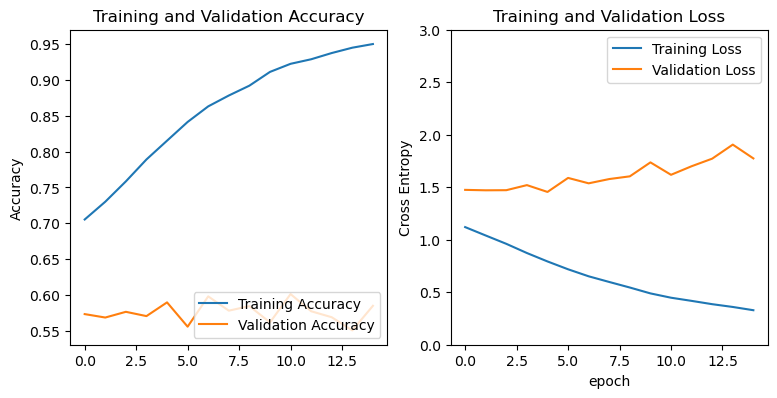

In [127]:
show_history_fit(history_tune)

40/40 [==============================] - 8s 151ms/step - loss: 1.5001 - accuracy: 0.5829
tf.Tensor([2 2 4 ... 4 4 0], shape=(2498,), dtype=int64)
tf.Tensor([1 2 2 ... 4 4 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3485    0.5665    0.4315       203
           1     0.4386    0.5052    0.4696       382
           2     0.8187    0.6757    0.7404      1323
           3     0.4253    0.3993    0.4119       278
           4     0.3787    0.4551    0.4134       312

    accuracy                         0.5825      2498
   macro avg     0.4820    0.5204    0.4933      2498
weighted avg     0.6236    0.5825    0.5965      2498



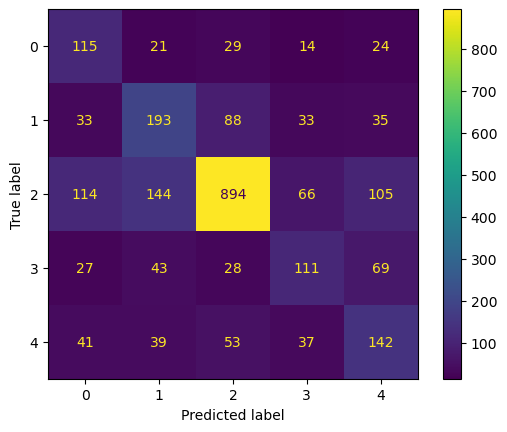

In [128]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment Remover some layers --> Block 1

In [103]:
base_model = tf.keras.applications.resnet50.ResNet50(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_13 (InputLayer)          [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 256, 256, 3)  0           ['input_13[0][0]']               
                                                                                                  
 conv1_conv (Conv2D)            (None, 125, 125, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [104]:
#base_model_cutted = tf.keras.Sequential()
index = 0
for i, layer in enumerate(base_model.layers):
    if layer.name == "conv4_block6_out":
        index = i
        break

base_model_cutted = tf.keras.Model(base_model.input, base_model.layers[index].output, name='resnet50_cut')

base_model_cutted.summary()

Model: "resnet50_cut"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_13 (InputLayer)          [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 256, 256, 3)  0           ['input_13[0][0]']               
                                                                                                  
 conv1_conv (Conv2D)            (None, 125, 125, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                       

In [105]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.resnet.preprocess_input(inputs)
x = base_model_cutted(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [106]:
LR = 0.0002
compile_model(model, 'adam', LR)

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_6   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_6 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 resnet50_cut (Functional)   (None, 16, 16, 1024)      8589184   
                                                                 
 global_average_pooling2d_6   (None, 1024)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [107]:
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_REMOVE_LAYER_conv4_resnet_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 1.3648 - accuracy: 0.4268
Epoch 00001: val_loss improved from inf to 1.23318, saving model to ./majority_multiclass_models_sc\pretrained_REMOVE_LAYER_conv4_resnet_no_tuning_512_dp_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


313/313 [==============================] - 54s 163ms/step - loss: 1.3648 - accuracy: 0.4268 - val_loss: 1.2332 - val_accuracy: 0.5082
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 1.2623 - accuracy: 0.4794
Epoch 00002: val_loss improved from 1.23318 to 1.09807, saving model to ./majority_multiclass_models_sc\pretrained_REMOVE_LAYER_conv4_resnet_no_tuning_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 52s 161ms/step - loss: 1.2623 - accuracy: 0.4794 - val_loss: 1.0981 - val_accuracy: 0.5733
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 1.2201 - accuracy: 0.5001
Epoch 00003: val_loss did not improve from 1.09807
313/313 [==============================] - 51s 160ms/step - loss: 1.2201 - accuracy: 0.5001 - val_loss: 1.1533 - val_accuracy: 0.5357
Epoch 4/40
313/313 [==============================] - ETA: 0s - loss: 1.1942 - accuracy: 0.5132
Epoch 00004: val_loss did not improve from 1.09807
313/313 [===================

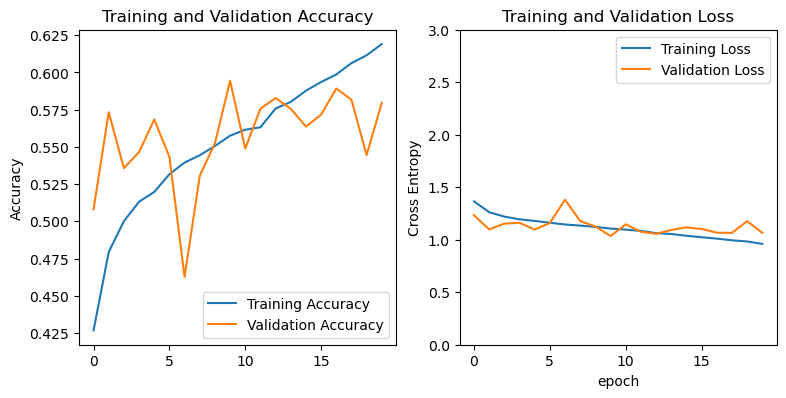

In [108]:
show_history_fit(history)

40/40 [==============================] - 8s 148ms/step - loss: 1.0413 - accuracy: 0.5969
tf.Tensor([2 1 1 ... 2 2 2], shape=(2498,), dtype=int64)
tf.Tensor([2 3 2 ... 4 2 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.4206    0.4828    0.4495       203
           1     0.4695    0.4843    0.4768       382
           2     0.8043    0.7113    0.7549      1323
           3     0.5000    0.4676    0.4833       278
           4     0.3084    0.4359    0.3612       312

    accuracy                         0.5965      2498
   macro avg     0.5006    0.5164    0.5052      2498
weighted avg     0.6261    0.5965    0.6082      2498



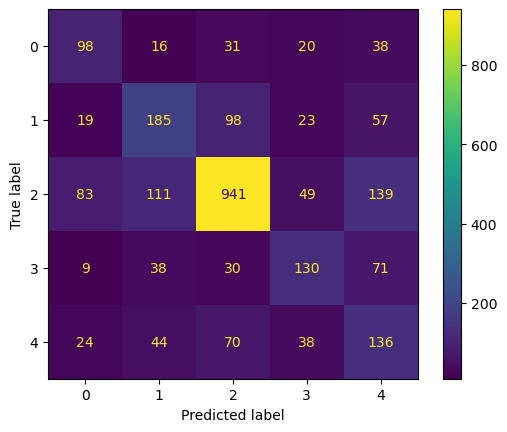

In [109]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Remove Layers --> Block 2

In [110]:
base_model = tf.keras.applications.resnet50.ResNet50(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_15 (InputLayer)          [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 256, 256, 3)  0           ['input_15[0][0]']               
                                                                                                  
 conv1_conv (Conv2D)            (None, 125, 125, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [111]:
index = 0
for i, layer in enumerate(base_model.layers):
    if layer.name == "conv3_block4_out":
        index = i
        break

base_model_cutted = tf.keras.Model(base_model.input, base_model.layers[index].output, name='resnet50_cut')

base_model_cutted.summary()

Model: "resnet50_cut"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_15 (InputLayer)          [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 256, 256, 3)  0           ['input_15[0][0]']               
                                                                                                  
 conv1_conv (Conv2D)            (None, 125, 125, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                       

In [112]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.resnet.preprocess_input(inputs)
x = base_model_cutted(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [113]:
LR = 0.0002
compile_model(model, 'adam', LR)

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_16 (InputLayer)       [(None, 250, 250, 3)]     0         
                                                                 
 tf.__operators__.getitem_7   (None, 250, 250, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_7 (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 resnet50_cut (Functional)   (None, 32, 32, 512)       1460096   
                                                                 
 global_average_pooling2d_7   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [114]:
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_REMOVE_LAYER_conv3_resnet_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
312/313 [============================>.] - ETA: 0s - loss: 1.4643 - accuracy: 0.3790
Epoch 00001: val_loss improved from inf to 1.31088, saving model to ./majority_multiclass_models_sc\pretrained_REMOVE_LAYER_conv3_resnet_no_tuning_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 49s 151ms/step - loss: 1.4640 - accuracy: 0.3791 - val_loss: 1.3109 - val_accuracy: 0.4914
Epoch 2/40


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


312/313 [============================>.] - ETA: 0s - loss: 1.3763 - accuracy: 0.4256
Epoch 00002: val_loss did not improve from 1.31088
313/313 [==============================] - 48s 149ms/step - loss: 1.3760 - accuracy: 0.4256 - val_loss: 1.3308 - val_accuracy: 0.4806
Epoch 3/40
312/313 [============================>.] - ETA: 0s - loss: 1.3520 - accuracy: 0.4414
Epoch 00003: val_loss improved from 1.31088 to 1.27203, saving model to ./majority_multiclass_models_sc\pretrained_REMOVE_LAYER_conv3_resnet_no_tuning_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 48s 151ms/step - loss: 1.3519 - accuracy: 0.4415 - val_loss: 1.2720 - val_accuracy: 0.5006
Epoch 4/40
312/313 [============================>.] - ETA: 0s - loss: 1.3356 - accuracy: 0.4426
Epoch 00004: val_loss improved from 1.27203 to 1.19173, saving model to ./majority_multiclass_models_sc\pretrained_REMOVE_LAYER_conv3_resnet_no_tuning_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 4

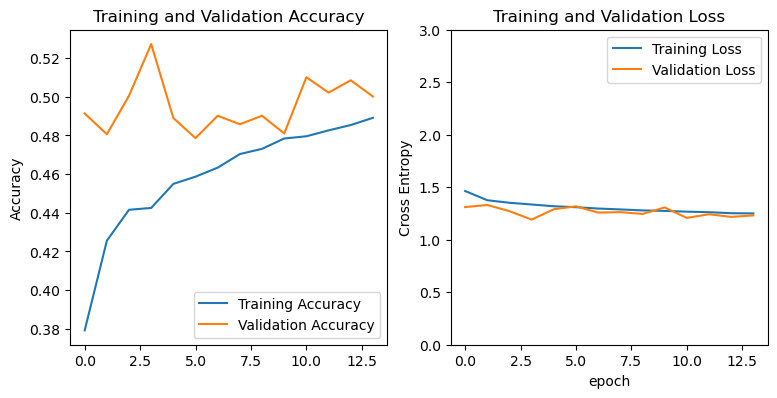

In [115]:
show_history_fit(history)

In [1]:
load_best_model_and_evaluate(path_model, test_ds)

NameError: name 'load_best_model_and_evaluate' is not defined

#### Experiment fine tunining on remove Some Layers

In [129]:
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_REMOVE_LAYER_conv4_resnet_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)

In [130]:
model_finetune.trainable = True

#base_model_resnet50 = model_finetune.get_layer("resnet50") # change the name looking at the summary IMPORTANT!
#print("Number of layers in the base model: ", len(base_model_resnet50.layers))
#base_model_resnet50.summary()

In [131]:
set_trainable = False
for layer in model_finetune.layers:
    if layer.name == 'conv3_block1_1_conv': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable:
        if layer.name.endswith('bn'): # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
            layer.trainable = False
        else:
            layer.trainable = True
    else:
        layer.trainable = False

In [132]:
path_model_tuned = general_path_models+'/majority_multiclass_models_sc/pretrained_RESNET_FINE_tuning_REMOVE_LAYERS_BLOCK1_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 1.0963 - accuracy: 0.5604
Epoch 00001: val_loss improved from inf to 1.11127, saving model to ./majority_multiclass_models_sc\pretrained_RESNET_FINE_tuning_REMOVE_LAYERS_BLOCK1_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


313/313 [==============================] - 53s 162ms/step - loss: 1.0963 - accuracy: 0.5604 - val_loss: 1.1113 - val_accuracy: 0.5565
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 1.0779 - accuracy: 0.5702
Epoch 00002: val_loss did not improve from 1.11127
313/313 [==============================] - 52s 161ms/step - loss: 1.0779 - accuracy: 0.5702 - val_loss: 1.1932 - val_accuracy: 0.5246
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 1.0650 - accuracy: 0.5738
Epoch 00003: val_loss improved from 1.11127 to 1.09647, saving model to ./majority_multiclass_models_sc\pretrained_RESNET_FINE_tuning_REMOVE_LAYERS_BLOCK1_epoch_40_adam_1e-4.h5
313/313 [==============================] - 52s 161ms/step - loss: 1.0650 - accuracy: 0.5738 - val_loss: 1.0965 - val_accuracy: 0.5737
Epoch 4/40
313/313 [==============================] - ETA: 0s - loss: 1.0530 - accuracy: 0.5809
Epoch 00004: val_loss did not improve from 1.09647
313/313 [======================

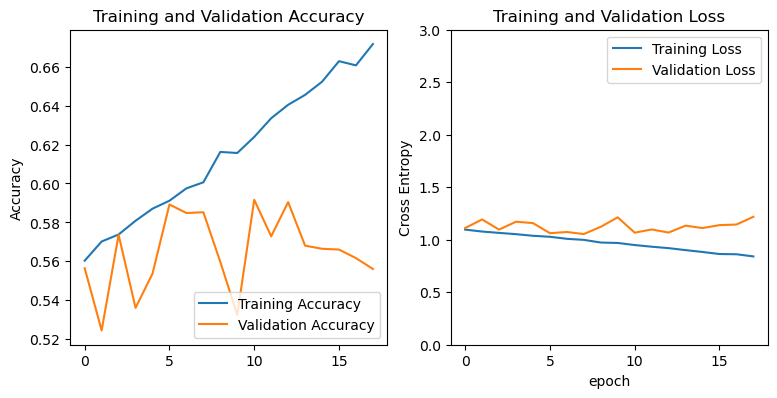

In [133]:
show_history_fit(history_tune)

40/40 [==============================] - 8s 144ms/step - loss: 1.0598 - accuracy: 0.5861
tf.Tensor([0 2 2 ... 4 1 2], shape=(2498,), dtype=int64)
tf.Tensor([1 1 2 ... 2 1 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3951    0.5567    0.4622       203
           1     0.4292    0.5157    0.4685       382
           2     0.8240    0.6795    0.7448      1323
           3     0.4634    0.4101    0.4351       278
           4     0.3389    0.4519    0.3874       312

    accuracy                         0.5861      2498
   macro avg     0.4901    0.5228    0.4996      2498
weighted avg     0.6281    0.5861    0.6005      2498



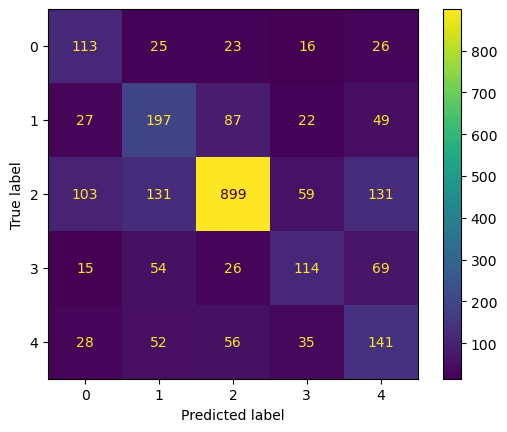

In [134]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

### MobilNet

#### Experiment Features Extration ---> Add one layer

In [11]:
base_model = tf.keras.applications.mobilenet_v2.MobileNetV2(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  
                                )                                              

In [64]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
#x = data_augmentation(inputs)
x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.4)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [ ]:
LR = 0.0001
compile_model(model, 'adam', LR)

In [66]:
path_model = general_path_models+'/extra_majority_multiclass_models_sc/extra_pretrained_MOBILENETV2_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,60,30)

Epoch 1/60
313/313 [==============================] - ETA: 0s - loss: 1.5096 - accuracy: 0.3805
Epoch 00001: val_loss improved from inf to 1.15835, saving model to ./extra_majority_multiclass_models_sc\extra_pretrained_MOBILENETV2_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


313/313 [==============================] - 61s 182ms/step - loss: 1.5096 - accuracy: 0.3805 - val_loss: 1.1583 - val_accuracy: 0.5497
Epoch 2/60
312/313 [============================>.] - ETA: 0s - loss: 1.3201 - accuracy: 0.4600
Epoch 00002: val_loss did not improve from 1.15835
313/313 [==============================] - 70s 219ms/step - loss: 1.3202 - accuracy: 0.4599 - val_loss: 1.2064 - val_accuracy: 0.5257
Epoch 3/60
312/313 [============================>.] - ETA: 0s - loss: 1.2743 - accuracy: 0.4807
Epoch 00003: val_loss did not improve from 1.15835
313/313 [==============================] - 83s 257ms/step - loss: 1.2745 - accuracy: 0.4807 - val_loss: 1.1622 - val_accuracy: 0.5497
Epoch 4/60
312/313 [============================>.] - ETA: 0s - loss: 1.2436 - accuracy: 0.4927
Epoch 00004: val_loss improved from 1.15835 to 1.14459, saving model to ./extra_majority_multiclass_models_sc\extra_pretrained_MOBILENETV2_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5
313/313 [======

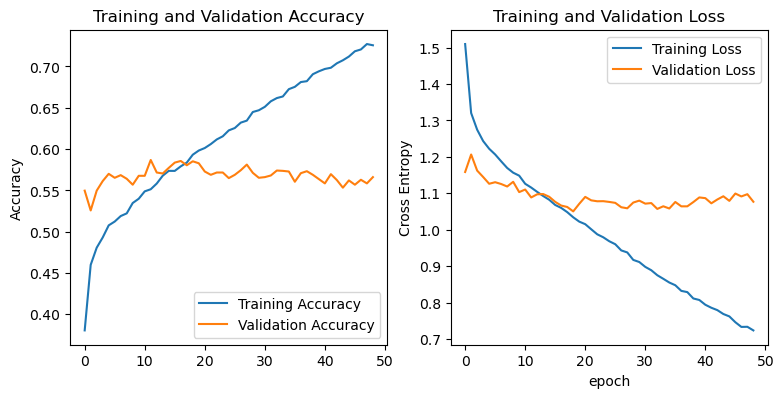

In [67]:
show_history_fit(history)

40/40 [==============================] - 6s 118ms/step - loss: 1.0524 - accuracy: 0.5993
tf.Tensor([2 4 4 ... 4 1 1], shape=(2498,), dtype=int64)
tf.Tensor([1 1 2 ... 2 4 4], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3578    0.5517    0.4341       203
           1     0.4856    0.4424    0.4630       382
           2     0.8303    0.6992    0.7591      1323
           3     0.4692    0.4928    0.4807       278
           4     0.3573    0.4936    0.4145       312

    accuracy                         0.5993      2498
   macro avg     0.5001    0.5359    0.5103      2498
weighted avg     0.6400    0.5993    0.6134      2498



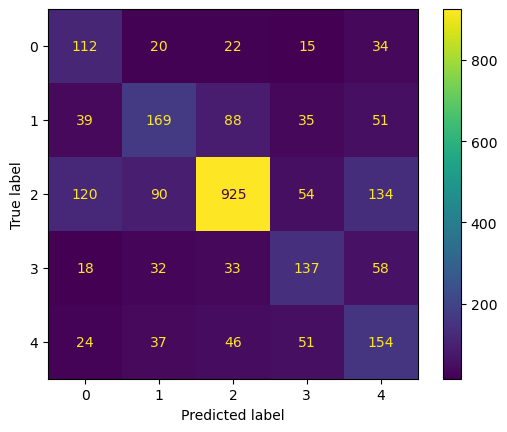

In [68]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Features extraction --> Add two layers with dropout and regularization

In [12]:
base_model = tf.keras.applications.mobilenet_v2.MobileNetV2(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  
                                )                                              

In [13]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
#x = data_augmentation(inputs)
x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.L2(0.001))(x)
x = layers.Dropout(0.4)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [14]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                      

In [15]:
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_MOBILENETV2_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 2.0822 - accuracy: 0.4015
Epoch 00001: val_loss improved from inf to 1.81188, saving model to ./majority_multiclass_models_sc\pretrained_MOBILENETV2_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5
313/313 [==============================] - 50s 136ms/step - loss: 2.0822 - accuracy: 0.4015 - val_loss: 1.8119 - val_accuracy: 0.5349
Epoch 2/40


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


312/313 [============================>.] - ETA: 0s - loss: 1.8650 - accuracy: 0.4853
Epoch 00002: val_loss improved from 1.81188 to 1.74478, saving model to ./majority_multiclass_models_sc\pretrained_MOBILENETV2_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5
313/313 [==============================] - 44s 137ms/step - loss: 1.8648 - accuracy: 0.4854 - val_loss: 1.7448 - val_accuracy: 0.5337
Epoch 3/40
312/313 [============================>.] - ETA: 0s - loss: 1.7575 - accuracy: 0.5132
Epoch 00003: val_loss improved from 1.74478 to 1.66252, saving model to ./majority_multiclass_models_sc\pretrained_MOBILENETV2_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5
313/313 [==============================] - 44s 138ms/step - loss: 1.7576 - accuracy: 0.5131 - val_loss: 1.6625 - val_accuracy: 0.5513
Epoch 4/40
312/313 [============================>.] - ETA: 0s - loss: 1.6674 - accuracy: 0.5307
Epoch 00004: val_loss improved from 1.66252 to 1.62357, saving model to ./majority_multiclass

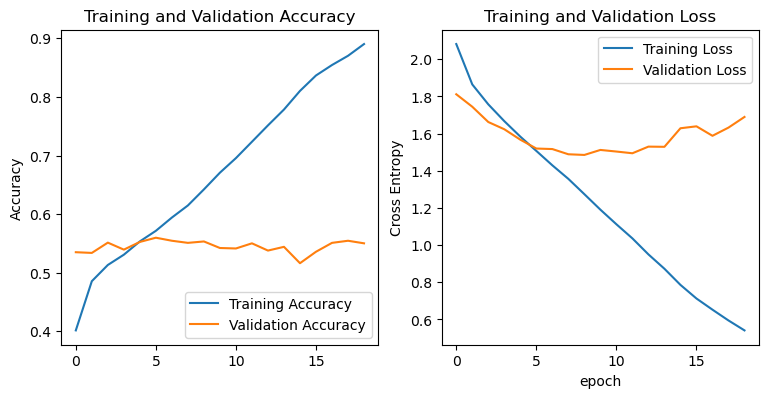

In [16]:
show_history_fit(history)

40/40 [==============================] - 7s 122ms/step - loss: 1.4914 - accuracy: 0.5492
tf.Tensor([2 2 4 ... 1 0 2], shape=(2498,), dtype=int64)
tf.Tensor([4 2 3 ... 3 2 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3293    0.5320    0.4068       203
           1     0.4142    0.4738    0.4420       382
           2     0.8391    0.6032    0.7018      1323
           3     0.3782    0.5360    0.4435       278
           4     0.3505    0.4359    0.3886       312

    accuracy                         0.5492      2498
   macro avg     0.4623    0.5162    0.4765      2498
weighted avg     0.6204    0.5492    0.5702      2498



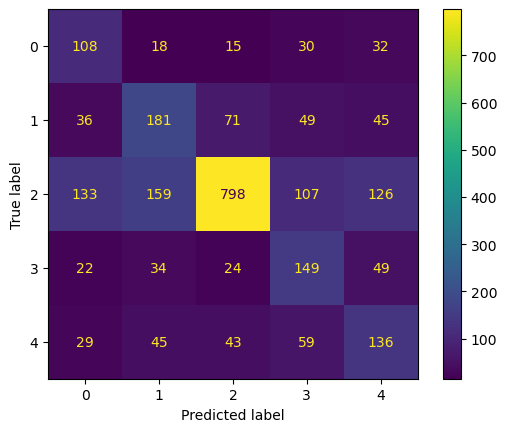

In [17]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Features Extraction - add other layers

In [12]:
base_model = tf.keras.applications.mobilenet_v2.MobileNetV2(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

In [13]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dense(256, activation='relu')(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [14]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                      

In [15]:
path_model = general_path_models+'/majority_multiclass_models_sc/extra_pretrained_MOBILENETV2_no_tuning_OTHER_LAYERS_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 1.5009 - accuracy: 0.3401
Epoch 00001: val_loss improved from inf to 1.22823, saving model to ./majority_multiclass_models_sc\extra_pretrained_MOBILENETV2_no_tuning_OTHER_LAYERS_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 58s 154ms/step - loss: 1.5009 - accuracy: 0.3401 - val_loss: 1.2282 - val_accuracy: 0.5269


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


Epoch 2/40
312/313 [============================>.] - ETA: 0s - loss: 1.3599 - accuracy: 0.4307
Epoch 00002: val_loss improved from 1.22823 to 1.20643, saving model to ./majority_multiclass_models_sc\extra_pretrained_MOBILENETV2_no_tuning_OTHER_LAYERS_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 44s 138ms/step - loss: 1.3598 - accuracy: 0.4308 - val_loss: 1.2064 - val_accuracy: 0.5230
Epoch 3/40
312/313 [============================>.] - ETA: 0s - loss: 1.3135 - accuracy: 0.4558
Epoch 00003: val_loss improved from 1.20643 to 1.17225, saving model to ./majority_multiclass_models_sc\extra_pretrained_MOBILENETV2_no_tuning_OTHER_LAYERS_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 44s 138ms/step - loss: 1.3135 - accuracy: 0.4558 - val_loss: 1.1723 - val_accuracy: 0.5345
Epoch 4/40
312/313 [============================>.] - ETA: 0s - loss: 1.2838 - accuracy: 0.4732
Epoch 00004: val_loss improved from 1.17225 to 1.14230, saving model to ./majority

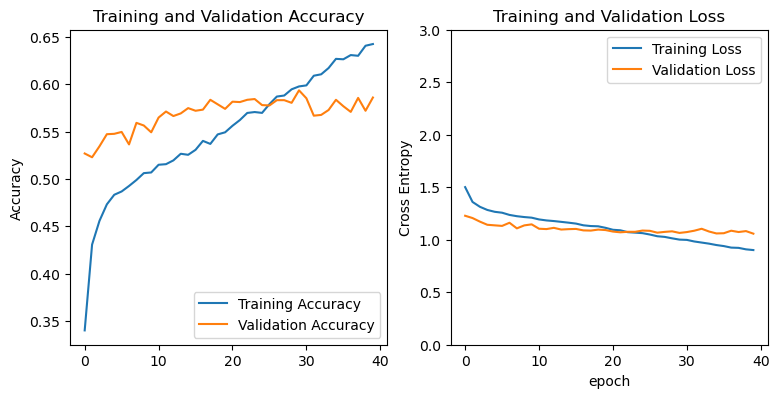

In [16]:
show_history_fit(history)

40/40 [==============================] - 8s 139ms/step - loss: 1.0668 - accuracy: 0.5973
tf.Tensor([2 2 4 ... 3 2 2], shape=(2498,), dtype=int64)
tf.Tensor([4 2 3 ... 3 2 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3434    0.5616    0.4262       203
           1     0.5034    0.3822    0.4345       382
           2     0.8090    0.7105    0.7565      1323
           3     0.4509    0.5288    0.4868       278
           4     0.3737    0.4647    0.4143       312

    accuracy                         0.5973      2498
   macro avg     0.4961    0.5296    0.5037      2498
weighted avg     0.6302    0.5973    0.6077      2498



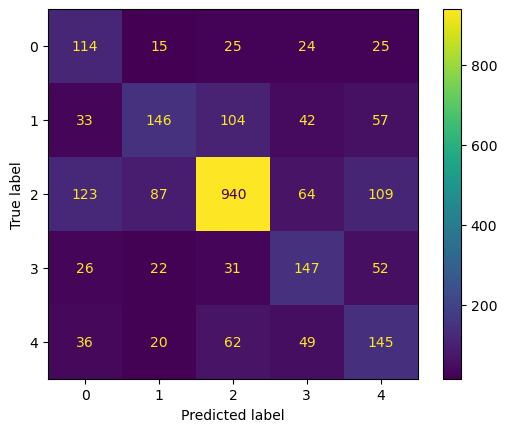

In [17]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment fine tuning Sblocca 10 layers

In [39]:
LR = 0.0001
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_MOBILENETV2_no_tuning_512_dp_regularization_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                      

In [40]:
model_finetune.trainable = True

base_model_resnet50 = model_finetune.get_layer("mobilenetv2_1.00_224") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_resnet50.layers))
base_model_resnet50.summary()

Number of layers in the base model:  154
Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  
                                )     

In [43]:
num_layer_trainable = 144

#start_layer_to_train = len(base_model_resnet50.layers) - num_layer_trainable

for layer in base_model_resnet50.layers[:num_layer_trainable]:
    #if layer.name.endswith('bn'):
    layer.trainable = False
    #else:
    #    layer.trainable = True

for layer in base_model_resnet50.layers[num_layer_trainable:]:
    if layer.name.endswith('BN'):
        layer.trainable = False
    else:
        layer.trainable = True


model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                      

In [44]:
compile_model(model_finetune, 'adam', LR)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                      

In [45]:
path_model_tuned = general_path_models+'/majority_multiclass_models_sc/pretrained_MOBILNETV2_FINE_tuning_512_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
312/313 [============================>.] - ETA: 0s - loss: 1.2605 - accuracy: 0.6372
Epoch 00001: val_loss improved from inf to 1.48402, saving model to ./majority_multiclass_models_sc\pretrained_MOBILNETV2_FINE_tuning_512_dp_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


313/313 [==============================] - 50s 150ms/step - loss: 1.2603 - accuracy: 0.6373 - val_loss: 1.4840 - val_accuracy: 0.5721
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 1.0821 - accuracy: 0.7085
Epoch 00002: val_loss did not improve from 1.48402
313/313 [==============================] - 82s 256ms/step - loss: 1.0821 - accuracy: 0.7085 - val_loss: 1.5923 - val_accuracy: 0.5589
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 0.9193 - accuracy: 0.7721
Epoch 00003: val_loss did not improve from 1.48402
313/313 [==============================] - 82s 256ms/step - loss: 0.9193 - accuracy: 0.7721 - val_loss: 1.5654 - val_accuracy: 0.5952
Epoch 4/40
313/313 [==============================] - ETA: 0s - loss: 0.7651 - accuracy: 0.8248
Epoch 00004: val_loss did not improve from 1.48402
313/313 [==============================] - 84s 259ms/step - loss: 0.7651 - accuracy: 0.8248 - val_loss: 1.7161 - val_accuracy: 0.5505
Epoch 5/40
312/313 [===

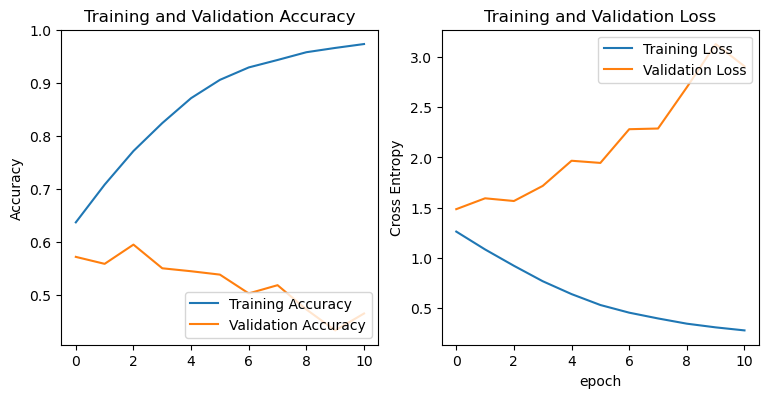

In [46]:
show_history_fit(history_tune)

40/40 [==============================] - 11s 195ms/step - loss: 1.4853 - accuracy: 0.5713
tf.Tensor([0 2 4 ... 4 4 2], shape=(2498,), dtype=int64)
tf.Tensor([2 2 2 ... 4 1 3], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.5263    0.3448    0.4167       203
           1     0.6571    0.2408    0.3525       382
           2     0.7939    0.7075    0.7482      1323
           3     0.4517    0.4209    0.4358       278
           4     0.2706    0.6827    0.3876       312

    accuracy                         0.5717      2498
   macro avg     0.5399    0.4793    0.4681      2498
weighted avg     0.6478    0.5717    0.5809      2498



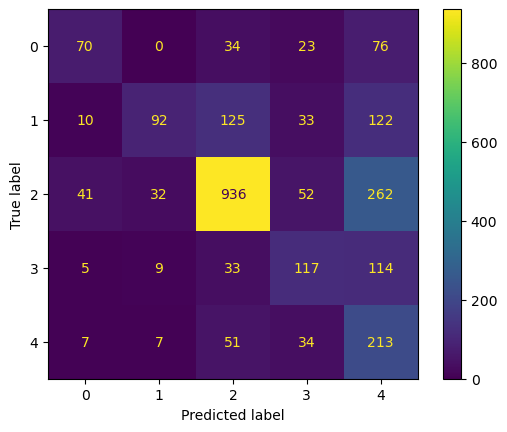

In [47]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

In [65]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_12 (InputLayer)       [(None, 240, 240, 3)]     0         
                                                                 
 tf.math.truediv_3 (TFOpLamb  (None, 240, 240, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_3 (TFOpLam  (None, 240, 240, 3)      0         
 bda)                                                            
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d_7   (None, 1280)             0         
 (GlobalAveragePooling2D)                                  

#### Experiment fine tuninig ---> Block 1

In [20]:
path_model = general_path_models+'/majority_multiclass_models_sc/extra_pretrained_MOBILENETV2_no_tuning_OTHER_LAYERS_dp_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                      

In [21]:
model_finetune.trainable = True

base_model_mobilenet = model_finetune.get_layer("mobilenetv2_1.00_224") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_mobilenet.layers))
base_model_mobilenet.summary()

Number of layers in the base model:  154
Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  
                                )     

In [22]:
set_trainable = False
for layer in base_model_mobilenet.layers:
    if layer.name == ' block_15_expand': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable:
        if layer.name.endswith('BN'): # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
            layer.trainable = False
        else:
            layer.trainable = True
    else:
        layer.trainable = False

model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                      

In [23]:
path_model_tuned = general_path_models+'/majority_multiclass_models_sc/pretrained_MOBILNETV2_FINE_tuning_block1_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
312/313 [============================>.] - ETA: 0s - loss: 0.8836 - accuracy: 0.6516
Epoch 00001: val_loss improved from inf to 1.06091, saving model to ./majority_multiclass_models_sc\pretrained_MOBILNETV2_FINE_tuning_block1_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 45s 136ms/step - loss: 0.8836 - accuracy: 0.6515 - val_loss: 1.0609 - val_accuracy: 0.5904


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


Epoch 2/40
312/313 [============================>.] - ETA: 0s - loss: 0.8816 - accuracy: 0.6523
Epoch 00002: val_loss did not improve from 1.06091
313/313 [==============================] - 44s 138ms/step - loss: 0.8814 - accuracy: 0.6524 - val_loss: 1.0813 - val_accuracy: 0.5681
Epoch 3/40
312/313 [============================>.] - ETA: 0s - loss: 0.8725 - accuracy: 0.6548
Epoch 00003: val_loss did not improve from 1.06091
313/313 [==============================] - 54s 170ms/step - loss: 0.8729 - accuracy: 0.6546 - val_loss: 1.0773 - val_accuracy: 0.5780
Epoch 4/40
312/313 [============================>.] - ETA: 0s - loss: 0.8591 - accuracy: 0.6618
Epoch 00004: val_loss did not improve from 1.06091
313/313 [==============================] - 56s 175ms/step - loss: 0.8589 - accuracy: 0.6618 - val_loss: 1.0804 - val_accuracy: 0.5768
Epoch 5/40
312/313 [============================>.] - ETA: 0s - loss: 0.8439 - accuracy: 0.6650
Epoch 00005: val_loss did not improve from 1.06091
313/313 [=

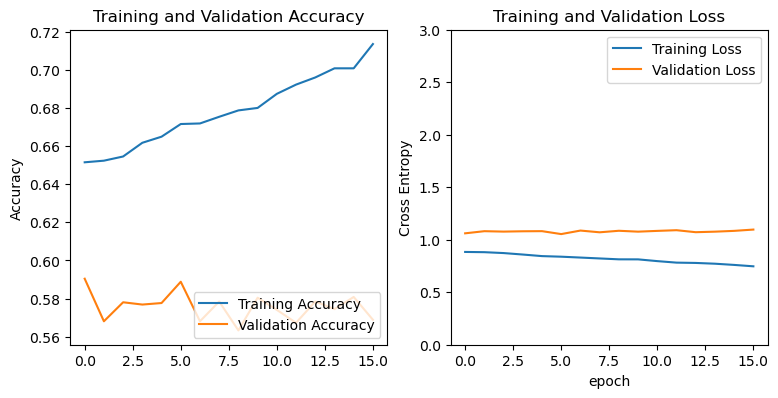

In [24]:
show_history_fit(history_tune)

40/40 [==============================] - 8s 138ms/step - loss: 1.0590 - accuracy: 0.5893
tf.Tensor([2 2 2 ... 2 1 4], shape=(2498,), dtype=int64)
tf.Tensor([2 2 2 ... 2 4 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3665    0.5074    0.4256       203
           1     0.4365    0.3691    0.4000       382
           2     0.7995    0.7143    0.7545      1323
           3     0.4574    0.4640    0.4607       278
           4     0.3558    0.4904    0.4124       312

    accuracy                         0.5889      2498
   macro avg     0.4832    0.5090    0.4906      2498
weighted avg     0.6153    0.5889    0.5981      2498



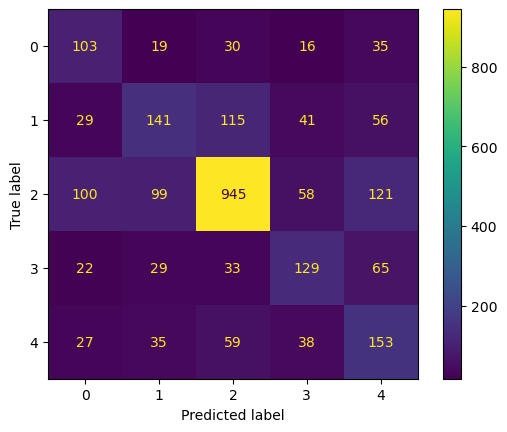

In [25]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment fine tuning ---> Block 2

In [26]:
path_model = general_path_models+'/majority_multiclass_models_sc/extra_pretrained_MOBILENETV2_no_tuning_OTHER_LAYERS_dp_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                      

In [27]:
model_finetune.trainable = True

base_model_mobilenet = model_finetune.get_layer("mobilenetv2_1.00_224") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_mobilenet.layers))
base_model_mobilenet.summary()

Number of layers in the base model:  154
Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  
                                )     

In [28]:
set_trainable = False
for layer in base_model_mobilenet.layers:
    if layer.name == ' block_13_expand': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable:
        if layer.name.endswith('BN'): # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
            layer.trainable = False
        else:
            layer.trainable = True
    else:
        layer.trainable = False

model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                      

In [29]:
path_model_tuned = general_path_models+'/majority_multiclass_models_sc/pretrained_MOBILNETV2_FINE_tuning_block2_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
312/313 [============================>.] - ETA: 0s - loss: 0.8880 - accuracy: 0.6478
Epoch 00001: val_loss improved from inf to 1.08146, saving model to ./majority_multiclass_models_sc\pretrained_MOBILNETV2_FINE_tuning_block2_dp_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


313/313 [==============================] - 58s 175ms/step - loss: 0.8880 - accuracy: 0.6479 - val_loss: 1.0815 - val_accuracy: 0.5673
Epoch 2/40
312/313 [============================>.] - ETA: 0s - loss: 0.8752 - accuracy: 0.6531
Epoch 00002: val_loss improved from 1.08146 to 1.07866, saving model to ./majority_multiclass_models_sc\pretrained_MOBILNETV2_FINE_tuning_block2_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 56s 176ms/step - loss: 0.8751 - accuracy: 0.6531 - val_loss: 1.0787 - val_accuracy: 0.5689
Epoch 3/40
312/313 [============================>.] - ETA: 0s - loss: 0.8698 - accuracy: 0.6593
Epoch 00003: val_loss did not improve from 1.07866
313/313 [==============================] - 56s 174ms/step - loss: 0.8698 - accuracy: 0.6593 - val_loss: 1.0793 - val_accuracy: 0.5733
Epoch 4/40
312/313 [============================>.] - ETA: 0s - loss: 0.8643 - accuracy: 0.6543
Epoch 00004: val_loss improved from 1.07866 to 1.07582, saving model to ./majority_multic

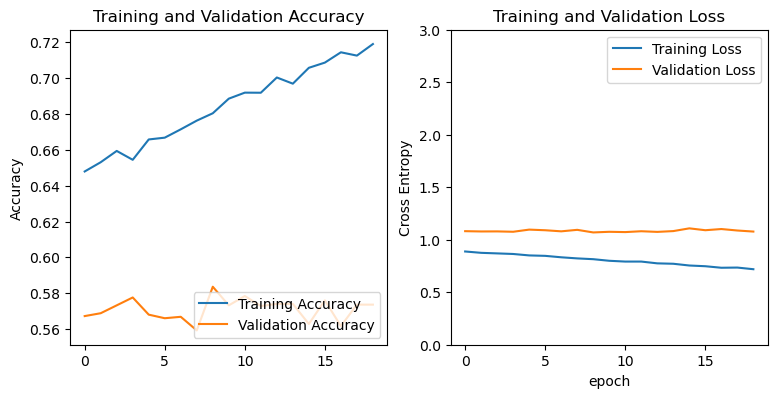

In [30]:
show_history_fit(history_tune)

40/40 [==============================] - 8s 136ms/step - loss: 1.0743 - accuracy: 0.5873
tf.Tensor([3 3 2 ... 2 2 4], shape=(2498,), dtype=int64)
tf.Tensor([4 4 2 ... 2 2 4], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3583    0.5419    0.4314       203
           1     0.4714    0.3665    0.4124       382
           2     0.8157    0.6992    0.7530      1323
           3     0.4128    0.5108    0.4566       278
           4     0.3606    0.4808    0.4121       312

    accuracy                         0.5873      2498
   macro avg     0.4838    0.5198    0.4931      2498
weighted avg     0.6242    0.5873    0.5992      2498



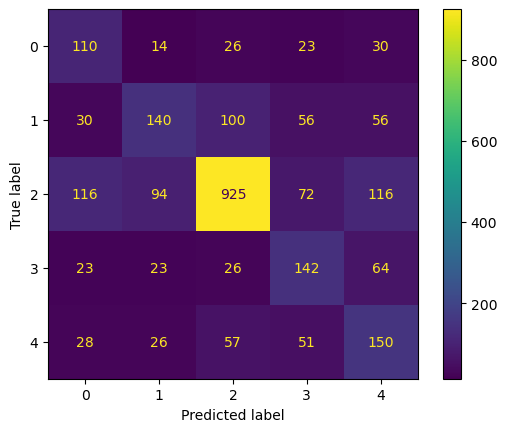

In [31]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment fine tuning ---> Block 3

In [32]:
path_model = general_path_models+'/majority_multiclass_models_sc/extra_pretrained_MOBILENETV2_no_tuning_OTHER_LAYERS_dp_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                      

In [33]:
model_finetune.trainable = True

base_model_mobilenet = model_finetune.get_layer("mobilenetv2_1.00_224") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_mobilenet.layers))
base_model_mobilenet.summary()

Number of layers in the base model:  154
Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  
                                )     

In [34]:
set_trainable = False
for layer in base_model_mobilenet.layers:
    if layer.name == ' block_10_expand': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable:
        if layer.name.endswith('BN'): # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
            layer.trainable = False
        else:
            layer.trainable = True
    else:
        layer.trainable = False

model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                      

In [35]:
path_model_tuned = general_path_models+'/majority_multiclass_models_sc/pretrained_MOBILNETV2_FINE_tuning_block3_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,40,10)

Epoch 1/40
312/313 [============================>.] - ETA: 0s - loss: 0.8909 - accuracy: 0.6496
Epoch 00001: val_loss improved from inf to 1.06675, saving model to ./majority_multiclass_models_sc\pretrained_MOBILNETV2_FINE_tuning_block3_dp_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


313/313 [==============================] - 58s 178ms/step - loss: 0.8906 - accuracy: 0.6498 - val_loss: 1.0667 - val_accuracy: 0.5792
Epoch 2/40
312/313 [============================>.] - ETA: 0s - loss: 0.8770 - accuracy: 0.6550
Epoch 00002: val_loss did not improve from 1.06675
313/313 [==============================] - 57s 177ms/step - loss: 0.8768 - accuracy: 0.6551 - val_loss: 1.0676 - val_accuracy: 0.5812
Epoch 3/40
312/313 [============================>.] - ETA: 0s - loss: 0.8665 - accuracy: 0.6606
Epoch 00003: val_loss improved from 1.06675 to 1.06649, saving model to ./majority_multiclass_models_sc\pretrained_MOBILNETV2_FINE_tuning_block3_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 57s 179ms/step - loss: 0.8665 - accuracy: 0.6605 - val_loss: 1.0665 - val_accuracy: 0.5772
Epoch 4/40
312/313 [============================>.] - ETA: 0s - loss: 0.8607 - accuracy: 0.6629
Epoch 00004: val_loss did not improve from 1.06649
313/313 [=============================

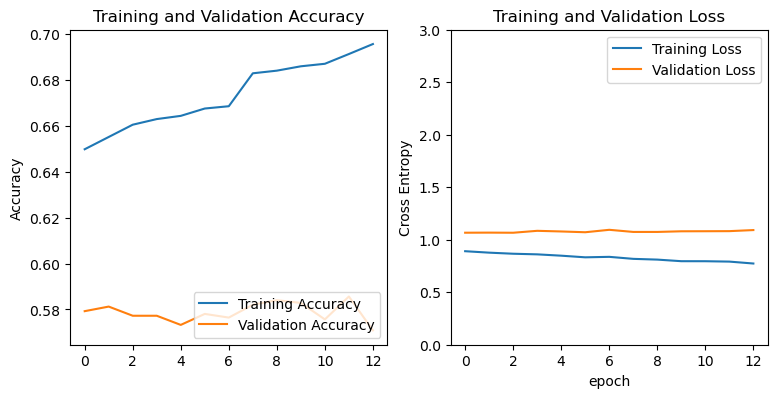

In [36]:
show_history_fit(history_tune)

40/40 [==============================] - 8s 144ms/step - loss: 1.0800 - accuracy: 0.5929
tf.Tensor([2 2 1 ... 3 4 2], shape=(2498,), dtype=int64)
tf.Tensor([2 2 4 ... 1 1 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3442    0.5714    0.4296       203
           1     0.4611    0.4188    0.4390       382
           2     0.8184    0.6984    0.7537      1323
           3     0.4770    0.4856    0.4813       278
           4     0.3607    0.4647    0.4062       312

    accuracy                         0.5925      2498
   macro avg     0.4923    0.5278    0.5019      2498
weighted avg     0.6301    0.5925    0.6055      2498



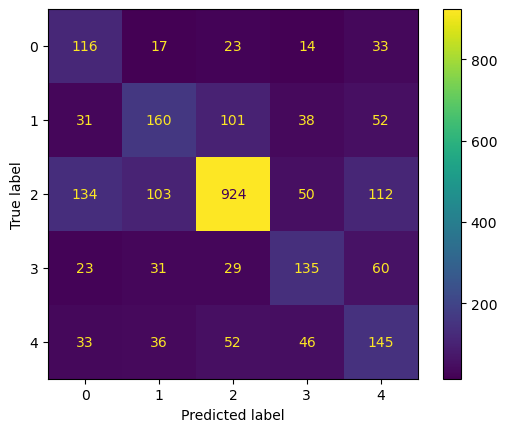

In [37]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment Remove some layer ---> Block 1

In [66]:
base_model = tf.keras.applications.mobilenet_v2.MobileNetV2(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_12 (InputLayer)          [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_12[0][0]']               
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  
                                )                                              

In [67]:
index = 0
for i, layer in enumerate(base_model.layers):
    if layer.name == "block_12_add": #block_8_add
        index = i
        break

base_model_cutted = tf.keras.Model(base_model.input, base_model.layers[index].output, name='mobilenet_cut')

base_model_cutted.summary()

Model: "mobilenet_cut"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_12 (InputLayer)          [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_12[0][0]']               
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  
                                )                                                     

In [68]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
x = base_model_cutted(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [69]:
LR = 0.0002
compile_model(model, 'adam', LR)

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_13 (InputLayer)       [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv_5 (TFOpLamb  (None, 250, 250, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_5 (TFOpLam  (None, 250, 250, 3)      0         
 bda)                                                            
                                                                 
 mobilenet_cut (Functional)  (None, 16, 16, 96)        558656    
                                                                 
 global_average_pooling2d_5   (None, 96)               0         
 (GlobalAveragePooling2D)                                        
                                                           

In [70]:
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_REMOVE_LAYER_block12add_mobilenet_no_tuning_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
312/313 [============================>.] - ETA: 0s - loss: 1.3829 - accuracy: 0.4204
Epoch 00001: val_loss improved from inf to 1.21493, saving model to ./majority_multiclass_models_sc\pretrained_REMOVE_LAYER_block12add_mobilenet_no_tuning_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 45s 136ms/step - loss: 1.3826 - accuracy: 0.4205 - val_loss: 1.2149 - val_accuracy: 0.5190
Epoch 2/40


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


312/313 [============================>.] - ETA: 0s - loss: 1.2684 - accuracy: 0.4760
Epoch 00002: val_loss improved from 1.21493 to 1.20165, saving model to ./majority_multiclass_models_sc\pretrained_REMOVE_LAYER_block12add_mobilenet_no_tuning_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 43s 135ms/step - loss: 1.2685 - accuracy: 0.4758 - val_loss: 1.2017 - val_accuracy: 0.5253
Epoch 3/40
312/313 [============================>.] - ETA: 0s - loss: 1.2343 - accuracy: 0.4958
Epoch 00003: val_loss improved from 1.20165 to 1.17079, saving model to ./majority_multiclass_models_sc\pretrained_REMOVE_LAYER_block12add_mobilenet_no_tuning_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 43s 136ms/step - loss: 1.2345 - accuracy: 0.4958 - val_loss: 1.1708 - val_accuracy: 0.5377
Epoch 4/40
312/313 [============================>.] - ETA: 0s - loss: 1.2102 - accuracy: 0.5069
Epoch 00004: val_loss improved from 1.17079 to 1.16405, saving model to ./majority_mult

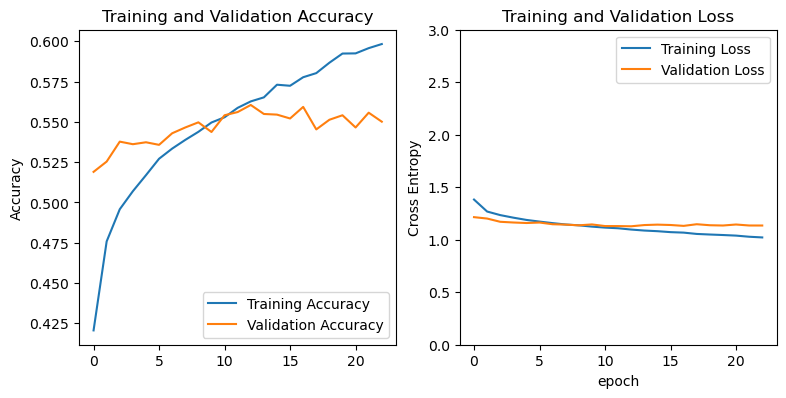

In [71]:
show_history_fit(history)

40/40 [==============================] - 6s 112ms/step - loss: 1.1312 - accuracy: 0.5580
tf.Tensor([0 2 1 ... 2 3 2], shape=(2498,), dtype=int64)
tf.Tensor([2 4 1 ... 2 2 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3521    0.5862    0.4399       203
           1     0.4394    0.4267    0.4329       382
           2     0.8130    0.6410    0.7168      1323
           3     0.4083    0.5288    0.4608       278
           4     0.3031    0.3750    0.3352       312

    accuracy                         0.5580      2498
   macro avg     0.4632    0.5115    0.4771      2498
weighted avg     0.6097    0.5580    0.5748      2498



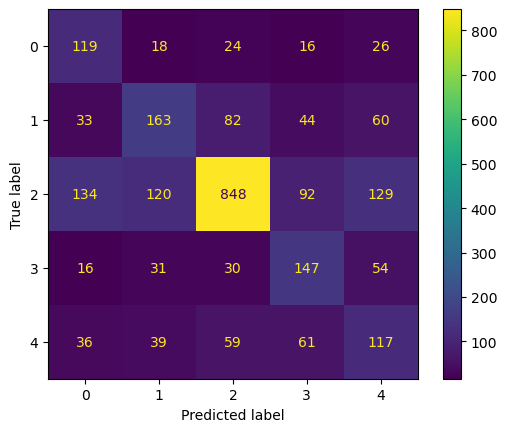

In [72]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Remove some layer ----> Block 2

In [73]:
base_model = tf.keras.applications.mobilenet_v2.MobileNetV2(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False

base_model.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_14 (InputLayer)          [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_14[0][0]']               
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  
                                )                                              

In [74]:
index = 0
for i, layer in enumerate(base_model.layers):
    if layer.name == "block_8_add":
        index = i
        break

base_model_cutted = tf.keras.Model(base_model.input, base_model.layers[index].output, name='mobilenet_cut')

base_model_cutted.summary()

Model: "mobilenet_cut"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_14 (InputLayer)          [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_14[0][0]']               
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  
                                )                                                     

In [75]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
x = base_model_cutted(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [76]:
LR = 0.0002
compile_model(model, 'adam', LR)

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_15 (InputLayer)       [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv_6 (TFOpLamb  (None, 250, 250, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_6 (TFOpLam  (None, 250, 250, 3)      0         
 bda)                                                            
                                                                 
 mobilenet_cut (Functional)  (None, 16, 16, 64)        192832    
                                                                 
 global_average_pooling2d_6   (None, 64)               0         
 (GlobalAveragePooling2D)                                        
                                                           

In [77]:
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_REMOVE_LAYER_block8add_mobilenet_no_tuning_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
312/313 [============================>.] - ETA: 0s - loss: 1.4432 - accuracy: 0.3938
Epoch 00001: val_loss improved from inf to 1.28911, saving model to ./majority_multiclass_models_sc\pretrained_REMOVE_LAYER_block8add_mobilenet_no_tuning_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 45s 138ms/step - loss: 1.4435 - accuracy: 0.3938 - val_loss: 1.2891 - val_accuracy: 0.4870


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


Epoch 2/40
312/313 [============================>.] - ETA: 0s - loss: 1.3484 - accuracy: 0.4428
Epoch 00002: val_loss improved from 1.28911 to 1.25794, saving model to ./majority_multiclass_models_sc\pretrained_REMOVE_LAYER_block8add_mobilenet_no_tuning_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 44s 136ms/step - loss: 1.3484 - accuracy: 0.4426 - val_loss: 1.2579 - val_accuracy: 0.4918
Epoch 3/40
312/313 [============================>.] - ETA: 0s - loss: 1.3059 - accuracy: 0.4595
Epoch 00003: val_loss improved from 1.25794 to 1.24603, saving model to ./majority_multiclass_models_sc\pretrained_REMOVE_LAYER_block8add_mobilenet_no_tuning_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 44s 136ms/step - loss: 1.3055 - accuracy: 0.4597 - val_loss: 1.2460 - val_accuracy: 0.4942
Epoch 4/40
312/313 [============================>.] - ETA: 0s - loss: 1.2846 - accuracy: 0.4707
Epoch 00004: val_loss improved from 1.24603 to 1.22401, saving model to ./majo

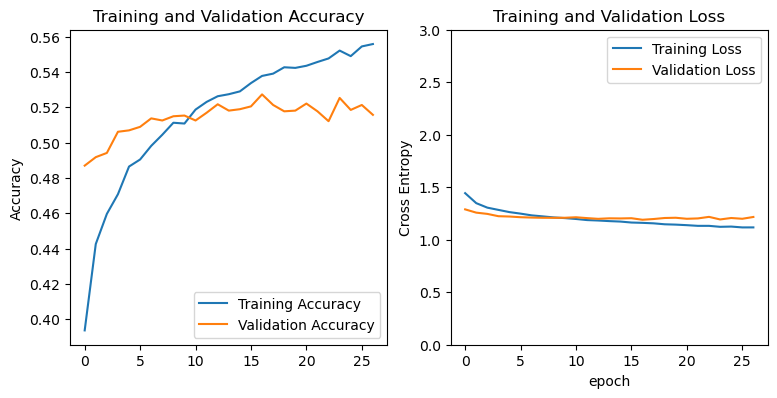

In [78]:
show_history_fit(history)

40/40 [==============================] - 6s 111ms/step - loss: 1.1987 - accuracy: 0.5176
tf.Tensor([4 1 2 ... 4 3 1], shape=(2498,), dtype=int64)
tf.Tensor([1 1 2 ... 2 4 4], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3036    0.5369    0.3879       203
           1     0.3711    0.3691    0.3701       382
           2     0.8032    0.6077    0.6919      1323
           3     0.3592    0.5000    0.4180       278
           4     0.2668    0.3173    0.2899       312

    accuracy                         0.5172      2498
   macro avg     0.4208    0.4662    0.4316      2498
weighted avg     0.5801    0.5172    0.5373      2498



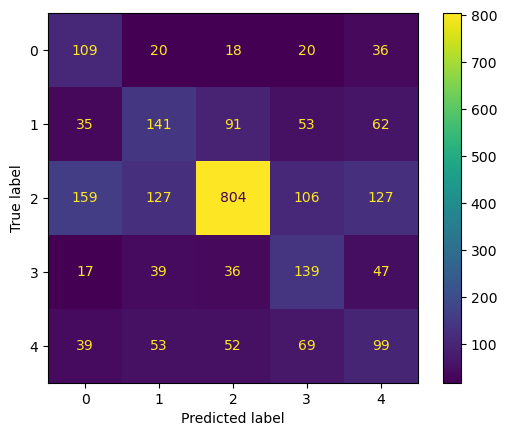

In [79]:
load_best_model_and_evaluate(path_model, test_ds)

### XCEPTION

#### Experiment Features Extraction --> add one layer

In [31]:
base_model = tf.keras.applications.xception.Xception(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)

base_model.trainable = False

print('Number of layers Xception: ', len(base_model.layers))
base_model.summary()

Number of layers Xception:  132
Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 240, 240, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 119, 119, 32  864         ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 119, 119, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                          

In [32]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.xception.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1664)(x)
x = layers.Dropout(0.4)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

model.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 240, 240, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 240, 240, 3)      0         
 a)                                                              
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d_4   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [33]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 240, 240, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 240, 240, 3)      0         
 a)                                                              
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d_4   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [35]:
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,60,20)

Epoch 1/60
313/313 [==============================] - ETA: 0s - loss: 1.3153 - accuracy: 0.4711
Epoch 00001: val_loss improved from inf to 1.26295, saving model to ./majority_multiclass_models_sc\pretrained_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


313/313 [==============================] - 71s 224ms/step - loss: 1.3153 - accuracy: 0.4711 - val_loss: 1.2629 - val_accuracy: 0.5066
Epoch 2/60
313/313 [==============================] - ETA: 0s - loss: 1.2155 - accuracy: 0.5137
Epoch 00002: val_loss improved from 1.26295 to 1.15142, saving model to ./majority_multiclass_models_sc\pretrained_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 72s 226ms/step - loss: 1.2155 - accuracy: 0.5137 - val_loss: 1.1514 - val_accuracy: 0.5485
Epoch 3/60
313/313 [==============================] - ETA: 0s - loss: 1.1756 - accuracy: 0.5329
Epoch 00003: val_loss improved from 1.15142 to 1.12043, saving model to ./majority_multiclass_models_sc\pretrained_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 79s 243ms/step - loss: 1.1756 - accuracy: 0.5329 - val_loss: 1.1204 - val_accuracy: 0.5617
Epoch 4/60
313/313 [==============================] - ETA: 0s - loss: 1.1419 - a

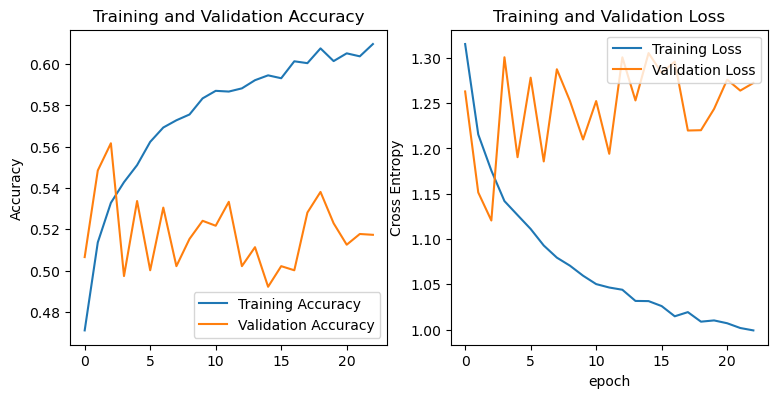

In [36]:
show_history_fit(history)

40/40 [==============================] - 9s 186ms/step - loss: 1.1010 - accuracy: 0.5705
tf.Tensor([0 2 2 ... 4 2 2], shape=(2498,), dtype=int64)
tf.Tensor([2 2 2 ... 4 1 3], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3355    0.5025    0.4024       203
           1     0.3975    0.5079    0.4460       382
           2     0.7863    0.7007    0.7410      1323
           3     0.3706    0.4173    0.3926       278
           4     0.4019    0.2756    0.3270       312

    accuracy                         0.5705      2498
   macro avg     0.4584    0.4808    0.4618      2498
weighted avg     0.5959    0.5705    0.5779      2498



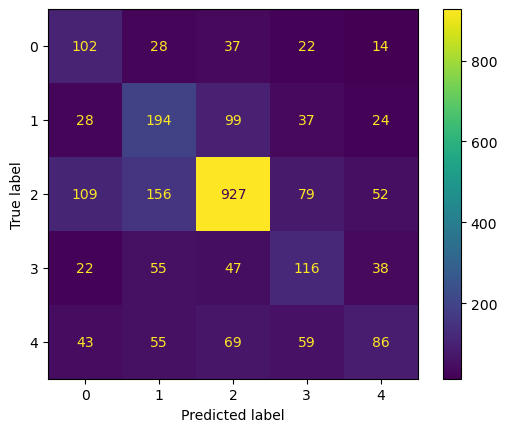

In [37]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Features Extraction ---> add two layers

In [37]:
base_model = tf.keras.applications.xception.Xception(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)

base_model.trainable = False

print('Number of layers Xception: ', len(base_model.layers))
base_model.summary()

Number of layers Xception:  132
Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 124, 124, 32  864         ['input_7[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 124, 124, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                          

In [38]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.xception.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024)(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512)(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

model.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d_6   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [39]:
LR = 0.0001
compile_model(model, 'rmsprop', LR)

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d_6   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [40]:
path_model = general_path_models+'/extra_majority_multiclass_models_sc/pretrained_extra_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,50,10)

Epoch 1/50
313/313 [==============================] - ETA: 0s - loss: 1.4195 - accuracy: 0.4342
Epoch 00001: val_loss improved from inf to 1.32314, saving model to ./extra_majority_multiclass_models_sc\pretrained_extra_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 74s 226ms/step - loss: 1.4195 - accuracy: 0.4342 - val_loss: 1.3231 - val_accuracy: 0.4962


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


Epoch 2/50
313/313 [==============================] - ETA: 0s - loss: 1.2886 - accuracy: 0.4855
Epoch 00002: val_loss improved from 1.32314 to 1.21757, saving model to ./extra_majority_multiclass_models_sc\pretrained_extra_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 70s 221ms/step - loss: 1.2886 - accuracy: 0.4855 - val_loss: 1.2176 - val_accuracy: 0.5122
Epoch 3/50
313/313 [==============================] - ETA: 0s - loss: 1.2576 - accuracy: 0.5017
Epoch 00003: val_loss did not improve from 1.21757
313/313 [==============================] - 70s 220ms/step - loss: 1.2576 - accuracy: 0.5017 - val_loss: 1.2704 - val_accuracy: 0.5082
Epoch 4/50
313/313 [==============================] - ETA: 0s - loss: 1.2287 - accuracy: 0.5156
Epoch 00004: val_loss improved from 1.21757 to 1.16976, saving model to ./extra_majority_multiclass_models_sc\pretrained_extra_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 

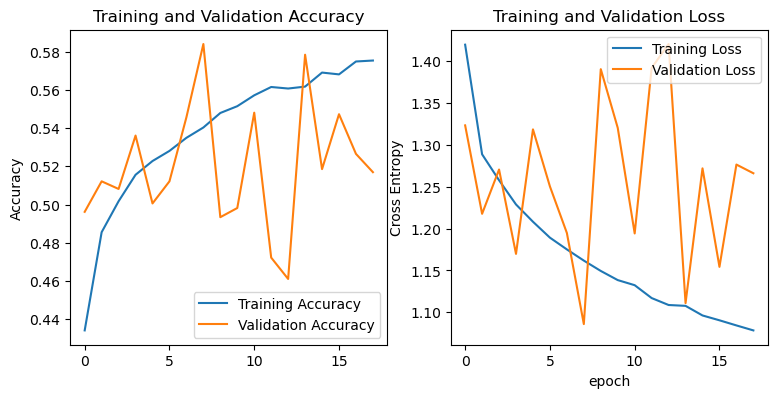

In [41]:
show_history_fit(history)

40/40 [==============================] - 10s 193ms/step - loss: 1.0680 - accuracy: 0.5889
tf.Tensor([2 2 2 ... 4 2 4], shape=(2498,), dtype=int64)
tf.Tensor([2 2 4 ... 3 2 3], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3182    0.5862    0.4125       203
           1     0.4977    0.2853    0.3627       382
           2     0.7305    0.7868    0.7576      1323
           3     0.4569    0.3813    0.4157       278
           4     0.3871    0.3077    0.3429       312

    accuracy                         0.5889      2498
   macro avg     0.4781    0.4695    0.4583      2498
weighted avg     0.5881    0.5889    0.5793      2498



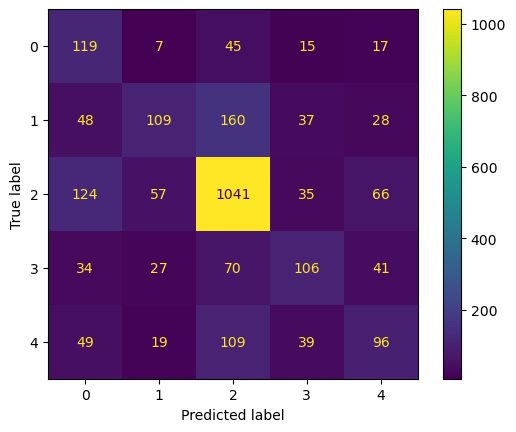

In [42]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Features Extraction --> Add other layers

In [11]:
base_model = tf.keras.applications.xception.Xception(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)

base_model.trainable = False

print('Number of layers Xception: ', len(base_model.layers))
base_model.summary()

Number of layers Xception:  132
Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 124, 124, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 124, 124, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                          

In [12]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dense(256, activation='relu')(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [13]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                             

In [14]:
path_model = general_path_models+'/extra_majority_multiclass_models_sc/pretrained_extra_XCEPTION_no_tuning_OTHER_LAYERS_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,50,10)

Epoch 1/50
313/313 [==============================] - ETA: 0s - loss: 1.4589 - accuracy: 0.3711
Epoch 00001: val_loss improved from inf to 1.21492, saving model to ./extra_majority_multiclass_models_sc\pretrained_extra_XCEPTION_no_tuning_OTHER_LAYERS_dp_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


313/313 [==============================] - 99s 276ms/step - loss: 1.4589 - accuracy: 0.3711 - val_loss: 1.2149 - val_accuracy: 0.5305
Epoch 2/50
313/313 [==============================] - ETA: 0s - loss: 1.3185 - accuracy: 0.4597
Epoch 00002: val_loss improved from 1.21492 to 1.18554, saving model to ./extra_majority_multiclass_models_sc\pretrained_extra_XCEPTION_no_tuning_OTHER_LAYERS_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 85s 267ms/step - loss: 1.3185 - accuracy: 0.4597 - val_loss: 1.1855 - val_accuracy: 0.5381
Epoch 3/50
313/313 [==============================] - ETA: 0s - loss: 1.2782 - accuracy: 0.4811
Epoch 00003: val_loss improved from 1.18554 to 1.16481, saving model to ./extra_majority_multiclass_models_sc\pretrained_extra_XCEPTION_no_tuning_OTHER_LAYERS_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 87s 273ms/step - loss: 1.2782 - accuracy: 0.4811 - val_loss: 1.1648 - val_accuracy: 0.5497
Epoch 4/50
313/313 [==================

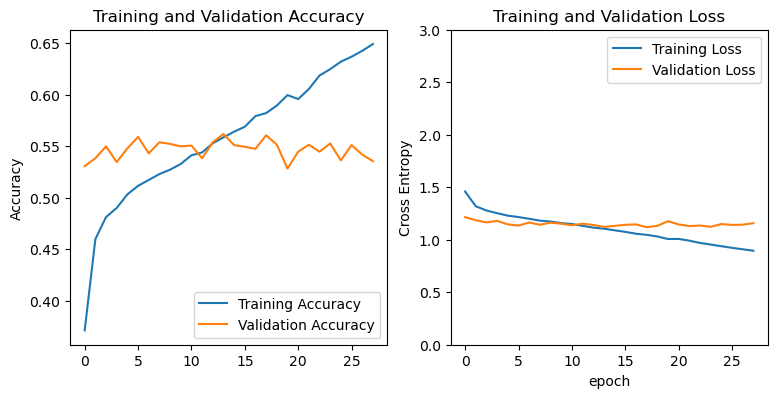

In [15]:
show_history_fit(history)

40/40 [==============================] - 10s 202ms/step - loss: 1.1031 - accuracy: 0.5616
tf.Tensor([1 2 3 ... 3 2 2], shape=(2498,), dtype=int64)
tf.Tensor([4 2 3 ... 3 2 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3261    0.5172    0.4000       203
           1     0.4435    0.4215    0.4322       382
           2     0.8197    0.6531    0.7270      1323
           3     0.4172    0.4353    0.4261       278
           4     0.3241    0.4872    0.3892       312

    accuracy                         0.5616      2498
   macro avg     0.4661    0.5028    0.4749      2498
weighted avg     0.6154    0.5616    0.5797      2498



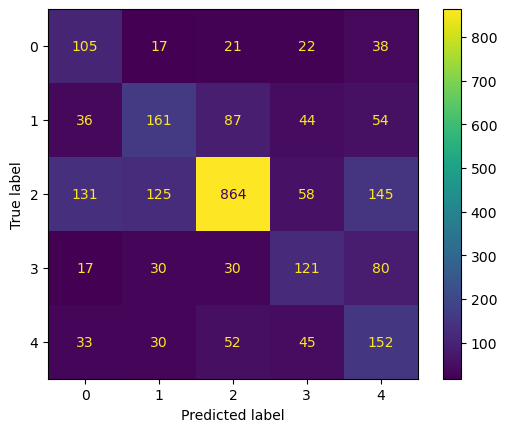

In [16]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Fine Tuning --> Block 1

In [17]:
LR = 0.0001
path_model = general_path_models+'/extra_majority_multiclass_models_sc/pretrained_extra_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5'#general_path_models+'/majority_multiclass_models_sc/pretrained_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d_6   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [18]:
model_finetune.trainable = True

base_model_xception = model_finetune.get_layer("xception") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_xception.layers))
base_model_xception.summary()

Number of layers in the base model:  132
Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 124, 124, 32  864         ['input_7[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 124, 124, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                 

In [19]:
set_trainable = False
for layer in base_model_xception.layers:
    if layer.name == ' block12_sepconv12_act': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable:
        if layer.name.endswith('bn'): # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
            layer.trainable = False
        else:
            layer.trainable = True
    else:
        layer.trainable = False

model_finetune.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d_6   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [20]:
path_model_tuned = general_path_models+'/majority_multiclass_models_sc/pretrained_XCEPTION_FINE_tuning_block12_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,50,15)

Epoch 1/50
313/313 [==============================] - ETA: 0s - loss: 1.1485 - accuracy: 0.5487
Epoch 00001: val_loss improved from inf to 1.28943, saving model to ./majority_multiclass_models_sc\pretrained_XCEPTION_FINE_tuning_block12_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


313/313 [==============================] - 76s 237ms/step - loss: 1.1485 - accuracy: 0.5487 - val_loss: 1.2894 - val_accuracy: 0.4942
Epoch 2/50
313/313 [==============================] - ETA: 0s - loss: 1.1371 - accuracy: 0.5531
Epoch 00002: val_loss improved from 1.28943 to 1.28797, saving model to ./majority_multiclass_models_sc\pretrained_XCEPTION_FINE_tuning_block12_epoch_40_adam_1e-4.h5
313/313 [==============================] - 73s 231ms/step - loss: 1.1371 - accuracy: 0.5531 - val_loss: 1.2880 - val_accuracy: 0.5082
Epoch 3/50
313/313 [==============================] - ETA: 0s - loss: 1.1257 - accuracy: 0.5551
Epoch 00003: val_loss improved from 1.28797 to 1.20815, saving model to ./majority_multiclass_models_sc\pretrained_XCEPTION_FINE_tuning_block12_epoch_40_adam_1e-4.h5
313/313 [==============================] - 73s 231ms/step - loss: 1.1257 - accuracy: 0.5551 - val_loss: 1.2081 - val_accuracy: 0.5250
Epoch 4/50
313/313 [==============================] - ETA: 0s - loss: 1.11

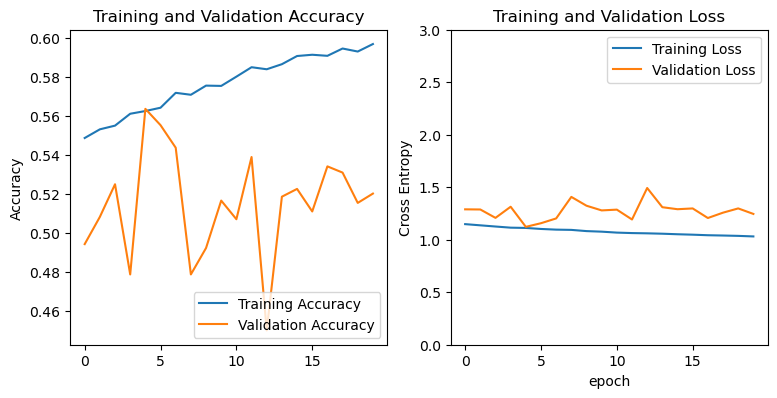

In [21]:
show_history_fit(history_tune)

40/40 [==============================] - 10s 193ms/step - loss: 1.0680 - accuracy: 0.5889
tf.Tensor([2 2 2 ... 2 0 0], shape=(2498,), dtype=int64)
tf.Tensor([2 2 2 ... 2 4 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3182    0.5862    0.4125       203
           1     0.4977    0.2853    0.3627       382
           2     0.7305    0.7868    0.7576      1323
           3     0.4569    0.3813    0.4157       278
           4     0.3871    0.3077    0.3429       312

    accuracy                         0.5889      2498
   macro avg     0.4781    0.4695    0.4583      2498
weighted avg     0.5881    0.5889    0.5793      2498



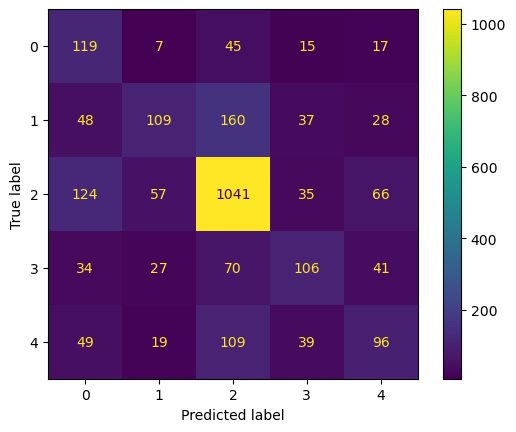

In [22]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Fine Tuning --> Block 2

In [23]:
LR = 0.0001
path_model = general_path_models+'/extra_majority_multiclass_models_sc/pretrained_extra_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5' #general_path_models+'/majority_multiclass_models_sc/pretrained_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d_6   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [24]:
model_finetune.trainable = True

base_model_xception = model_finetune.get_layer("xception") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_xception.layers))
base_model_xception.summary()

Number of layers in the base model:  132
Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 124, 124, 32  864         ['input_7[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 124, 124, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                 

In [25]:
set_trainable = False
for layer in base_model_xception.layers:
    if layer.name == ' block9_sepconv1_act': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable:
        if layer.name.endswith('bn'): # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
            layer.trainable = False
        else:
            layer.trainable = True
    else:
        layer.trainable = False

model_finetune.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d_6   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [26]:
path_model_tuned = general_path_models+'/majority_multiclass_models_sc/pretrained_XCEPTION_FINE_tuning_block9_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,50,15)

Epoch 1/50
313/313 [==============================] - ETA: 0s - loss: 1.1510 - accuracy: 0.5446
Epoch 00001: val_loss improved from inf to 1.38943, saving model to ./majority_multiclass_models_sc\pretrained_XCEPTION_FINE_tuning_block9_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


313/313 [==============================] - 74s 232ms/step - loss: 1.1510 - accuracy: 0.5446 - val_loss: 1.3894 - val_accuracy: 0.4615
Epoch 2/50
313/313 [==============================] - ETA: 0s - loss: 1.1387 - accuracy: 0.5523
Epoch 00002: val_loss improved from 1.38943 to 1.14277, saving model to ./majority_multiclass_models_sc\pretrained_XCEPTION_FINE_tuning_block9_epoch_40_adam_1e-4.h5
313/313 [==============================] - 74s 231ms/step - loss: 1.1387 - accuracy: 0.5523 - val_loss: 1.1428 - val_accuracy: 0.5621
Epoch 3/50
313/313 [==============================] - ETA: 0s - loss: 1.1267 - accuracy: 0.5553
Epoch 00003: val_loss did not improve from 1.14277
313/313 [==============================] - 73s 230ms/step - loss: 1.1267 - accuracy: 0.5553 - val_loss: 1.2689 - val_accuracy: 0.5218
Epoch 4/50
313/313 [==============================] - ETA: 0s - loss: 1.1192 - accuracy: 0.5616
Epoch 00004: val_loss improved from 1.14277 to 1.13432, saving model to ./majority_multiclass_

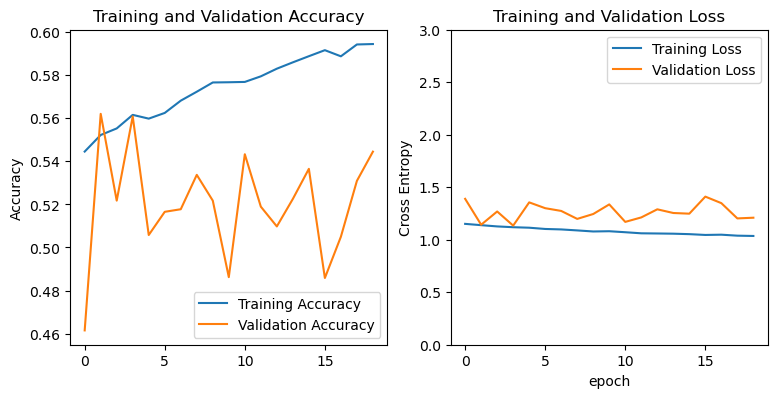

In [27]:
show_history_fit(history_tune)

40/40 [==============================] - 10s 191ms/step - loss: 1.1180 - accuracy: 0.5697
tf.Tensor([1 3 2 ... 2 0 4], shape=(2498,), dtype=int64)
tf.Tensor([4 4 2 ... 2 2 4], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3840    0.4483    0.4136       203
           1     0.4107    0.4215    0.4160       382
           2     0.7979    0.6803    0.7344      1323
           3     0.4695    0.3597    0.4073       278
           4     0.3239    0.5481    0.4071       312

    accuracy                         0.5697      2498
   macro avg     0.4772    0.4916    0.4757      2498
weighted avg     0.6093    0.5697    0.5824      2498



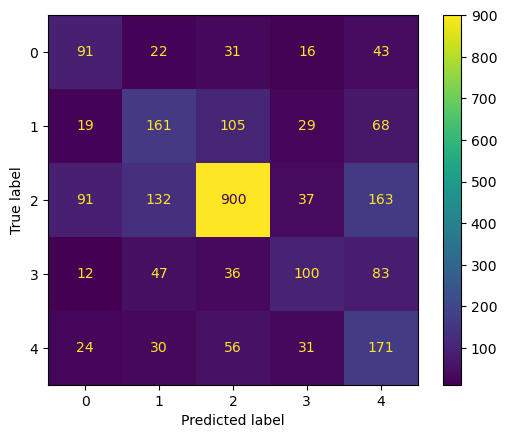

In [28]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment Fine Tuning ---> Block 3

In [29]:
LR = 0.0001
path_model = general_path_models+'/extra_majority_multiclass_models_sc/pretrained_extra_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5' #general_path_models+'/majority_multiclass_models_sc/pretrained_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d_6   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [30]:
model_finetune.trainable = True

base_model_xception = model_finetune.get_layer("xception") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_xception.layers))
base_model_xception.summary()

Number of layers in the base model:  132
Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 124, 124, 32  864         ['input_7[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 124, 124, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                 

In [31]:
set_trainable = False
for layer in base_model_xception.layers:
    if layer.name == ' block9_sepconv6_act': # è buona pratica indicare da dove si parte a sfreezare la rete
        set_trainable = True
    if set_trainable:
        if layer.name.endswith('bn'): # fine a che la variabile booleana è a False allora setto i layer non traininabili altrimenti li setto come trainabili
            layer.trainable = False
        else:
            layer.trainable = True
    else:
        layer.trainable = False

model_finetune.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 250, 250, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 250, 250, 3)      0         
 a)                                                              
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d_6   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [32]:
path_model_tuned = general_path_models+'/majority_multiclass_models_sc/pretrained_XCEPTION_FINE_tuning_block6_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,50,15)

Epoch 1/50
313/313 [==============================] - ETA: 0s - loss: 1.1449 - accuracy: 0.5477
Epoch 00001: val_loss improved from inf to 1.46060, saving model to ./majority_multiclass_models_sc\pretrained_XCEPTION_FINE_tuning_block6_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


313/313 [==============================] - 74s 231ms/step - loss: 1.1449 - accuracy: 0.5477 - val_loss: 1.4606 - val_accuracy: 0.4762
Epoch 2/50
313/313 [==============================] - ETA: 0s - loss: 1.1335 - accuracy: 0.5517
Epoch 00002: val_loss improved from 1.46060 to 1.22404, saving model to ./majority_multiclass_models_sc\pretrained_XCEPTION_FINE_tuning_block6_epoch_40_adam_1e-4.h5
313/313 [==============================] - 73s 230ms/step - loss: 1.1335 - accuracy: 0.5517 - val_loss: 1.2240 - val_accuracy: 0.5385
Epoch 3/50
313/313 [==============================] - ETA: 0s - loss: 1.1290 - accuracy: 0.5538
Epoch 00003: val_loss did not improve from 1.22404
313/313 [==============================] - 73s 229ms/step - loss: 1.1290 - accuracy: 0.5538 - val_loss: 1.2752 - val_accuracy: 0.5122
Epoch 4/50
313/313 [==============================] - ETA: 0s - loss: 1.1196 - accuracy: 0.5619
Epoch 00004: val_loss did not improve from 1.22404
313/313 [==============================] - 

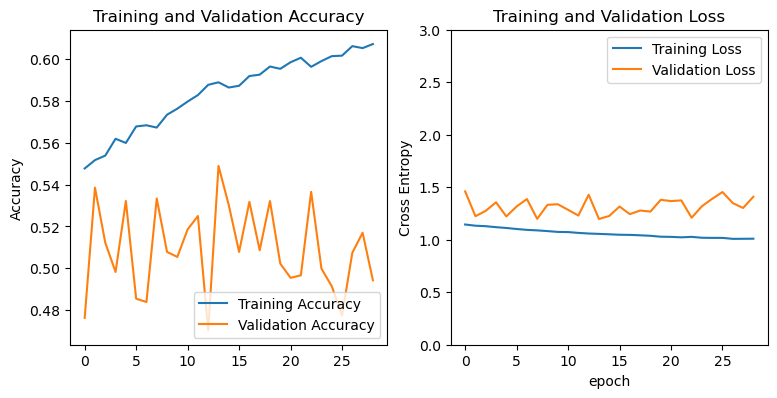

In [33]:
show_history_fit(history_tune)

40/40 [==============================] - 10s 194ms/step - loss: 1.1798 - accuracy: 0.5548
tf.Tensor([2 2 2 ... 2 4 2], shape=(2498,), dtype=int64)
tf.Tensor([2 2 4 ... 1 1 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3411    0.5025    0.4064       203
           1     0.4655    0.2827    0.3518       382
           2     0.7930    0.6659    0.7239      1323
           3     0.4234    0.4173    0.4203       278
           4     0.3076    0.5737    0.4004       312

    accuracy                         0.5548      2498
   macro avg     0.4661    0.4884    0.4606      2498
weighted avg     0.6044    0.5548    0.5670      2498



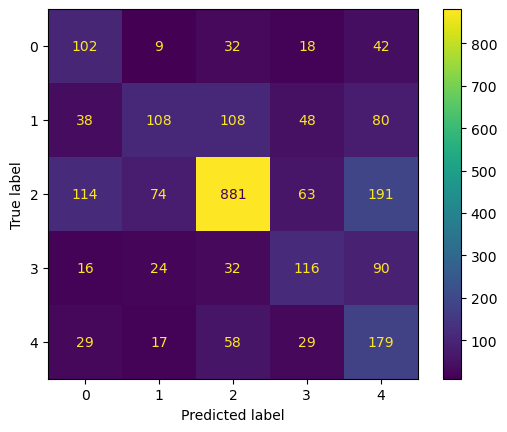

In [34]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

#### Experiment Remove Layers --> Block 1

In [35]:
base_model = tf.keras.applications.xception.Xception(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)

base_model.trainable = False

print('Number of layers Xception: ', len(base_model.layers))
base_model.summary()

Number of layers Xception:  132
Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 124, 124, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 124, 124, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                          

In [36]:
index = 0
for i, layer in enumerate(base_model.layers):
    if layer.name == "block11_sepconv1_act": #block6_sepconv1_act
        index = i
        break

base_model_cutted = tf.keras.Model(base_model.input, base_model.layers[index].output, name='xception_cut')

base_model_cutted.summary()

Model: "xception_cut"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 124, 124, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 124, 124, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                                                      

In [37]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
x = base_model_cutted(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [38]:
LR = 0.0002
compile_model(model, 'adam', LR)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv_1 (TFOpLamb  (None, 250, 250, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_1 (TFOpLam  (None, 250, 250, 3)      0         
 bda)                                                            
                                                                 
 xception_cut (Functional)   (None, 16, 16, 728)       10823688  
                                                                 
 global_average_pooling2d_1   (None, 728)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [39]:
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_REMOVE_LAYER_block11sep_xception_no_tuning_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 1.3958 - accuracy: 0.4151
Epoch 00001: val_loss improved from inf to 1.26773, saving model to ./majority_multiclass_models_sc\pretrained_REMOVE_LAYER_block11sep_xception_no_tuning_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 65s 199ms/step - loss: 1.3958 - accuracy: 0.4151 - val_loss: 1.2677 - val_accuracy: 0.5094


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 1.2659 - accuracy: 0.4818
Epoch 00002: val_loss improved from 1.26773 to 1.09336, saving model to ./majority_multiclass_models_sc\pretrained_REMOVE_LAYER_block11sep_xception_no_tuning_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 61s 191ms/step - loss: 1.2659 - accuracy: 0.4818 - val_loss: 1.0934 - val_accuracy: 0.5772
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 1.2278 - accuracy: 0.5016
Epoch 00003: val_loss did not improve from 1.09336
313/313 [==============================] - 61s 191ms/step - loss: 1.2278 - accuracy: 0.5016 - val_loss: 1.2682 - val_accuracy: 0.5030
Epoch 4/40
313/313 [==============================] - ETA: 0s - loss: 1.2050 - accuracy: 0.5094
Epoch 00004: val_loss did not improve from 1.09336
313/313 [==============================] - 61s 191ms/step - loss: 1.2050 - accuracy: 0.5094 - val_loss: 1.1336 - val_accuracy: 0.5609
Epoch 5/40
313/313 [=====

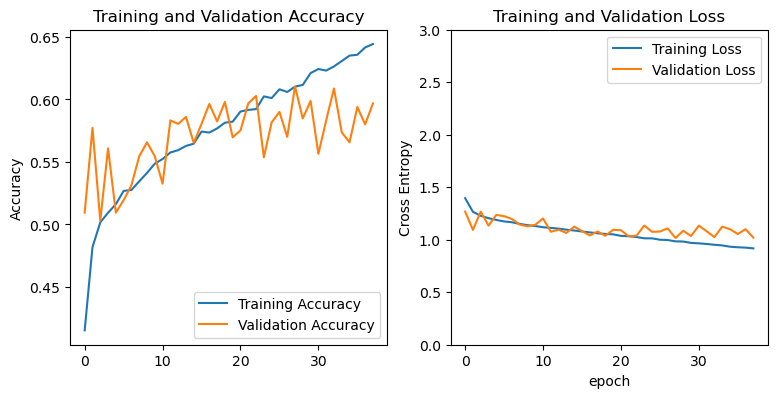

In [40]:
show_history_fit(history)

40/40 [==============================] - 8s 161ms/step - loss: 1.0347 - accuracy: 0.5849
tf.Tensor([0 2 2 ... 2 2 2], shape=(2498,), dtype=int64)
tf.Tensor([2 2 2 ... 4 1 3], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3896    0.4778    0.4292       203
           1     0.4581    0.4293    0.4432       382
           2     0.7941    0.7082    0.7487      1323
           3     0.4027    0.5360    0.4599       278
           4     0.3343    0.3654    0.3492       312

    accuracy                         0.5849      2498
   macro avg     0.4757    0.5033    0.4860      2498
weighted avg     0.6088    0.5849    0.5940      2498



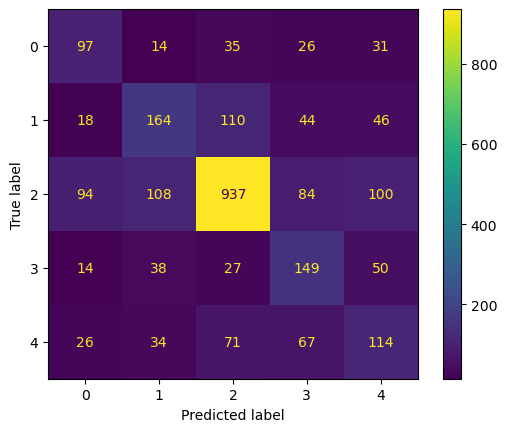

In [41]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment Remove Layers --> Block 2

In [46]:
base_model = tf.keras.applications.xception.Xception(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)

base_model.trainable = False

print('Number of layers Xception: ', len(base_model.layers))
base_model.summary()

Number of layers Xception:  132
Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 124, 124, 32  864         ['input_7[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 124, 124, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                          

In [47]:
index = 0
for i, layer in enumerate(base_model.layers):
    if layer.name == "block6_sepconv1_act":
        index = i
        break

base_model_cutted = tf.keras.Model(base_model.input, base_model.layers[index].output, name='xception_cut')

base_model_cutted.summary()

Model: "xception_cut"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 124, 124, 32  864         ['input_7[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 124, 124, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                                                      

In [48]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
x = base_model_cutted(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

In [49]:
LR = 0.0002
compile_model(model, 'adam', LR)

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv_3 (TFOpLamb  (None, 250, 250, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_3 (TFOpLam  (None, 250, 250, 3)      0         
 bda)                                                            
                                                                 
 xception_cut (Functional)   (None, 16, 16, 728)       2731968   
                                                                 
 global_average_pooling2d_3   (None, 728)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [50]:
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_REMOVE_LAYER_block6sep_xception_no_tuning_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,40,10)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 1.4304 - accuracy: 0.3868
Epoch 00001: val_loss improved from inf to 1.32494, saving model to ./majority_multiclass_models_sc\pretrained_REMOVE_LAYER_block6sep_xception_no_tuning_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 46s 142ms/step - loss: 1.4304 - accuracy: 0.3868 - val_loss: 1.3249 - val_accuracy: 0.4882
Epoch 2/40


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


313/313 [==============================] - ETA: 0s - loss: 1.3455 - accuracy: 0.4412
Epoch 00002: val_loss did not improve from 1.32494
313/313 [==============================] - 46s 145ms/step - loss: 1.3455 - accuracy: 0.4412 - val_loss: 1.3739 - val_accuracy: 0.4431
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 1.3157 - accuracy: 0.4514
Epoch 00003: val_loss improved from 1.32494 to 1.32111, saving model to ./majority_multiclass_models_sc\pretrained_REMOVE_LAYER_block6sep_xception_no_tuning_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 46s 144ms/step - loss: 1.3157 - accuracy: 0.4514 - val_loss: 1.3211 - val_accuracy: 0.4647
Epoch 4/40
313/313 [==============================] - ETA: 0s - loss: 1.2974 - accuracy: 0.4669
Epoch 00004: val_loss improved from 1.32111 to 1.16882, saving model to ./majority_multiclass_models_sc\pretrained_REMOVE_LAYER_block6sep_xception_no_tuning_dp_epoch_40_adam_1e-4.h5
313/313 [==============================]

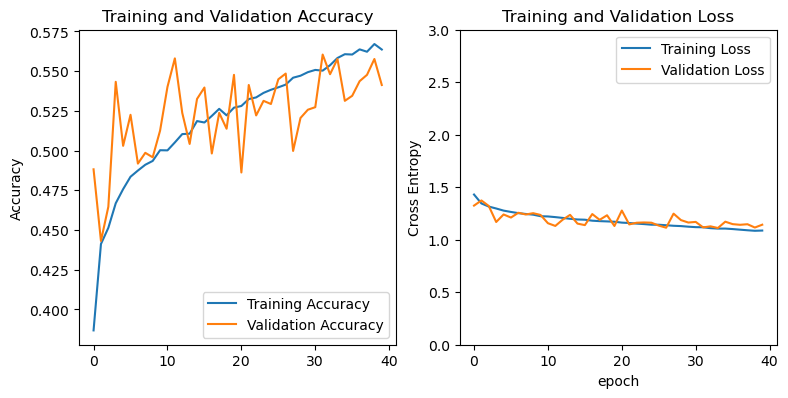

In [51]:
show_history_fit(history)

40/40 [==============================] - 7s 133ms/step - loss: 1.1171 - accuracy: 0.5444
tf.Tensor([4 2 4 ... 2 1 0], shape=(2498,), dtype=int64)
tf.Tensor([3 4 4 ... 2 2 4], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3965    0.4433    0.4186       203
           1     0.3731    0.5236    0.4357       382
           2     0.8204    0.6251    0.7096      1323
           3     0.4714    0.3849    0.4238       278
           4     0.2720    0.4359    0.3350       312

    accuracy                         0.5444      2498
   macro avg     0.4667    0.4826    0.4645      2498
weighted avg     0.6102    0.5444    0.5655      2498



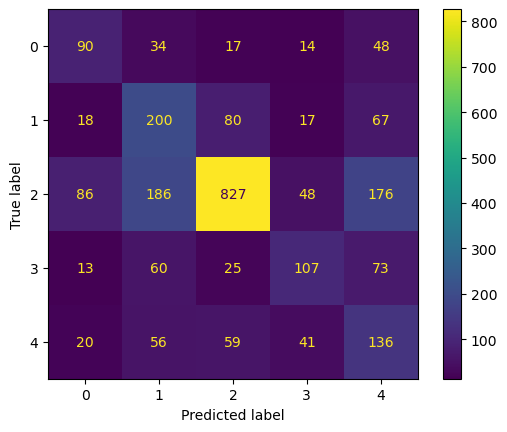

In [52]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment 2 (50.38 dopo 0 epoche)

In [11]:
LR = 0.0001
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_XCEPTION_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 240, 240, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 240, 240, 3)      0         
 a)                                                              
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d_4   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [39]:
model_finetune.trainable = True

base_model_xception = model_finetune.get_layer("xception") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_xception.layers))
base_model_xception.summary()

Number of layers in the base model:  132
Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 240, 240, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 119, 119, 32  864         ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 119, 119, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                 

In [40]:
num_layer_trainable = 102

#start_layer_to_train = len(base_model_resnet50.layers) - num_layer_trainable

for layer in base_model_xception.layers[:num_layer_trainable]:
    #if layer.name.endswith('bn'):
    layer.trainable = False
    #else:
    #    layer.trainable = True

for layer in base_model_xception.layers[num_layer_trainable:]:
    if layer.name.endswith('bn'):
        layer.trainable = False
    else:
        layer.trainable = True


model_finetune.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 240, 240, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 240, 240, 3)      0         
 a)                                                              
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d_4   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [ ]:
compile_model(model_finetune, 'adam', LR)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv_1 (TFOpLamb  (None, 250, 250, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_1 (TFOpLam  (None, 250, 250, 3)      0         
 bda)                                                            
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [42]:
path_model_tuned = general_path_models+'/majority_multiclass_models_sc/pretrained_XCEPTION_FINE_tuning_512_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,60,20)

Epoch 1/60
313/313 [==============================] - ETA: 0s - loss: 1.1388 - accuracy: 0.5461
Epoch 00001: val_loss improved from inf to 1.16917, saving model to ./majority_multiclass_models_sc\pretrained_XCEPTION_FINE_tuning_512_dp_epoch_40_adam_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


313/313 [==============================] - 68s 213ms/step - loss: 1.1388 - accuracy: 0.5461 - val_loss: 1.1692 - val_accuracy: 0.5345
Epoch 2/60
313/313 [==============================] - ETA: 0s - loss: 1.1184 - accuracy: 0.5549
Epoch 00002: val_loss improved from 1.16917 to 1.16461, saving model to ./majority_multiclass_models_sc\pretrained_XCEPTION_FINE_tuning_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 67s 210ms/step - loss: 1.1184 - accuracy: 0.5549 - val_loss: 1.1646 - val_accuracy: 0.5429
Epoch 3/60
313/313 [==============================] - ETA: 0s - loss: 1.0995 - accuracy: 0.5641
Epoch 00003: val_loss did not improve from 1.16461
313/313 [==============================] - 67s 210ms/step - loss: 1.0995 - accuracy: 0.5641 - val_loss: 1.1652 - val_accuracy: 0.5401
Epoch 4/60
313/313 [==============================] - ETA: 0s - loss: 1.0921 - accuracy: 0.5682
Epoch 00004: val_loss did not improve from 1.16461
313/313 [==============================] - 

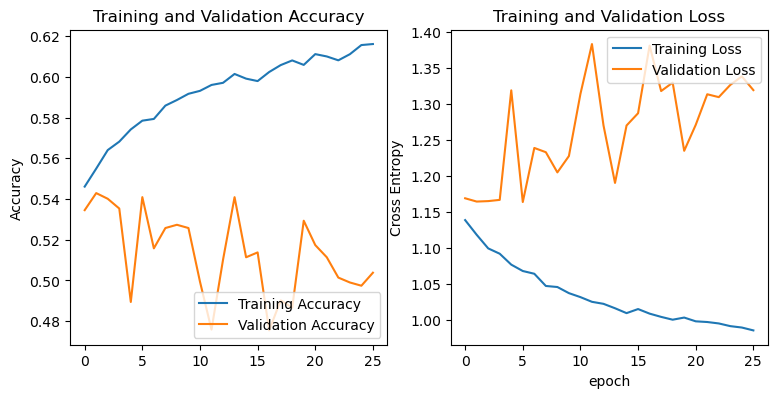

In [43]:
show_history_fit(history_tune)

40/40 [==============================] - 13s 224ms/step - loss: 1.1491 - accuracy: 0.5548
tf.Tensor([3 2 3 ... 2 3 4], shape=(2498,), dtype=int64)
tf.Tensor([3 4 4 ... 2 2 4], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3112    0.5320    0.3927       203
           1     0.4176    0.3979    0.4075       382
           2     0.7943    0.6742    0.7294      1323
           3     0.3581    0.4676    0.4056       278
           4     0.3455    0.3333    0.3393       312

    accuracy                         0.5548      2498
   macro avg     0.4454    0.4810    0.4549      2498
weighted avg     0.5928    0.5548    0.5680      2498



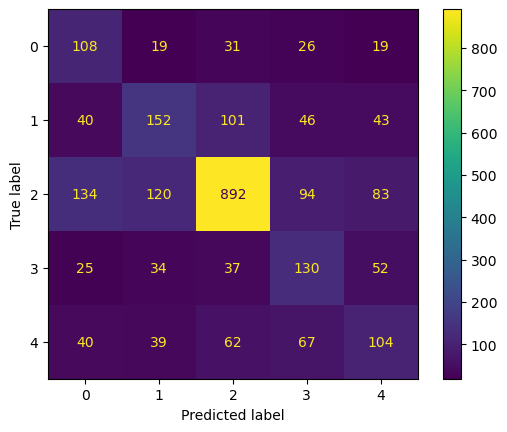

In [44]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

### Extra Pretrained Network

### InceptionV3

#### Experiment 1: (50.92 andamento oscillatorio)

In [51]:
base_model = tf.keras.applications.inception_v3.InceptionV3(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)

base_model.trainable = False

print('Number of layers Xception: ', len(base_model.layers))
base_model.summary()

Number of layers Xception:  311
Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 240, 240, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_124 (Conv2D)            (None, 119, 119, 32  864         ['input_9[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_108 (Batch  (None, 119, 119, 32  96         ['conv2d_124[0][0]']             
 Normalization)                 )                      

In [52]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)
x = tf.keras.applications.inception_v3.preprocess_input(inputs)
x = base_model(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(1024)(x)
x = layers.Dropout(0.4)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

model.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 240, 240, 3)]     0         
                                                                 
 tf.math.truediv_2 (TFOpLamb  (None, 240, 240, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_2 (TFOpLam  (None, 240, 240, 3)      0         
 bda)                                                            
                                                                 
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 global_average_pooling2d_6   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [53]:
LR = 0.0001
compile_model(model, 'adam', LR)

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 240, 240, 3)]     0         
                                                                 
 tf.math.truediv_2 (TFOpLamb  (None, 240, 240, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_2 (TFOpLam  (None, 240, 240, 3)      0         
 bda)                                                            
                                                                 
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 global_average_pooling2d_6   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [54]:
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_INCEPTIONV3_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model,80,40)

Epoch 1/80
313/313 [==============================] - ETA: 0s - loss: 1.9108 - accuracy: 0.3719
Epoch 00001: val_loss improved from inf to 1.21932, saving model to ./majority_multiclass_models_sc\pretrained_INCEPTIONV3_no_tuning_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 47s 139ms/step - loss: 1.9108 - accuracy: 0.3719 - val_loss: 1.2193 - val_accuracy: 0.5250
Epoch 2/80
313/313 [==============================] - ETA: 0s - loss: 1.6514 - accuracy: 0.4252
Epoch 00002: val_loss improved from 1.21932 to 1.14342, saving model to ./majority_multiclass_models_sc\pretrained_INCEPTIONV3_no_tuning_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 45s 142ms/step - loss: 1.6514 - accuracy: 0.4252 - val_loss: 1.1434 - val_accuracy: 0.5561
Epoch 3/80
313/313 [==============================] - ETA: 0s - loss: 1.5928 - accuracy: 0.4324
Epoch 00003: val_loss did not improve from 1.14342
313/313 [==============================] - 43s 135ms/step - loss:

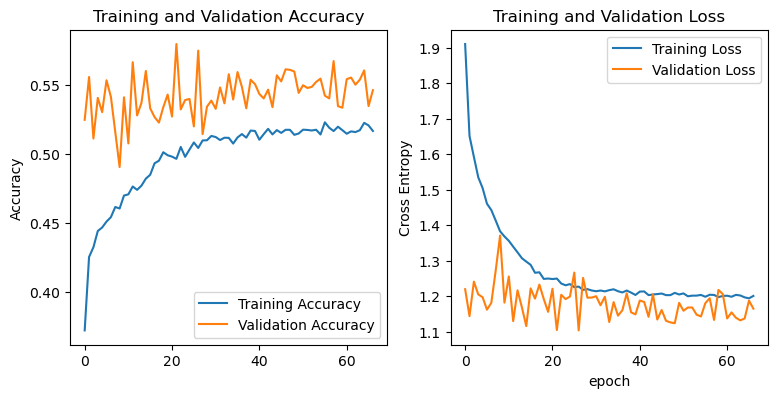

In [55]:
show_history_fit(history)

40/40 [==============================] - 7s 126ms/step - loss: 1.0939 - accuracy: 0.5845
tf.Tensor([1 3 2 ... 2 1 1], shape=(2498,), dtype=int64)
tf.Tensor([2 4 1 ... 2 1 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3302    0.5172    0.4031       203
           1     0.4792    0.4215    0.4485       382
           2     0.8194    0.6961    0.7528      1323
           3     0.5127    0.3633    0.4253       278
           4     0.3289    0.5513    0.4120       312

    accuracy                         0.5845      2498
   macro avg     0.4941    0.5099    0.4883      2498
weighted avg     0.6322    0.5845    0.5988      2498



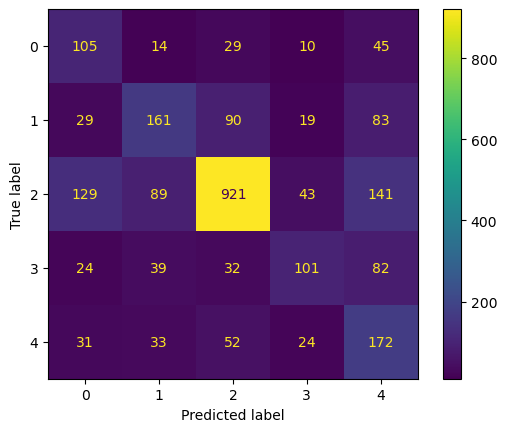

In [56]:
load_best_model_and_evaluate(path_model, test_ds)

#### Experiment 2: 51.75 dopo 15 epoche, oscillatorio

In [57]:
LR = 0.0001
path_model = general_path_models+'/majority_multiclass_models_sc/pretrained_INCEPTIONV3_no_tuning_512_dp_epoch_40_adam_1e-4.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 240, 240, 3)]     0         
                                                                 
 tf.math.truediv_2 (TFOpLamb  (None, 240, 240, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_2 (TFOpLam  (None, 240, 240, 3)      0         
 bda)                                                            
                                                                 
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 global_average_pooling2d_6   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [58]:
model_finetune.trainable = True

base_model_inception_v3 = model_finetune.get_layer("inception_v3") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_inception_v3.layers))
base_model_inception_v3.summary()

Number of layers in the base model:  311
Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 240, 240, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_124 (Conv2D)            (None, 119, 119, 32  864         ['input_9[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_108 (Batch  (None, 119, 119, 32  96         ['conv2d_124[0][0]']             
 Normalization)                 )             

In [59]:
num_layer_trainable = 280

#start_layer_to_train = len(base_model_resnet50.layers) - num_layer_trainable

for layer in base_model_inception_v3.layers[:num_layer_trainable]:
    #if layer.name.endswith('bn'):
    layer.trainable = False
    #else:
    #    layer.trainable = True

for layer in base_model_inception_v3.layers[num_layer_trainable:]:
    if layer.name.endswith('BN'):
        layer.trainable = False
    else:
        layer.trainable = True


model_finetune.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 240, 240, 3)]     0         
                                                                 
 tf.math.truediv_2 (TFOpLamb  (None, 240, 240, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_2 (TFOpLam  (None, 240, 240, 3)      0         
 bda)                                                            
                                                                 
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 global_average_pooling2d_6   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [ ]:
compile_model(model_finetune, 'adam', LR)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 tf.math.truediv_2 (TFOpLamb  (None, 250, 250, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_2 (TFOpLam  (None, 250, 250, 3)      0         
 bda)                                                            
                                                                 
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 global_average_pooling2d_2   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [60]:
path_model_tuned = general_path_models+'/majority_multiclass_models_sc/pretrained_INCEPTIONV3_FINE_tuning_512_dp_epoch_40_adam_1e-4.h5'
history_tune, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned,80,30)

Epoch 1/80
313/313 [==============================] - ETA: 0s - loss: 1.2186 - accuracy: 0.5107
Epoch 00001: val_loss improved from inf to 1.17956, saving model to ./majority_multiclass_models_sc\pretrained_INCEPTIONV3_FINE_tuning_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 68s 210ms/step - loss: 1.2186 - accuracy: 0.5107 - val_loss: 1.1796 - val_accuracy: 0.5425
Epoch 2/80
313/313 [==============================] - ETA: 0s - loss: 1.2209 - accuracy: 0.5074
Epoch 00002: val_loss improved from 1.17956 to 1.16019, saving model to ./majority_multiclass_models_sc\pretrained_INCEPTIONV3_FINE_tuning_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 80s 250ms/step - loss: 1.2209 - accuracy: 0.5074 - val_loss: 1.1602 - val_accuracy: 0.5473
Epoch 3/80
313/313 [==============================] - ETA: 0s - loss: 1.2187 - accuracy: 0.5061
Epoch 00003: val_loss did not improve from 1.16019
313/313 [==============================] - 80s 248ms/step - l

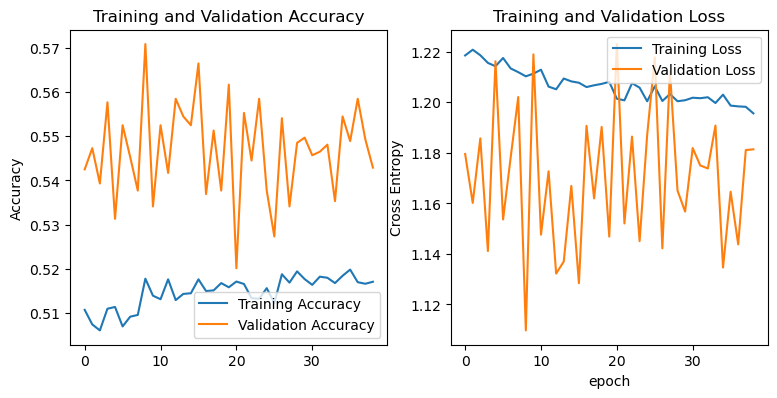

In [61]:
show_history_fit(history_tune)

40/40 [==============================] - 7s 125ms/step - loss: 1.1030 - accuracy: 0.5837
tf.Tensor([0 2 1 ... 2 2 2], shape=(2498,), dtype=int64)
tf.Tensor([2 4 1 ... 2 2 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3712    0.4828    0.4197       203
           1     0.5101    0.3953    0.4454       382
           2     0.8217    0.6969    0.7542      1323
           3     0.3976    0.4748    0.4328       278
           4     0.3202    0.4968    0.3894       312

    accuracy                         0.5837      2498
   macro avg     0.4842    0.5093    0.4883      2498
weighted avg     0.6276    0.5837    0.5985      2498



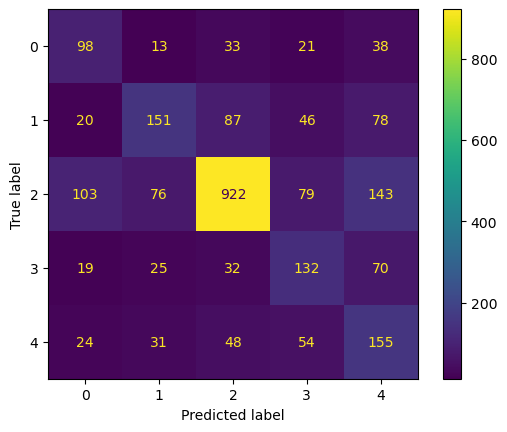

In [62]:
load_best_model_and_evaluate(path_model_tuned, test_ds)

## Trials with data augmentation

In [11]:
data_augmentation = tf.keras.Sequential(
  [
  layers.RandomFlip("horizontal"), # Applies horizontal flipping to a random 50% of the images
  layers.RandomRotation(0.1), # Rotates the input images by a random value in the range[–10%, +10%] (fraction of full circle [-36°, 36°])
  layers.RandomZoom(0.2), # Zooms in or out of the image by a random factor in the range [-20%, +20%]
  layers.RandomContrast(0.5)
  ]
)

### 1

In [75]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = data_augmentation(inputs)
x = layers.Rescaling(1./255)(x)


x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs = output)

In [76]:
compile_model(model, 'adam', 0.0001)

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 250, 250, 3)       0         
                                                                 
 rescaling (Rescaling)       (None, 250, 250, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 124, 124, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 122, 122, 64)      18496     
                                                           

In [77]:
path_model = general_path_models+'/extra_majority_multiclass_models_sc/1_scratch_DATA_AUG_DROP0.4_32_2x256_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, epochs_par=150, patience_par=110)

Epoch 1/150
313/313 [==============================] - ETA: 0s - loss: 1.5869 - accuracy: 0.2526
Epoch 00001: val_loss improved from inf to 1.55552, saving model to ./extra_majority_multiclass_models_sc\1_scratch_DATA_AUG_DROP0.4_32_2x256_epoch_40_adam_1e-4.h5
313/313 [==============================] - 48s 143ms/step - loss: 1.5869 - accuracy: 0.2526 - val_loss: 1.5555 - val_accuracy: 0.2487
Epoch 2/150
313/313 [==============================] - ETA: 0s - loss: 1.5443 - accuracy: 0.3016
Epoch 00002: val_loss improved from 1.55552 to 1.54146, saving model to ./extra_majority_multiclass_models_sc\1_scratch_DATA_AUG_DROP0.4_32_2x256_epoch_40_adam_1e-4.h5
313/313 [==============================] - 46s 142ms/step - loss: 1.5443 - accuracy: 0.3016 - val_loss: 1.5415 - val_accuracy: 0.3050
Epoch 3/150
313/313 [==============================] - ETA: 0s - loss: 1.5217 - accuracy: 0.3214
Epoch 00003: val_loss improved from 1.54146 to 1.43273, saving model to ./extra_majority_multiclass_models_sc

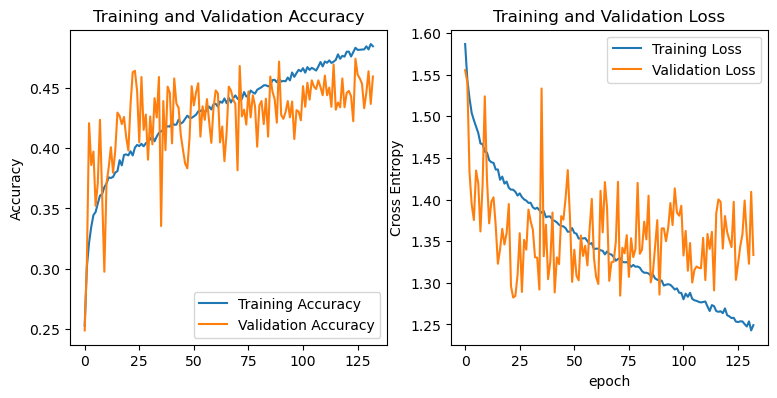

In [78]:
show_history_fit(history)

40/40 [==============================] - 6s 112ms/step - loss: 1.2907 - accuracy: 0.4676
tf.Tensor([4 3 3 ... 2 3 1], shape=(2498,), dtype=int64)
tf.Tensor([1 1 2 ... 2 4 4], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3472    0.3300    0.3384       203
           1     0.2454    0.3874    0.3005       382
           2     0.7374    0.5964    0.6594      1323
           3     0.2485    0.4353    0.3163       278
           4     0.2966    0.1378    0.1882       312

    accuracy                         0.4676      2498
   macro avg     0.3750    0.3774    0.3606      2498
weighted avg     0.5210    0.4676    0.4814      2498



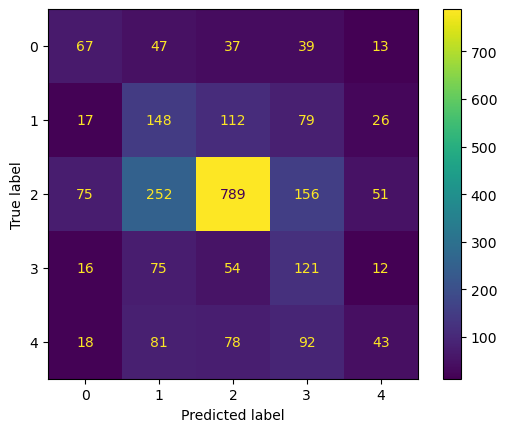

In [79]:
load_best_model_and_evaluate(path_model, test_ds)

### 2

In [12]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = data_augmentation(inputs)
x = layers.Rescaling(1./255)(x)


x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs = output)

In [13]:
compile_model(model, 'adam', 0.0001)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 200, 200, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 200, 200, 3)       0         
                                                                 
 rescaling (Rescaling)       (None, 200, 200, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 198, 198, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 99, 99, 64)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 97, 97, 128)       73856     
                                                             

In [14]:
path_model = general_path_models+'/extra_majority_multiclass_models_sc/2_scratch_DROP0.4_DATA_AUG_64_2x256_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, epochs_par=100, patience_par=50) #200x200

Epoch 1/100
313/313 [==============================] - ETA: 0s - loss: 1.5903 - accuracy: 0.2465
Epoch 00001: val_loss improved from inf to 1.63805, saving model to ./extra_majority_multiclass_models_sc\2_scratch_DROP0.4_DATA_AUG_64_2x256_epoch_40_adam_1e-4.h5
313/313 [==============================] - 58s 167ms/step - loss: 1.5903 - accuracy: 0.2465 - val_loss: 1.6381 - val_accuracy: 0.2822
Epoch 2/100
313/313 [==============================] - ETA: 0s - loss: 1.5479 - accuracy: 0.2952
Epoch 00002: val_loss improved from 1.63805 to 1.52944, saving model to ./extra_majority_multiclass_models_sc\2_scratch_DROP0.4_DATA_AUG_64_2x256_epoch_40_adam_1e-4.h5
313/313 [==============================] - 50s 157ms/step - loss: 1.5479 - accuracy: 0.2952 - val_loss: 1.5294 - val_accuracy: 0.3337
Epoch 3/100
313/313 [==============================] - ETA: 0s - loss: 1.5300 - accuracy: 0.3124
Epoch 00003: val_loss improved from 1.52944 to 1.46758, saving model to ./extra_majority_multiclass_models_sc

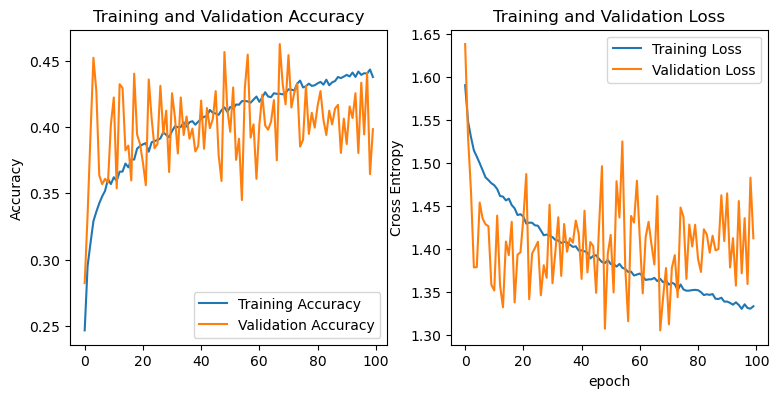

In [15]:
show_history_fit(history)

40/40 [==============================] - 6s 112ms/step - loss: 1.3228 - accuracy: 0.4608
tf.Tensor([1 2 3 ... 3 2 2], shape=(2498,), dtype=int64)
tf.Tensor([4 2 3 ... 3 2 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.2814    0.4631    0.3501       203
           1     0.2884    0.3586    0.3197       382
           2     0.7699    0.5412    0.6356      1323
           3     0.2673    0.4317    0.3301       278
           4     0.2710    0.2692    0.2701       312

    accuracy                         0.4608      2498
   macro avg     0.3756    0.4128    0.3811      2498
weighted avg     0.5383    0.4608    0.4844      2498



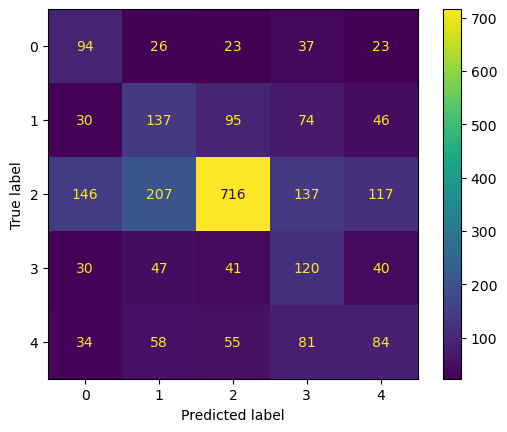

In [16]:
load_best_model_and_evaluate(path_model, test_ds)

### 3

In [ ]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = data_augmentation(inputs)
x = layers.Rescaling(1./255)(inputs)
x = layers.Conv2D(64, (5, 5), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs = output)

In [ ]:
compile_model(model, 'adam', 0.0001)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 200, 200, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 200, 200, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 196, 196, 64)      4864      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 98, 98, 64)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 96, 96, 128)       73856     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 48, 48, 128)      0         
 2D)                                                         

In [ ]:
path_model = general_path_models+'/extra_majority_multiclass_models_sc/3_scratch_DROP0.4_64_2x256_512_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, epochs_par=100, patience_par=50) #200x200

Epoch 1/100
438/438 [==============================] - ETA: 0s - loss: 1.9003 - accuracy: 0.2031
Epoch 00001: val_loss improved from inf to 1.86670, saving model to ./extra_multiclass_models_sc\3_scratch_DROP0.4_64_2x256_512_epoch_40_adam_1e-4.h5
438/438 [==============================] - 82s 171ms/step - loss: 1.9003 - accuracy: 0.2031 - val_loss: 1.8667 - val_accuracy: 0.2513
Epoch 2/100
438/438 [==============================] - ETA: 0s - loss: 1.8284 - accuracy: 0.2623
Epoch 00002: val_loss improved from 1.86670 to 1.86491, saving model to ./extra_multiclass_models_sc\3_scratch_DROP0.4_64_2x256_512_epoch_40_adam_1e-4.h5
438/438 [==============================] - 78s 175ms/step - loss: 1.8284 - accuracy: 0.2623 - val_loss: 1.8649 - val_accuracy: 0.2879
Epoch 3/100
438/438 [==============================] - ETA: 0s - loss: 1.7974 - accuracy: 0.2799
Epoch 00003: val_loss improved from 1.86491 to 1.81638, saving model to ./extra_multiclass_models_sc\3_scratch_DROP0.4_64_2x256_512_epoch

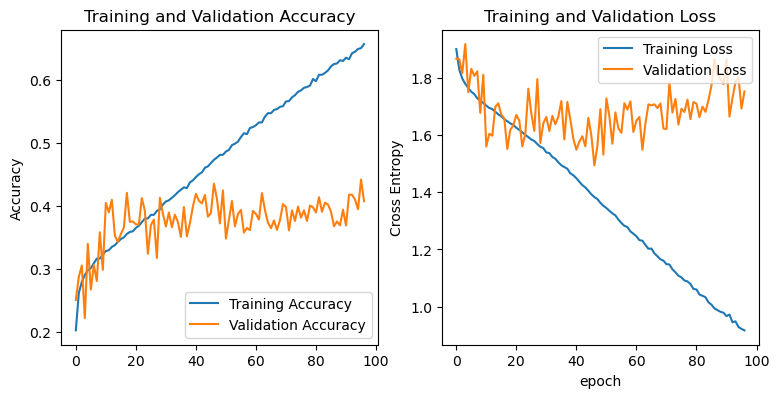

In [ ]:
show_history_fit(history)

41/41 [==============================] - 6s 116ms/step - loss: 1.5142 - accuracy: 0.4394
tf.Tensor([2 6 2 ... 5 6 6], shape=(2622,), dtype=int64)
tf.Tensor([2 2 2 ... 5 1 1], shape=(2622,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3348    0.3793    0.3557       203
           1     0.3820    0.2670    0.3143       382
           2     0.7750    0.5336    0.6321      1323
           3     0.0727    0.1569    0.0994        51
           4     0.1286    0.1233    0.1259        73
           5     0.2828    0.4964    0.3603       278
           6     0.2051    0.3590    0.2611       312

    accuracy                         0.4394      2622
   macro avg     0.3116    0.3308    0.3070      2622
weighted avg     0.5320    0.4394    0.4670      2622



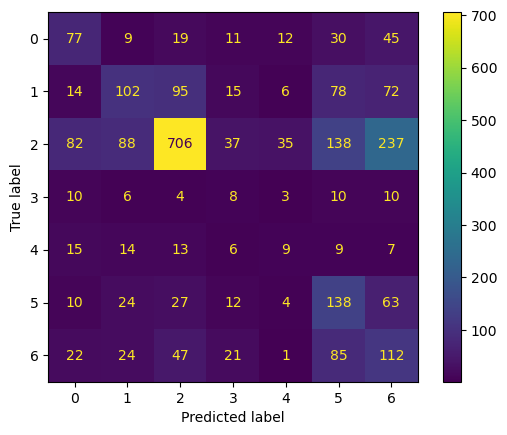

In [ ]:
load_best_model_and_evaluate(path_model, test_ds)

### 4

In [ ]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = data_augmentation(inputs)
x = layers.Rescaling(1./255)(inputs)
x = layers.Conv2D(64, (5, 5), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs = output)

In [ ]:
compile_model(model, 'adam', 0.0001)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 200, 200, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 200, 200, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 196, 196, 64)      4864      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 98, 98, 64)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 96, 96, 128)       73856     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 48, 48, 128)      0         
 2D)                                                         

In [ ]:
path_model = general_path_models+'/extra_majority_multiclass_models_sc/4_scratch_DROP0.4_64_2x256_512_epoch_40_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, epochs_par=100, patience_par=50) #200x200

Epoch 1/100
438/438 [==============================] - ETA: 0s - loss: 1.9113 - accuracy: 0.1943
Epoch 00001: val_loss improved from inf to 1.85752, saving model to ./extra_multiclass_models_sc\4_scratch_DROP0.4_64_2x256_512_epoch_40_adam_1e-4.h5
438/438 [==============================] - 84s 174ms/step - loss: 1.9113 - accuracy: 0.1943 - val_loss: 1.8575 - val_accuracy: 0.3291
Epoch 2/100
438/438 [==============================] - ETA: 0s - loss: 1.8419 - accuracy: 0.2505
Epoch 00002: val_loss improved from 1.85752 to 1.85101, saving model to ./extra_multiclass_models_sc\4_scratch_DROP0.4_64_2x256_512_epoch_40_adam_1e-4.h5
438/438 [==============================] - 75s 168ms/step - loss: 1.8419 - accuracy: 0.2505 - val_loss: 1.8510 - val_accuracy: 0.2754
Epoch 3/100
438/438 [==============================] - ETA: 0s - loss: 1.8075 - accuracy: 0.2742
Epoch 00003: val_loss improved from 1.85101 to 1.79182, saving model to ./extra_multiclass_models_sc\4_scratch_DROP0.4_64_2x256_512_epoch

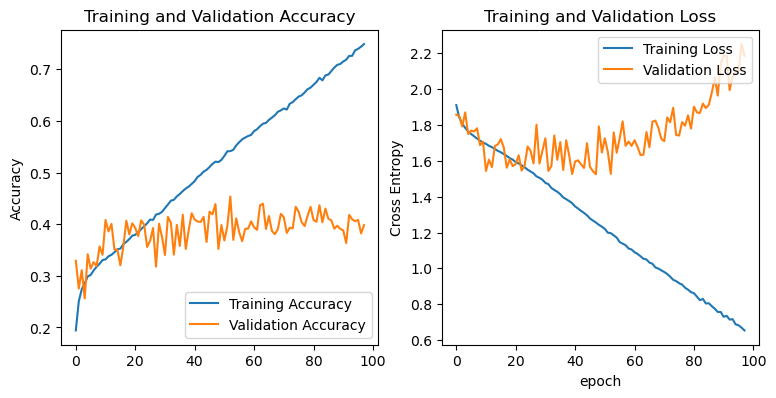

In [ ]:
show_history_fit(history)

41/41 [==============================] - 6s 114ms/step - loss: 1.5276 - accuracy: 0.4340
tf.Tensor([2 6 2 ... 5 6 6], shape=(2622,), dtype=int64)
tf.Tensor([2 2 2 ... 5 1 1], shape=(2622,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.2334    0.3990    0.2945       203
           1     0.3718    0.2696    0.3126       382
           2     0.7736    0.5321    0.6305      1323
           3     0.0578    0.1961    0.0893        51
           4     0.1250    0.2329    0.1627        73
           5     0.3815    0.3705    0.3759       278
           6     0.2358    0.3846    0.2923       312

    accuracy                         0.4340      2622
   macro avg     0.3113    0.3407    0.3083      2622
weighted avg     0.5357    0.4340    0.4674      2622



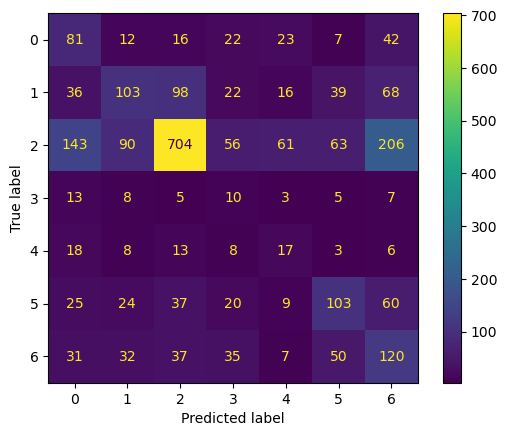

In [ ]:
load_best_model_and_evaluate(path_model, test_ds)

### 5 - No data augmentation

In [80]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu', kernel_regularizer = tf.keras.regularizers.l2(0.001))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.L1(0.001))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.L1(0.001))(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)
x = layers.Conv2D(512, (3, 3), activation='relu', padding='same', kernel_regularizer = tf.keras.regularizers.L1(0.001))(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(1024, (3, 3), activation='relu')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.L1(0.001))(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [81]:
compile_model(model, 'adam', 0.0001)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 200, 200, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 200, 200, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 198, 198, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 99, 99, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 97, 97, 64)        18496     
                                                                 
 conv2d_2 (Conv2D)           (None, 95, 95, 128)       73856     
                                                           

In [82]:
path_model = general_path_models+'/extra_majority_multiclass_models_sc/5_scratch_32_2x256_512_1024_dp_regularL1_batchnorm_epoch_100_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, 100, 50) #200x20

Epoch 1/100
313/313 [==============================] - ETA: 0s - loss: 41.9684 - accuracy: 0.3149
Epoch 00001: val_loss improved from inf to 23.92941, saving model to ./extra_majority_multiclass_models_sc\5_scratch_32_2x256_512_1024_dp_regularL1_batchnorm_epoch_100_adam_1e-4.h5
313/313 [==============================] - 111s 339ms/step - loss: 41.9684 - accuracy: 0.3149 - val_loss: 23.9294 - val_accuracy: 0.1038
Epoch 2/100
313/313 [==============================] - ETA: 0s - loss: 15.1306 - accuracy: 0.3453
Epoch 00002: val_loss improved from 23.92941 to 10.10621, saving model to ./extra_majority_multiclass_models_sc\5_scratch_32_2x256_512_1024_dp_regularL1_batchnorm_epoch_100_adam_1e-4.h5
313/313 [==============================] - 100s 312ms/step - loss: 15.1306 - accuracy: 0.3453 - val_loss: 10.1062 - val_accuracy: 0.2060
Epoch 3/100
313/313 [==============================] - ETA: 0s - loss: 7.2546 - accuracy: 0.3607
Epoch 00003: val_loss improved from 10.10621 to 5.27329, saving mo

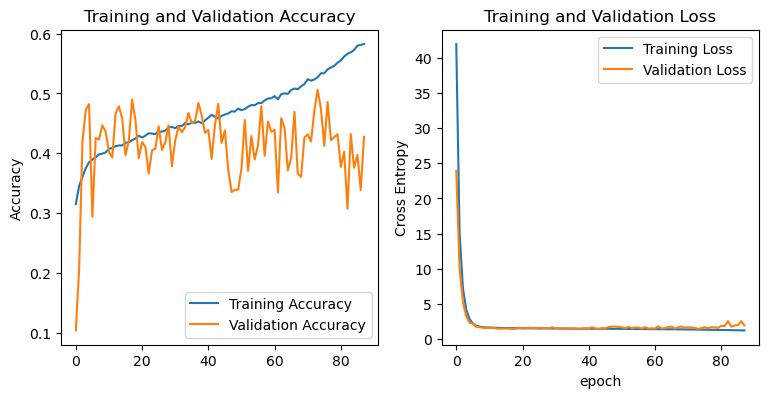

In [83]:
show_history_fit(history)

40/40 [==============================] - 7s 134ms/step - loss: 1.4170 - accuracy: 0.4652
tf.Tensor([0 3 2 ... 2 2 2], shape=(2498,), dtype=int64)
tf.Tensor([2 4 1 ... 2 2 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.2050    0.6059    0.3064       203
           1     0.4000    0.1623    0.2309       382
           2     0.7279    0.5964    0.6556      1323
           3     0.3324    0.4460    0.3810       278
           4     0.2238    0.2051    0.2140       312

    accuracy                         0.4652      2498
   macro avg     0.3778    0.4032    0.3576      2498
weighted avg     0.5283    0.4652    0.4766      2498



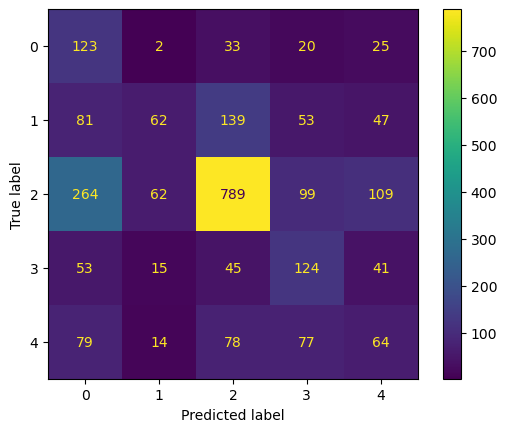

In [84]:
load_best_model_and_evaluate(path_model, test_ds)

### 6 - No data augmentation

In [ ]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))

x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(filters=96, kernel_size=(11,11), strides=(4,4), activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPool2D(pool_size=(3,3), strides=(2,2))(x)
x = layers.Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), activation='relu', padding="same")(x)
x = layers.MaxPool2D(pool_size=(3,3), strides=(2,2))(x)
x = layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same")(x)
x = layers.BatchNormalization()(x)
x = layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same")(x)

x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(1000, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

In [ ]:
compile_model(model, 'sgd', 0.001)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_2 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_8 (Conv2D)           (None, 60, 60, 96)        34944     
                                                                 
 batch_normalization_4 (Batc  (None, 60, 60, 96)       384       
 hNormalization)                                                 
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 29, 29, 96)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 29, 29, 256)       6146

In [ ]:
path_model = general_path_models+'/extra_majority_multiclass_models_sc/6_bis_scratch_32_2x256_512_1000_dp_batchnorm_epoch_100_sgd_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, 100, 30) #250x250

Epoch 1/100
437/438 [============================>.] - ETA: 0s - loss: 1.9335 - accuracy: 0.1905
Epoch 00001: val_loss improved from inf to 1.76458, saving model to ./extra_multiclass_models_sc\6_bis_scratch_32_2x256_512_1000_dp_batchnorm_epoch_100_sgd_1e-4.h5
438/438 [==============================] - 53s 117ms/step - loss: 1.9334 - accuracy: 0.1906 - val_loss: 1.7646 - val_accuracy: 0.3806
Epoch 2/100
437/438 [============================>.] - ETA: 0s - loss: 1.8847 - accuracy: 0.2274
Epoch 00002: val_loss did not improve from 1.76458
438/438 [==============================] - 53s 119ms/step - loss: 1.8847 - accuracy: 0.2274 - val_loss: 1.8319 - val_accuracy: 0.3059
Epoch 3/100
437/438 [============================>.] - ETA: 0s - loss: 1.8576 - accuracy: 0.2470
Epoch 00003: val_loss improved from 1.76458 to 1.74475, saving model to ./extra_multiclass_models_sc\6_bis_scratch_32_2x256_512_1000_dp_batchnorm_epoch_100_sgd_1e-4.h5
438/438 [==============================] - 53s 119ms/step 

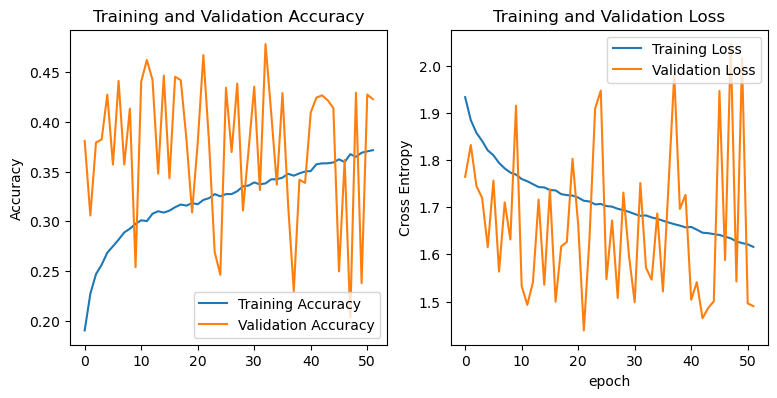

In [ ]:
show_history_fit(history)

41/41 [==============================] - 5s 92ms/step - loss: 1.4319 - accuracy: 0.4786
tf.Tensor([1 2 5 ... 5 1 2], shape=(2622,), dtype=int64)
tf.Tensor([0 5 2 ... 1 6 0], shape=(2622,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.4074    0.0542    0.0957       203
           1     0.2459    0.2723    0.2584       382
           2     0.6297    0.7521    0.6855      1323
           3     0.0000    0.0000    0.0000        51
           4     0.1489    0.1918    0.1677        73
           5     0.2722    0.3633    0.3112       278
           6     0.2500    0.0962    0.1389       312

    accuracy                         0.4786      2622
   macro avg     0.2792    0.2471    0.2368      2622
weighted avg     0.4479    0.4786    0.4451      2622



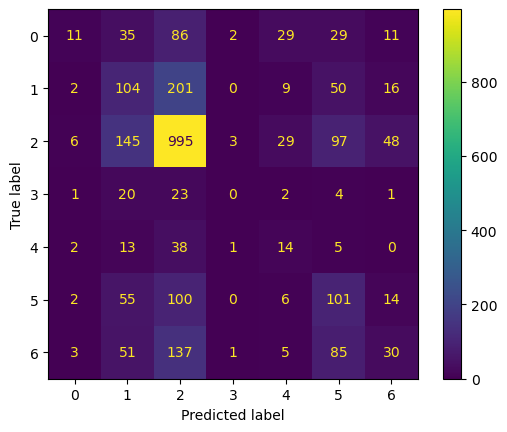

In [ ]:
path_model = general_path_models+'/extra_majority_multiclass_models_sc/6_bis_scratch_32_2x256_512_1000_dp_batchnorm_epoch_100_sgd_1e-4.h5'
load_best_model_and_evaluate(path_model, test_ds)

### 7 - No data augmentation

In [11]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
l1 = layers.Rescaling(1./255)(input)
l1 = layers.Conv2D(filters=128, kernel_size=(11,11), activation='relu')(l1) #, strides=(4,4)
l1 = layers.Conv2D(filters=128, kernel_size=(1,1), activation='relu')(l1)
l1 = layers.MaxPool2D(pool_size=(3,3))(l1)

l1_out = layers.Conv2D(filters=128, kernel_size=(1,1), activation='relu')(l1)
l1_out = layers.GlobalAveragePooling2D()(l1_out)
l1_out = layers.Dense(512, activation='relu')(l1_out)
l1_out = layers.Dropout(0.4)(l1_out)
l1_out = layers.Dense(256, activation='relu')(l1_out)

l2 = layers.Conv2D(filters=256, kernel_size=(5,5), activation='relu')(l1)
l2 = layers.Conv2D(filters=256, kernel_size=(1,1), activation='relu')(l2)
l2 = layers.MaxPool2D(pool_size=(3,3))(l2)

l2_out = layers.Conv2D(filters=128, kernel_size=(1,1), activation='relu')(l2)
l2_out = layers.GlobalAveragePooling2D()(l2_out)
l2_out = layers.Dense(512, activation='relu')(l2_out)
l2_out = layers.Dropout(0.4)(l2_out)
l2_out = layers.Dense(256, activation='relu')(l2_out)

l3 = layers.Conv2D(filters=384, kernel_size=(5,5), activation='relu')(l2)
l3 = layers.Conv2D(filters=384, kernel_size=(1,1), activation='relu')(l3)
l3 = layers.MaxPool2D(pool_size=(3,3))(l3)

l3_out = layers.Conv2D(filters=128, kernel_size=(1,1), activation='relu')(l3)
l3_out = layers.GlobalAveragePooling2D()(l3_out)
l3_out = layers.Dense(512, activation='relu')(l3_out)
l3_out = layers.Dropout(0.4)(l3_out)
l3_out = layers.Dense(256, activation='relu')(l3_out)

l4 = layers.Conv2D(filters=512, kernel_size=(5,5), activation='relu')(l3)
l4 = layers.Conv2D(filters=512, kernel_size=(1,1), activation='relu')(l4)
l4 = layers.MaxPool2D(pool_size=(3,3))(l4)

l4_out = layers.Conv2D(filters=128, kernel_size=(1,1), activation='relu')(l4)
l4_out = layers.GlobalAveragePooling2D()(l4_out)
l4_out = layers.Dense(512, activation='relu')(l4_out)
l4_out = layers.Dropout(0.4)(l4_out)
l4_out = layers.Dense(256, activation='relu')(l4_out)


merge = layers.Average()([l1_out, l2_out, l3_out, l4_out])

output = layers.Dense(NUM_CLASSES, activation='softmax')(merge)

model = tf.keras.Model(inputs=input, outputs = output)

In [12]:
compile_model(model, 'adam', 0.0001)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 260, 260, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 260, 260, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 250, 250, 12  46592       ['rescaling[0][0]']              
                                8)                                                                
                                                                                              

In [13]:
path_model = general_path_models+'/extra_majority_multiclass_models_sc/7_scratch_32_2x256_512_1000_dp_batchnorm_epoch_100_adam_true_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, 100, 30) #200x200

Epoch 1/100
1556/1556 [==============================] - ETA: 0s - loss: 1.9221 - accuracy: 0.1724
Epoch 00001: val_loss improved from inf to 1.91891, saving model to ./extra_multiclass_models_sc\7_scratch_32_2x256_512_1000_dp_batchnorm_epoch_100_adam_true_1e-4.h5


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


1556/1556 [==============================] - 277s 175ms/step - loss: 1.9221 - accuracy: 0.1724 - val_loss: 1.9189 - val_accuracy: 0.1976
Epoch 2/100
1556/1556 [==============================] - ETA: 0s - loss: 1.8281 - accuracy: 0.2562
Epoch 00002: val_loss improved from 1.91891 to 1.78462, saving model to ./extra_multiclass_models_sc\7_scratch_32_2x256_512_1000_dp_batchnorm_epoch_100_adam_true_1e-4.h5
1556/1556 [==============================] - 270s 173ms/step - loss: 1.8281 - accuracy: 0.2562 - val_loss: 1.7846 - val_accuracy: 0.3146
Epoch 3/100
1556/1556 [==============================] - ETA: 0s - loss: 1.7820 - accuracy: 0.2826
Epoch 00003: val_loss did not improve from 1.78462
1556/1556 [==============================] - 272s 174ms/step - loss: 1.7820 - accuracy: 0.2826 - val_loss: 1.8613 - val_accuracy: 0.2727
Epoch 4/100
1556/1556 [==============================] - ETA: 0s - loss: 1.7548 - accuracy: 0.3015
Epoch 00004: val_loss did not improve from 1.78462
1556/1556 [=========

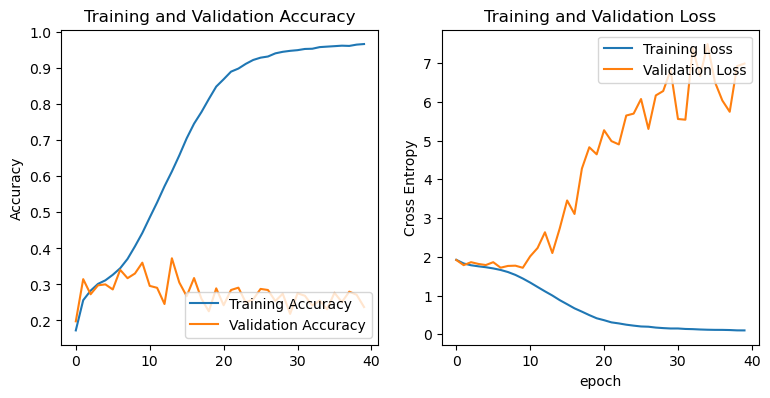

In [14]:
show_history_fit(history)

146/146 [==============================] - 9s 59ms/step - loss: 1.7748 - accuracy: 0.3429
tf.Tensor([1 2 4 ... 5 5 1], shape=(2622,), dtype=int64)
tf.Tensor([2 5 2 ... 5 1 1], shape=(2622,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.1980    0.1970    0.1975       203
           1     0.2518    0.1832    0.2121       382
           2     0.7335    0.3953    0.5138      1323
           3     0.0311    0.0980    0.0472        51
           4     0.0929    0.3425    0.1462        73
           5     0.2359    0.5252    0.3255       278
           6     0.2368    0.2885    0.2601       312

    accuracy                         0.3429      2622
   macro avg     0.2543    0.2900    0.2432      2622
weighted avg     0.4785    0.3429    0.3759      2622



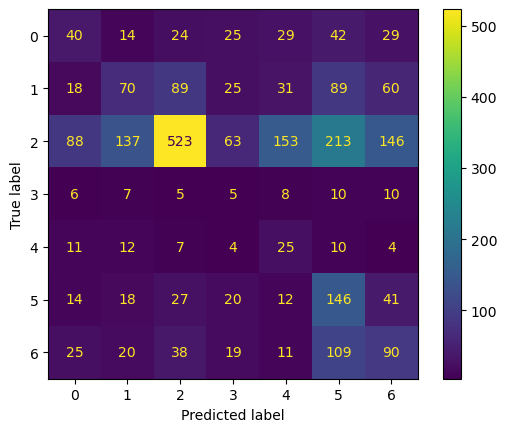

In [15]:
load_best_model_and_evaluate(path_model, test_ds)

## Try to avoid overfitting on the From Scratch Network

Use the same Networks seen in previous section but adding some layers or applying dropout on other layers

### Experiment 0

In [21]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((5, 5))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((5, 5))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)
model = tf.keras.Model(inputs=input, outputs = output)

compile_model(model, 'adam', 0.0001)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_2 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_14 (Conv2D)          (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 49, 49, 32)       0         
 2D)                                                             
                                                                 
 conv2d_15 (Conv2D)          (None, 47, 47, 64)        18496     
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 9, 9, 64)         0         
 2D)                                                       

In [22]:
path_model = general_path_models+'/extra_majority_multiclass_models_sc/ex0_scratch_dpplus_32_128_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, epochs_par=50, patience_par=10)

Epoch 1/50
313/313 [==============================] - ETA: 0s - loss: 1.6021 - accuracy: 0.2268
Epoch 00001: val_loss improved from inf to 1.58122, saving model to ./extra_majority_multiclass_models_sc\ex0_scratch_dpplus_32_128_epoch_30_adam_1e-4.h5
313/313 [==============================] - 43s 131ms/step - loss: 1.6021 - accuracy: 0.2268 - val_loss: 1.5812 - val_accuracy: 0.4060
Epoch 2/50
312/313 [============================>.] - ETA: 0s - loss: 1.5812 - accuracy: 0.2625
Epoch 00002: val_loss did not improve from 1.58122
313/313 [==============================] - 43s 134ms/step - loss: 1.5812 - accuracy: 0.2625 - val_loss: 1.5851 - val_accuracy: 0.3764
Epoch 3/50
312/313 [============================>.] - ETA: 0s - loss: 1.5644 - accuracy: 0.2885
Epoch 00003: val_loss improved from 1.58122 to 1.55103, saving model to ./extra_majority_multiclass_models_sc\ex0_scratch_dpplus_32_128_epoch_30_adam_1e-4.h5
313/313 [==============================] - 41s 129ms/step - loss: 1.5644 - accura

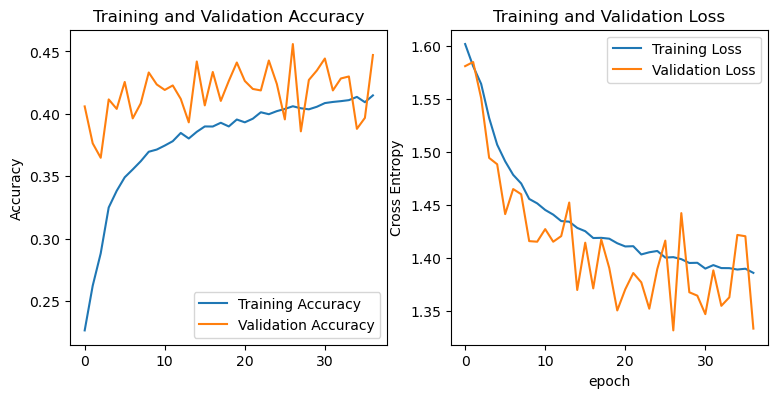

In [23]:
show_history_fit(history)

40/40 [==============================] - 10s 193ms/step - loss: 1.3441 - accuracy: 0.4424
tf.Tensor([2 0 2 ... 1 2 2], shape=(2498,), dtype=int64)
tf.Tensor([4 4 2 ... 2 2 4], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.2365    0.4975    0.3206       203
           1     0.2342    0.2330    0.2336       382
           2     0.7237    0.5503    0.6252      1323
           3     0.3034    0.4496    0.3623       278
           4     0.2271    0.1987    0.2120       312

    accuracy                         0.4424      2498
   macro avg     0.3450    0.3858    0.3507      2498
weighted avg     0.5004    0.4424    0.4597      2498



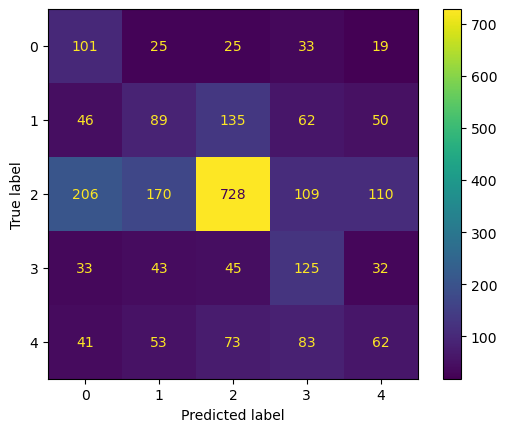

In [24]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 1

In [25]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)


x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

compile_model(model, 'adam', 0.0001)

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_3 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_17 (Conv2D)          (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 124, 124, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_18 (Conv2D)          (None, 122, 122, 64)      18496     
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 61, 61, 64)       0         
 g2D)                                                      

In [26]:
path_model = general_path_models+'/extra_majority_multiclass_models_sc/ex1_scratch_dpplus_32_128_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, epochs_par=50, patience_par=10)

Epoch 1/50
313/313 [==============================] - ETA: 0s - loss: 1.5892 - accuracy: 0.2491
Epoch 00001: val_loss improved from inf to 1.49582, saving model to ./extra_majority_multiclass_models_sc\ex1_scratch_dpplus_32_128_epoch_30_adam_1e-4.h5
313/313 [==============================] - 77s 237ms/step - loss: 1.5892 - accuracy: 0.2491 - val_loss: 1.4958 - val_accuracy: 0.4463
Epoch 2/50
313/313 [==============================] - ETA: 0s - loss: 1.5273 - accuracy: 0.3148
Epoch 00002: val_loss improved from 1.49582 to 1.48366, saving model to ./extra_majority_multiclass_models_sc\ex1_scratch_dpplus_32_128_epoch_30_adam_1e-4.h5
313/313 [==============================] - 77s 240ms/step - loss: 1.5273 - accuracy: 0.3148 - val_loss: 1.4837 - val_accuracy: 0.3872
Epoch 3/50
313/313 [==============================] - ETA: 0s - loss: 1.4966 - accuracy: 0.3407
Epoch 00003: val_loss improved from 1.48366 to 1.43239, saving model to ./extra_majority_multiclass_models_sc\ex1_scratch_dpplus_32_

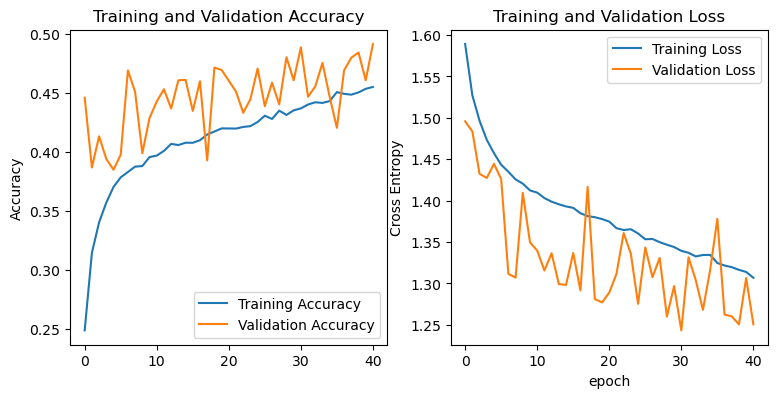

In [27]:
show_history_fit(history)

40/40 [==============================] - 6s 105ms/step - loss: 1.2539 - accuracy: 0.4848
tf.Tensor([2 2 2 ... 1 1 2], shape=(2498,), dtype=int64)
tf.Tensor([2 2 4 ... 1 1 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.2482    0.4975    0.3311       203
           1     0.3184    0.3901    0.3506       382
           2     0.7247    0.6009    0.6570      1323
           3     0.3816    0.3129    0.3439       278
           4     0.2651    0.2532    0.2590       312

    accuracy                         0.4848      2498
   macro avg     0.3876    0.4109    0.3883      2498
weighted avg     0.5283    0.4848    0.4991      2498



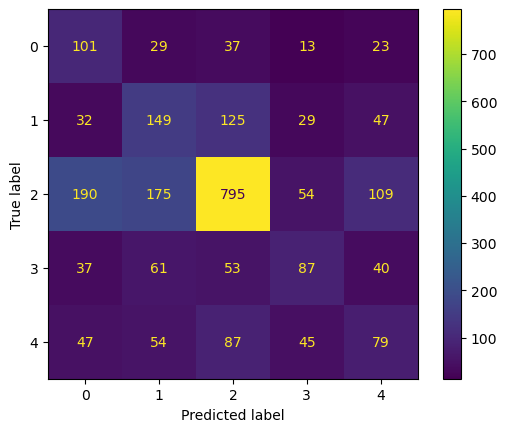

In [28]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 2

In [29]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(32, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(512, (3, 3), activation='relu')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)

compile_model(model, 'adam', 0.0001)

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_4 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_22 (Conv2D)          (None, 248, 248, 32)      896       
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 124, 124, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_23 (Conv2D)          (None, 122, 122, 64)      18496     
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 61, 61, 64)       0         
 g2D)                                                      

In [30]:
path_model = general_path_models+'/extra_majority_multiclass_models_sc/ex2_scratch_dpplus_32_128_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, epochs_par=50, patience_par=10)

Epoch 1/50
313/313 [==============================] - ETA: 0s - loss: 1.5908 - accuracy: 0.2482
Epoch 00001: val_loss improved from inf to 1.62096, saving model to ./extra_majority_multiclass_models_sc\ex2_scratch_dpplus_32_128_epoch_30_adam_1e-4.h5
313/313 [==============================] - 45s 140ms/step - loss: 1.5908 - accuracy: 0.2482 - val_loss: 1.6210 - val_accuracy: 0.3265
Epoch 2/50
313/313 [==============================] - ETA: 0s - loss: 1.5510 - accuracy: 0.2982
Epoch 00002: val_loss improved from 1.62096 to 1.55264, saving model to ./extra_majority_multiclass_models_sc\ex2_scratch_dpplus_32_128_epoch_30_adam_1e-4.h5
313/313 [==============================] - 45s 140ms/step - loss: 1.5510 - accuracy: 0.2982 - val_loss: 1.5526 - val_accuracy: 0.3381
Epoch 3/50
313/313 [==============================] - ETA: 0s - loss: 1.5100 - accuracy: 0.3279
Epoch 00003: val_loss improved from 1.55264 to 1.47382, saving model to ./extra_majority_multiclass_models_sc\ex2_scratch_dpplus_32_

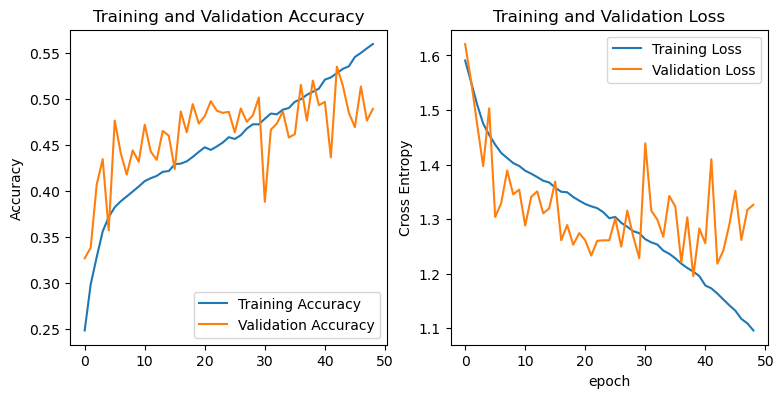

In [31]:
show_history_fit(history)

40/40 [==============================] - 6s 107ms/step - loss: 1.2080 - accuracy: 0.5160
tf.Tensor([0 2 4 ... 2 4 2], shape=(2498,), dtype=int64)
tf.Tensor([2 2 2 ... 4 1 3], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3217    0.4089    0.3601       203
           1     0.3470    0.3325    0.3396       382
           2     0.7562    0.6447    0.6960      1323
           3     0.4659    0.2950    0.3612       278
           4     0.2526    0.4615    0.3265       312

    accuracy                         0.5160      2498
   macro avg     0.4287    0.4285    0.4167      2498
weighted avg     0.5631    0.5160    0.5308      2498



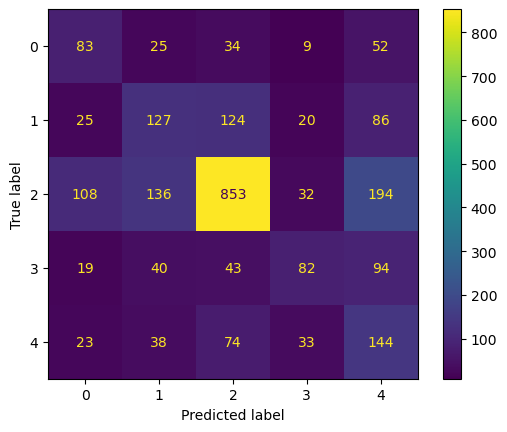

In [32]:
load_best_model_and_evaluate(path_model, test_ds)

### Experiment 3

In [33]:
input = tf.keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
x = layers.Rescaling(1./255)(input)
x = layers.Conv2D(filters=96, kernel_size=(11,11), strides=(4,4), activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPool2D(pool_size=(3,3), strides=(2,2))(x)
x = layers.Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), activation='relu', padding="same")(x)
x = layers.MaxPool2D(pool_size=(3,3), strides=(2,2))(x)
x = layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same")(x)
x = layers.BatchNormalization()(x)
x = layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same")(x)
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(1000, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.3)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=input, outputs = output)


compile_model(model, 'rmsprop', 0.0001)

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 250, 250, 3)]     0         
                                                                 
 rescaling_5 (Rescaling)     (None, 250, 250, 3)       0         
                                                                 
 conv2d_28 (Conv2D)          (None, 60, 60, 96)        34944     
                                                                 
 batch_normalization_2 (Batc  (None, 60, 60, 96)       384       
 hNormalization)                                                 
                                                                 
 max_pooling2d_17 (MaxPoolin  (None, 29, 29, 96)       0         
 g2D)                                                            
                                                                 
 conv2d_29 (Conv2D)          (None, 29, 29, 256)       6146

In [34]:
path_model = general_path_models+'/extra_majority_multiclass_models_sc/ACNN_GLOBAL_scratch_dpplus_32_128_epoch_30_adam_1e-4.h5'
history, model_fitted = fit_model(model, train_ds, val_ds, path_model, epochs_par=50, patience_par=10)

Epoch 1/50
313/313 [==============================] - ETA: 0s - loss: 1.5298 - accuracy: 0.3318
Epoch 00001: val_loss improved from inf to 1.73267, saving model to ./extra_majority_multiclass_models_sc\ACNN_GLOBAL_scratch_dpplus_32_128_epoch_30_adam_1e-4.h5
313/313 [==============================] - 44s 132ms/step - loss: 1.5298 - accuracy: 0.3318 - val_loss: 1.7327 - val_accuracy: 0.1373
Epoch 2/50
312/313 [============================>.] - ETA: 0s - loss: 1.4644 - accuracy: 0.3662
Epoch 00002: val_loss did not improve from 1.73267
313/313 [==============================] - 42s 131ms/step - loss: 1.4645 - accuracy: 0.3661 - val_loss: 2.0658 - val_accuracy: 0.1641
Epoch 3/50
313/313 [==============================] - ETA: 0s - loss: 1.4340 - accuracy: 0.3798
Epoch 00003: val_loss improved from 1.73267 to 1.68920, saving model to ./extra_majority_multiclass_models_sc\ACNN_GLOBAL_scratch_dpplus_32_128_epoch_30_adam_1e-4.h5
313/313 [==============================] - 42s 130ms/step - loss:

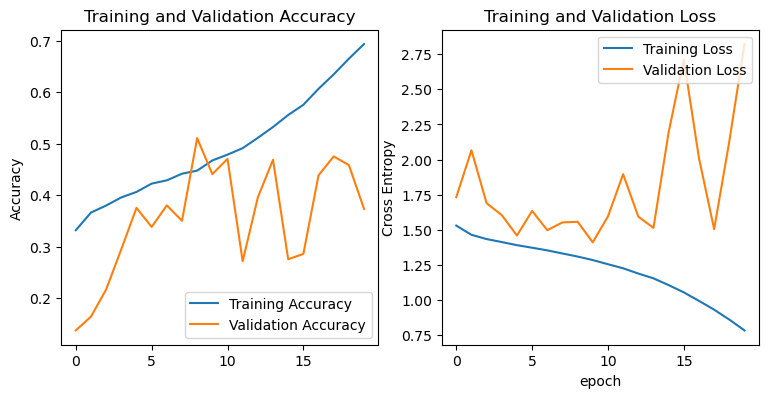

In [35]:
show_history_fit(history)

40/40 [==============================] - 5s 105ms/step - loss: 1.4014 - accuracy: 0.4412
tf.Tensor([1 1 1 ... 2 1 2], shape=(2498,), dtype=int64)
tf.Tensor([3 4 4 ... 2 2 4], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.4865    0.0887    0.1500       203
           1     0.2144    0.5942    0.3151       382
           2     0.7236    0.5540    0.6276      1323
           3     0.3300    0.3561    0.3426       278
           4     0.2809    0.0801    0.1247       312

    accuracy                         0.4412      2498
   macro avg     0.4071    0.3346    0.3120      2498
weighted avg     0.5274    0.4412    0.4464      2498



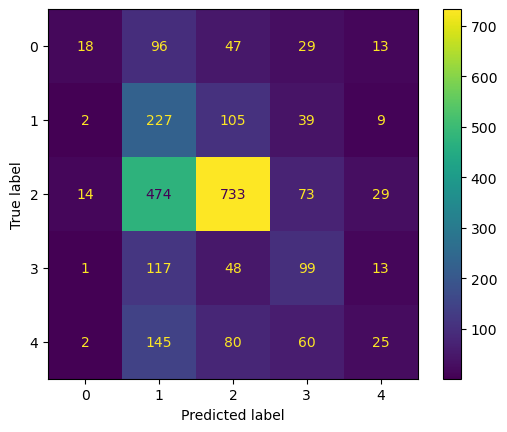

In [36]:
load_best_model_and_evaluate(path_model, test_ds)

## Trials with KERAS TUNER

### Installation

In [17]:
!pip install -q -U keras-tuner

### Code

In [18]:
base_model = tf.keras.applications.resnet50.ResNet50(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)
        
base_model.trainable = False



In [19]:
path_model_tuner = general_path_models+'/extra_majority_multiclass_models_sc/'

In [20]:
import keras_tuner as kt

def model_builder(hp):

  base_model = tf.keras.applications.resnet50.ResNet50(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
        weights='imagenet',  # load the network pretrained on ImageNet1K
        include_top=False)


  
  base_model.trainable = False
  
  inputs = tf.keras.Input(shape=INPUT_SHAPE)
  #x = data_augmentation(inputs)
  x = tf.keras.applications.resnet.preprocess_input(inputs)
  x = base_model(x, training=False)
  x = layers.GlobalAveragePooling2D()(x)

  MLP = tf.keras.Sequential(name='MLP')
  #MLP.name = 'MLP'
  hp_units = hp.Int('units', min_value=512, max_value=2048, step=384)
  hp_drop_rate = hp.Float('dropout_rate', min_value = 0, max_value = 0.8) # <--------- third HP
  #x = layers.Dropout(hp_drop_rate)(x)
  for i in range(hp.Int('layers', 1, 3)):
    MLP.add(layers.Dense(units=hp_units, activation='relu'))
    MLP.add(layers.Dropout(hp_drop_rate))

  MLP.add(layers.Dense(NUM_CLASSES))

  outputs = MLP(x)
  model = tf.keras.Model(inputs, outputs)
  
  # Tune the learning rate for the optimizer
  # Choose an optimal value from 0.001, or 0.0001 0.00001 
  hp_learning_rate = hp.Choice('learning_rate', values=[1e-3, 1e-4, 1e-5])

  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=hp_learning_rate),  
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

  return model

In [21]:
tuner = kt.Hyperband(model_builder,
                     objective='val_accuracy',
                     max_epochs=50,
                     factor=3,
                     directory=path_model_tuner,
                     project_name='tuner_3')
earlystopping = EarlyStopping(monitor='val_loss', mode='min', patience=8, verbose=1)
tuner.search(train_ds, epochs=50, validation_data=val_ds, callbacks=[earlystopping])

# Get the optimal hyperparameters
best_hps=tuner.get_best_hyperparameters(num_trials=1)[0]

tuner.search_space_summary()

print(f"""The hyperparameter search is complete. The optimal number of layers is{best_hps.get('layers')},
      the best number of neurons is {best_hps.get('units')} and the optimal learning rate for the optimizer
      is {best_hps.get('learning_rate')}""")

Trial 90 Complete [00h 15m 08s]
val_accuracy: 0.5780439376831055

Best val_accuracy So Far: 0.593612790107727
Total elapsed time: 08h 52m 52s
INFO:tensorflow:Oracle triggered exit
Search space summary
Default search space size: 4
units (Int)
{'default': None, 'conditions': [], 'min_value': 512, 'max_value': 2048, 'step': 384, 'sampling': None}
dropout_rate (Float)
{'default': 0.0, 'conditions': [], 'min_value': 0.0, 'max_value': 0.8, 'step': None, 'sampling': None}
layers (Int)
{'default': None, 'conditions': [], 'min_value': 1, 'max_value': 3, 'step': 1, 'sampling': None}
learning_rate (Choice)
{'default': 0.001, 'conditions': [], 'values': [0.001, 0.0001, 1e-05], 'ordered': True}
The hyperparameter search is complete. The optimal number of layers is1,
      the best number of neurons is 1664 and the optimal learning rate for the optimizer
      is 0.0001


In [68]:
best_hps = tuner.get_best_hyperparameters()[0]

print(f"Number of layers: {best_hps.get('layers')} \nNumber of hidden units: {best_hps.get('units')} \nDropout rate: {best_hps.get('dropout_rate')}")

Number of conv filters: 1 
Number of hidden units: 1664 
Dropout rate: 0.3245062565560452


In [69]:
best_model = tuner.get_best_models(num_models = 1)[0]

In [70]:
best_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 200, 200, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 200, 200, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 200, 200, 3)      0         
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 MLP (Sequential)            (None, 5)                 341786

In [73]:
best_model.evaluate(test_ds)
best_model.save(path_model_tuner + '/tuner_resnet_new.h5')

40/40 [==============================] - 6s 124ms/step - loss: 1.0468 - accuracy: 0.5897


c:\Users\lioma\anaconda3\envs\tensorflow_3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


In [54]:
hypermodel = tuner.hypermodel.build(best_hps)

mlp = hypermodel.get_layer("MLP")

mlp.summary()

#best_hps.get_config()

Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_25 (Dense)            (None, 1664)              3409536   
                                                                 
 dropout_13 (Dropout)        (None, 1664)              0         
                                                                 
 dense_26 (Dense)            (None, 5)                 8325      
                                                                 
Total params: 3,417,861
Trainable params: 3,417,861
Non-trainable params: 0
_________________________________________________________________


In [55]:
hypermodel = tuner.hypermodel.build(best_hps)

base_learning_rate = best_hps.get('learning_rate')

tuner_checkpoint = ModelCheckpoint(path_model_tuner + '/tuner_resnet.h5',   # I save in the older Keras H5 format due to a Tensorflow 2.7 bug
        monitor='val_loss', mode='min', verbose=1, 
        save_best_only=True, save_freq='epoch'
)

# Retrain the model
history_tuner = hypermodel.fit(train_ds, epochs=70, validation_data=val_ds, callbacks=[tuner_checkpoint, earlystopping])

Epoch 1/70
313/313 [==============================] - ETA: 0s - loss: 1.3248 - accuracy: 0.4672
Epoch 00001: val_loss improved from inf to 1.15781, saving model to ./extra_majority_multiclass_models_sc\tuner_resnet.h5
313/313 [==============================] - 49s 148ms/step - loss: 1.3248 - accuracy: 0.4672 - val_loss: 1.1578 - val_accuracy: 0.5441
Epoch 2/70
313/313 [==============================] - ETA: 0s - loss: 1.1063 - accuracy: 0.5577
Epoch 00002: val_loss improved from 1.15781 to 1.15708, saving model to ./extra_majority_multiclass_models_sc\tuner_resnet.h5
313/313 [==============================] - 49s 153ms/step - loss: 1.1063 - accuracy: 0.5577 - val_loss: 1.1571 - val_accuracy: 0.5461
Epoch 3/70
313/313 [==============================] - ETA: 0s - loss: 1.0007 - accuracy: 0.6093
Epoch 00003: val_loss improved from 1.15708 to 1.13487, saving model to ./extra_majority_multiclass_models_sc\tuner_resnet.h5
313/313 [==============================] - 50s 157ms/step - loss: 1.00

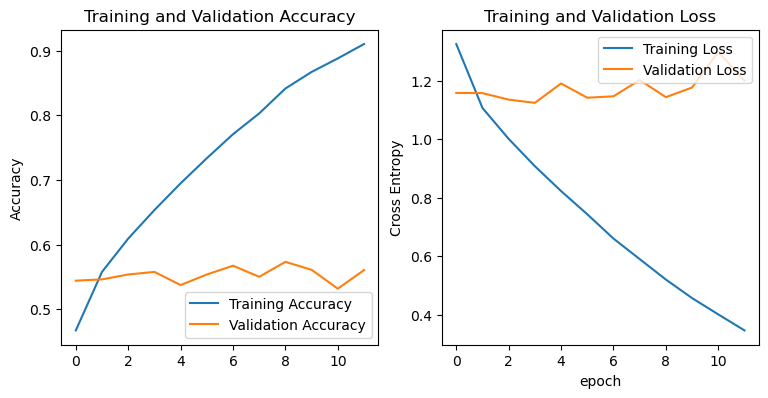

In [56]:
show_history_fit(history_tuner)

40/40 [==============================] - 8s 131ms/step - loss: 1.1407 - accuracy: 0.5528
tf.Tensor([2 2 2 ... 1 4 2], shape=(2498,), dtype=int64)
tf.Tensor([2 2 4 ... 1 1 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3256    0.5567    0.4109       203
           1     0.4397    0.4005    0.4192       382
           2     0.8499    0.6206    0.7173      1323
           3     0.4340    0.4496    0.4417       278
           4     0.3078    0.5417    0.3926       312

    accuracy                         0.5528      2498
   macro avg     0.4714    0.5138    0.4763      2498
weighted avg     0.6306    0.5528    0.5756      2498



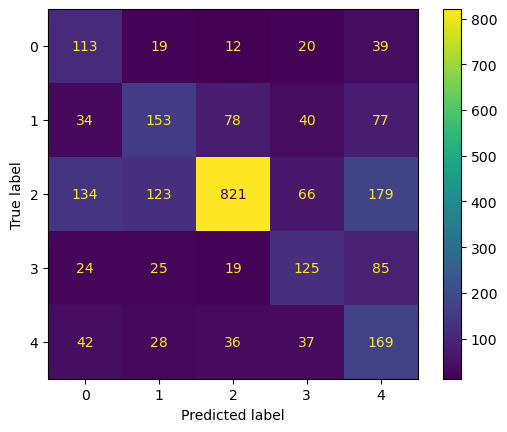

In [57]:
load_best_model_and_evaluate(path_model_tuner + '/tuner_resnet.h5', test_ds)

### Fine tunining

In [74]:
#LR = 0.0001
path_model = path_model_tuner + '/tuner_resnet_new.h5'
model_finetune = tf.keras.models.load_model(path_model)
model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 200, 200, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 200, 200, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 200, 200, 3)      0         
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 MLP (Sequential)            (None, 5)                 341786

In [75]:
model_finetune.trainable = True

base_model_resnet50 = model_finetune.get_layer("resnet50") # change the name looking at the summary IMPORTANT!
print("Number of layers in the base model: ", len(base_model_resnet50.layers))
base_model_resnet50.summary()

Number of layers in the base model:  175
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 200, 200, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 206, 206, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 100, 100, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                  

In [76]:
num_layer_trainable = 60

start_layer_to_train = len(base_model_resnet50.layers) - num_layer_trainable #

for layer in base_model_resnet50.layers[:start_layer_to_train]:
    #if layer.name.endswith('bn'):
    layer.trainable = False
    #else:
    #    layer.trainable = True

for layer in base_model_resnet50.layers[start_layer_to_train:]:
    if layer.name.endswith('bn'):
        layer.trainable = False


model_finetune.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 200, 200, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 200, 200, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 200, 200, 3)      0         
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 MLP (Sequential)            (None, 5)                 341786

In [47]:
#compile_model(model_finetune, 'adam', LR)

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_16 (InputLayer)       [(None, 200, 200, 3)]     0         
                                                                 
 tf.__operators__.getitem_7   (None, 200, 200, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_7 (TFOpLambd  (None, 200, 200, 3)      0         
 a)                                                              
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_7   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                           

In [77]:
path_model_tuned_tuner = general_path_models+'/extra_majority_multiclass_models_sc/TUNER_RESNET_FINE_NEW_tuning_512_dp_epoch_40_adam_1e-4.h5'
history_tune_tuner, model_fitted_tuned = fit_model(model_finetune, train_ds, val_ds, path_model_tuned_tuner,40,15)

Epoch 1/40
313/313 [==============================] - ETA: 0s - loss: 0.8337 - accuracy: 0.6882
Epoch 00001: val_loss improved from inf to 1.17591, saving model to ./extra_majority_multiclass_models_sc\TUNER_RESNET_FINE_NEW_tuning_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 50s 154ms/step - loss: 0.8337 - accuracy: 0.6882 - val_loss: 1.1759 - val_accuracy: 0.5413
Epoch 2/40
313/313 [==============================] - ETA: 0s - loss: 0.7408 - accuracy: 0.7279
Epoch 00002: val_loss improved from 1.17591 to 1.07473, saving model to ./extra_majority_multiclass_models_sc\TUNER_RESNET_FINE_NEW_tuning_512_dp_epoch_40_adam_1e-4.h5
313/313 [==============================] - 51s 159ms/step - loss: 0.7408 - accuracy: 0.7279 - val_loss: 1.0747 - val_accuracy: 0.5836
Epoch 3/40
313/313 [==============================] - ETA: 0s - loss: 0.6648 - accuracy: 0.7661
Epoch 00003: val_loss did not improve from 1.07473
313/313 [==============================] - 52s 161ms/step - l

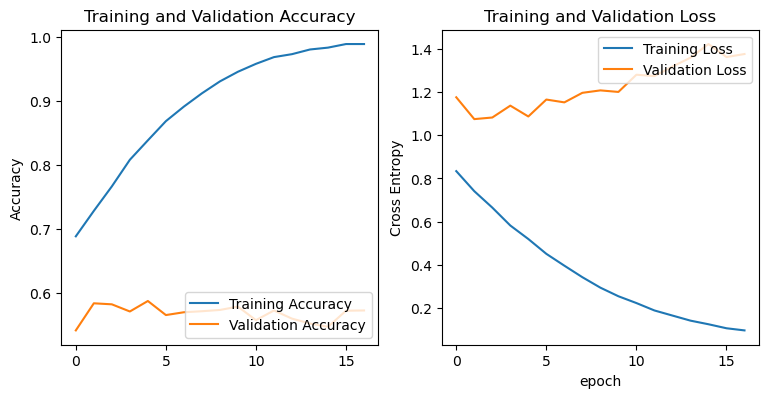

In [78]:
show_history_fit(history_tune_tuner)

40/40 [==============================] - 8s 137ms/step - loss: 1.1032 - accuracy: 0.5713
tf.Tensor([2 3 2 ... 2 1 1], shape=(2498,), dtype=int64)
tf.Tensor([2 4 1 ... 2 1 2], shape=(2498,), dtype=int32)
Classification report: 
              precision    recall  f1-score   support

           0     0.3297    0.5911    0.4233       203
           1     0.4126    0.4817    0.4444       382
           2     0.8178    0.6584    0.7295      1323
           3     0.4754    0.4173    0.4444       278
           4     0.3509    0.4263    0.3849       312

    accuracy                         0.5701      2498
   macro avg     0.4773    0.5149    0.4853      2498
weighted avg     0.6198    0.5701    0.5863      2498



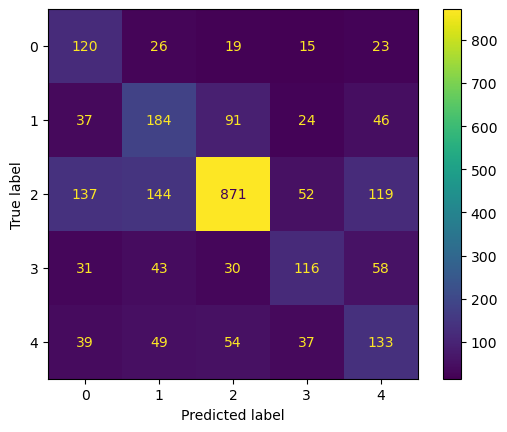

In [79]:
load_best_model_and_evaluate(path_model_tuned_tuner, test_ds)